In [ ]:
from IPython.display import clear_output

In [ ]:
! pip install SimpleITK
! pip install pydicom
clear_output()

In [ ]:
import os
import numpy as np
import SimpleITK as sitk
import pydicom
import cv2
import random
import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import pickle
import copy

In [ ]:
def set_seed(seed):
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    # torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = True
    np.random.seed(seed)
    random.seed(seed)

set_seed(42)

# Preprocessing

### Download Data

In [ ]:
from google.colab import drive
drive.mount('/content/main_drive')

Mounted at /content/main_drive


In [ ]:
!sudo add-apt-repository -y ppa:alessandro-strada/ppa 2>&1 > /dev/null
!sudo apt-get update -qq 2>&1 > /dev/null
!sudo apt -y install -qq google-drive-ocamlfuse 2>&1 > /dev/null
!google-drive-ocamlfuse



debconf: unable to initialize frontend: Dialog
debconf: (No usable dialog-like program is installed, so the dialog based frontend cannot be used. at /usr/share/perl5/Debconf/FrontEnd/Dialog.pm line 76, <> line 1.)
debconf: falling back to frontend: Readline
debconf: unable to initialize frontend: Readline
debconf: (This frontend requires a controlling tty.)
debconf: falling back to frontend: Teletype
dpkg-preconfigure: unable to re-open stdin: 
/usr/bin/xdg-open: 869: www-browser: not found
/usr/bin/xdg-open: 869: links2: not found
/usr/bin/xdg-open: 869: elinks: not found
/usr/bin/xdg-open: 869: links: not found
/usr/bin/xdg-open: 869: lynx: not found
/usr/bin/xdg-open: 869: w3m: not found
xdg-open: no method available for opening 'https://accounts.google.com/o/oauth2/auth?client_id=564921029129.apps.googleusercontent.com&redirect_uri=https%3A%2F%2Fgd-ocaml-auth.appspot.com%2Foauth2callback&scope=https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive&response_type=code&access_type=offline&

In [ ]:
!sudo apt-get install -qq w3m # to act as web browser
!xdg-settings set default-web-browser w3m.desktop # to set default browser
%cd /content
!mkdir drive
%cd drive
!mkdir MyDrive
%cd ..
%cd ..
!google-drive-ocamlfuse /content/drive/MyDrive
%cd content

debconf: unable to initialize frontend: Dialog
debconf: (No usable dialog-like program is installed, so the dialog based frontend cannot be used. at /usr/share/perl5/Debconf/FrontEnd/Dialog.pm line 76, <> line 1.)
debconf: falling back to frontend: Readline
debconf: unable to initialize frontend: Readline
debconf: (This frontend requires a controlling tty.)
debconf: falling back to frontend: Teletype
dpkg-preconfigure: unable to re-open stdin: 
Selecting previously unselected package w3m.
(Reading database ... 123074 files and directories currently installed.)
Preparing to unpack .../w3m_0.5.3-37ubuntu0.1_amd64.deb ...
Unpacking w3m (0.5.3-37ubuntu0.1) ...
Setting up w3m (0.5.3-37ubuntu0.1) ...
Processing triggers for man-db (2.9.1-1) ...
Processing triggers for mime-support (3.64ubuntu1) ...
/content
/content/drive
/content
/
Access token retrieved correctly.
/content


In [ ]:
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials

auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
my_drive = GoogleDrive(gauth)

In [ ]:
import zipfile
with zipfile.ZipFile('drive/MyDrive/CHAOS_preprocessed/CHAOS_preprocessed_v2_modified.zip', 'r') as zip_ref:
    zip_ref.extractall('.')

## My customized Dataset Class

In [ ]:
from torch.utils.data import Dataset, DataLoader

import glob

In [ ]:
def raw_preprocess(data, get_s=False):
    """
    :param data: [155,224,224]
    :return:
    """
    data = data.astype(dtype=float)
    data[data<50] = 0
    out = data.copy()
    out = (out - out.min()) / (out.max() - out.min())

    if get_s:
        share_mask = out.copy()
        share_mask[share_mask != 0] = 1
        return out, share_mask
    return out

def label_preprocess(data):
    data = data.astype(dtype=int)
    new_seg = np.zeros(data.shape, data.dtype)
    new_seg[(data > 55) & (data <= 70)] = 1
    return new_seg

In [ ]:
def img_to_label_t2(path):
    return path.replace('DICOM_anon', 'Ground').replace('.dcm', '.png')

In [ ]:
class Customized_CHAOS(Dataset):
    def __init__(self, path="CHAOS_preprocessed_v2", split='train', modals=('t2','ct'), transforms=None):
        super(Customized_CHAOS, self).__init__()
        for modal in modals:
            assert modal in {'t2','ct'}
        self.transforms = transforms
        self.split = split
        ####### Read T2 #######
        t2_img_path = sorted(glob.glob(f'{path}/{split}/t2/*/DICOM_anon/*.dcm*'))
        t2_label_path = sorted(glob.glob(f'{path}/{split}/t2/*/Ground/*.png*'))

        assert len(t2_img_path) == len(t2_label_path)
        assert list(map(img_to_label_t2, t2_img_path)) == t2_label_path

        self.t2_path = [[img, label] for img, label in zip(t2_img_path, t2_label_path)]

        ####### Read CT #######
        ct_img_path = sorted(glob.glob(f'{path}/{split}/ct/*/DICOM_anon/*.dcm*'))
        ct_label_path = sorted(glob.glob(f'{path}/{split}/ct/*/Ground/*.png*'))

        assert len(ct_img_path) == len(ct_label_path)
        self.ct_path = [[img, label] for img, label in zip(ct_img_path, ct_label_path)]

        self.new_perm()

        print("modal:{}, fold:{}, total size: t2: {}, ct: {}".format(modals,split,len(self.t2_path), len(self.ct_path)))

    def new_perm(self):
        x, y = len(self.t2_path), len(self.ct_path)
        self.randperm = torch.randperm(y)[:x]

    def __getitem__(self, idx):
        ######### Get T2 #########
        t2_img = self.t2_path[idx % len(self.t2_path)][0]

        t2_img = sitk.ReadImage(t2_img)
        t2_img = sitk.GetArrayFromImage(t2_img)[0]
        t2_img, t2_shape_mask = raw_preprocess(t2_img, True)

        t2_seg_mask = self.t2_path[idx % len(self.t2_path)][1]
        t2_seg_mask = sitk.ReadImage(t2_seg_mask)
        t2_seg_mask = label_preprocess(sitk.GetArrayFromImage(t2_seg_mask))

        ######### Get CT #########
        ct_img, ct_seg_mask = self.ct_path[self.randperm[idx]][0], self.ct_path[self.randperm[idx]][1]

        dcm = pydicom.dcmread(ct_img)
        wc = dcm.WindowCenter[0]
        ww = dcm.WindowWidth[0]
        slope = dcm.RescaleSlope
        intersept = dcm.RescaleIntercept
        low = wc - ww // 2
        high = wc + ww // 2
        img = dcm.pixel_array * slope + intersept
        img[img < low] = low
        img[img > high] = high
        img = (img - low) / (high - low)
        shape= img.copy()
        shape[shape != 0] = 1

        ct_img, ct_shape_mask = img, shape

        ct_seg_mask = sitk.ReadImage(ct_seg_mask)
        ct_seg_mask = sitk.GetArrayFromImage(ct_seg_mask)
        data = ct_seg_mask.astype(dtype=int)
        new_seg = np.zeros(data.shape, data.dtype)
        new_seg[data != 0] = 1
        ct_seg_mask = new_seg

        ######### Reset the randperm #########
        if idx == len(self) - 1:
            self.new_perm()

        ######### Some preprocessing steps #########
        if ct_img.shape[0] != 256:
            ct_img = cv2.resize(ct_img, (256, 256), interpolation=cv2.INTER_LINEAR)
            ct_seg_mask = cv2.resize(ct_seg_mask, (256, 256), interpolation=cv2.INTER_NEAREST)
            ct_shape_mask = cv2.resize(ct_shape_mask, (256, 256), interpolation=cv2.INTER_NEAREST)

        if t2_img.shape[0] != 256:
            t2_img = cv2.resize(t2_img, (256, 256), interpolation=cv2.INTER_LINEAR)
            t2_seg_mask = cv2.resize(t2_seg_mask, (256, 256), interpolation=cv2.INTER_NEAREST)
            t2_shape_mask = cv2.resize(t2_shape_mask, (256, 256), interpolation=cv2.INTER_NEAREST)

        t2_t_img = t2_img * t2_seg_mask
        ct_t_img = ct_img * ct_seg_mask

        if self.split == 'train':
            if random.random() > 0.5:
                t2_img, ct_img= cv2.flip(t2_img, 1), cv2.flip(ct_img, 1)
                t2_seg_mask, ct_seg_mask= cv2.flip(t2_seg_mask, 1), cv2.flip(ct_seg_mask, 1)
                t2_shape_mask, ct_shape_mask= cv2.flip(t2_shape_mask, 1), cv2.flip(ct_shape_mask, 1)
                t2_t_img, ct_t_img= cv2.flip(t2_t_img, 1), cv2.flip(ct_t_img, 1)

        #  scale to [-1,1]
        t2_img = (t2_img - 0.5) / 0.5
        t2_t_img = (t2_t_img - 0.5) / 0.5

        ct_img = (ct_img - 0.5) / 0.5
        ct_t_img = (ct_t_img - 0.5) / 0.5

        return (torch.from_numpy(t2_img).type(torch.FloatTensor).unsqueeze(dim=0),
                torch.from_numpy(t2_t_img).type(torch.FloatTensor).unsqueeze(dim=0),
                (torch.from_numpy(t2_shape_mask).type(torch.LongTensor).unsqueeze(dim=0),
                torch.from_numpy(t2_seg_mask).type(torch.LongTensor).unsqueeze(dim=0))), \
                \
               (torch.from_numpy(ct_img).type(torch.FloatTensor).unsqueeze(dim=0),
                torch.from_numpy(ct_t_img).type(torch.FloatTensor).unsqueeze(dim=0),
                (torch.from_numpy(ct_shape_mask).type(torch.LongTensor).unsqueeze(dim=0),
                torch.from_numpy(ct_seg_mask).type(torch.LongTensor).unsqueeze(dim=0)))

    def __len__(self):
        return min(len(self.t2_path), len(self.ct_path))


# Generator

In [ ]:
bias = False

class conv_block(nn.Module):
    # base block
    def __init__(self, ch_in, ch_out, affine=True, actv=nn.LeakyReLU(inplace=True), downsample=False, upsample=False):
        super(conv_block, self).__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(ch_in, ch_out, kernel_size=3, stride=1, padding=1, bias=bias),
            nn.InstanceNorm2d(ch_out, affine=affine),
            actv,
            nn.Conv2d(ch_out, ch_out, kernel_size=3, stride=1, padding=1, bias=bias),
            nn.InstanceNorm2d(ch_out, affine=affine),
            actv,
        )
        self.downsample = downsample
        self.upsample = upsample
        if self.upsample:
            self.up = up_conv(ch_out, ch_out // 2, affine)

    def forward(self, x):
        x1 = self.conv(x)
        c = x1.shape[1]
        if self.downsample:
            x2 = F.avg_pool2d(x1, 2)
            # half of channels for skip
            return x1[:,:c//2,:,:], x2
        # x1[:,:,:,:]
        if self.upsample:
            x2 = self.up(x1)
            return x2
        return x1


class up_conv(nn.Module):
    # base block
    def __init__(self, ch_in, ch_out, affine=True, actv=nn.LeakyReLU(inplace=True)):
        super(up_conv, self).__init__()
        self.up = nn.Sequential(
            nn.Upsample(scale_factor=2),
            nn.Conv2d(ch_in, ch_out, kernel_size=3, stride=1, padding=1, bias=bias),
            nn.InstanceNorm2d(ch_out, affine=affine),
            actv,
        )

    def forward(self, x):
        x = self.up(x)
        return x


class Encoder(nn.Module):
    # the Encoder_x or Encoder_r of G
    def __init__(self, in_c, mid_c, layers, affine):
        super(Encoder, self).__init__()
        encoder = []
        for i in range(layers):
            encoder.append(conv_block(in_c, mid_c, affine, downsample=True, upsample=False))
            in_c = mid_c
            mid_c = mid_c * 2
        self.encoder = nn.Sequential(*encoder)

    def forward(self, x):
        res = []
        for layer in self.encoder:
            x1, x2 = layer(x)
            res.append([x1, x2])
            x = x2
        return res

class ShareNet(nn.Module):
    # the Share Block of G
    def __init__(self, in_c, out_c, layers, affine,r):
        super(ShareNet, self).__init__()
        encoder = []
        decoder = []
        for i in range(layers-1):
            encoder.append(conv_block(in_c, in_c * 2, affine, downsample=True, upsample=False))
            decoder.append(conv_block(out_c-r, out_c//2, affine, downsample=False, upsample=True))
            in_c = in_c * 2
            out_c = out_c // 2
            r = r//2
        self.bottom = conv_block(in_c, in_c * 2, affine, upsample=True)
        self.encoder = nn.Sequential(*encoder)
        self.decoder = nn.Sequential(*decoder)
        self.layers = layers

    def forward(self, x):
        encoder_output = []
        x = x[-1][1]
        for layer in self.encoder:
            x1,x2 = layer(x)
            encoder_output.append([x1, x2])
            x = x2
        bottom_output = self.bottom(x)
        if self.layers == 1:
            return bottom_output
        encoder_output.reverse()
        for i, layer in enumerate(self.decoder):
            x = torch.cat([bottom_output, encoder_output[i][0]], dim=1)
            x = layer(x)
            bottom_output = x
        return x


class Decoder(nn.Module):
    # the Decoder_x or Decoder_r of G
    def __init__(self, in_c, mid_c, layers, affine, r):
        super(Decoder, self).__init__()
        decoder = []
        for i in range(layers-1):
            decoder.append(conv_block(in_c-r, mid_c, affine, downsample=False, upsample=True))
            in_c = mid_c
            mid_c = mid_c // 2
            r = r//2
        decoder.append(conv_block(in_c-r, mid_c, affine, downsample=False, upsample=False))
        self.decoder = nn.Sequential(*decoder)

    def forward(self, share_input, encoder_input):
        encoder_input.reverse()
        x = 0
        for i, layer in enumerate(self.decoder):
            x = torch.cat([share_input, encoder_input[i][0]], dim=1)
            x = layer(x)
            share_input = x
        return x

In [ ]:
class Generator(nn.Module):
    # the G of TarGAN

    def __init__(self, in_c, mid_c, layers, s_layers, affine, last_ac=True):
        super(Generator, self).__init__()
        self.img_encoder = Encoder(in_c, mid_c, layers, affine)
        self.img_decoder = Decoder(mid_c * (2 ** layers), mid_c * (2 ** (layers - 1)), layers, affine,64)
        self.target_encoder = Encoder(in_c, mid_c, layers, affine)
        self.target_decoder = Decoder(mid_c * (2 ** layers), mid_c * (2 ** (layers - 1)), layers, affine,64)
        self.share_net = ShareNet(mid_c * (2 ** (layers - 1)), mid_c * (2 ** (layers - 1 + s_layers)), s_layers, affine,256)
        self.out_img = nn.Conv2d(mid_c, 1, 1, bias=bias)
        self.out_tumor = nn.Conv2d(mid_c, 1, 1, bias=bias)
        self.last_ac = last_ac

    def forward(self, img, tumor=None, c=None, mode="train"):
        # c = c.view(c.size(0), c.size(1), 1, 1)
        # c = c.repeat(1, 1, img.size(2), img.size(3))
        # img = torch.cat([img, c], dim=1)
        x_1 = self.img_encoder(img)
        s_1 = self.share_net(x_1)
        res_img = self.out_img(self.img_decoder(s_1,x_1))
        if self.last_ac:
            res_img = torch.tanh(res_img)
        if mode == "train":
            # tumor = torch.cat([tumor, c], dim=1)
            x_2 = self.target_encoder(tumor)
            s_2 = self.share_net(x_2)
            res_tumor = self.out_tumor(self.target_decoder(s_2, x_2))
            if self.last_ac:
                res_tumor = torch.tanh(res_tumor)
            return res_img, res_tumor
        return res_img

# Discriminator

In [ ]:
class Discriminator(nn.Module):
    # the D_x or D_r of TarGAN ( backbone of PatchGAN )

    def __init__(self, image_size=256, c_dim=1, conv_dim=64, repeat_num=3):
        super(Discriminator, self).__init__()
        layers = []
        layers.append(nn.Conv2d(1, conv_dim, kernel_size=4, stride=2, padding=1))
        layers.append(nn.LeakyReLU(0.01))

        curr_dim = conv_dim
        for i in range(1, repeat_num):
            layers.append(nn.Conv2d(curr_dim, curr_dim * 2, kernel_size=4, stride=2, padding=1))
            layers.append(nn.LeakyReLU(0.01))
            curr_dim = curr_dim * 2

        layers.append(nn.Conv2d(curr_dim, 1, kernel_size=3, stride=1, padding=1, bias=False))

        self.main = nn.Sequential(*layers)


    def forward(self, x):
        h = self.main(x)
        return h

# Training

### Dataloader

In [ ]:
# syn_dataset = ChaosDataset_Syn_new(path='drive/MyDrive/CHAO_preprocessed/CHAOS_preprocessed_small', split='train', modals=('t2', 'ct'))
# syn_loader = DataLoader(syn_dataset, batch_size=2, shuffle=True)

In [ ]:
CHAOS_dataset = Customized_CHAOS(split='train', modals=('t2','ct'))
CHAOS_dataloader = DataLoader(CHAOS_dataset, batch_size=2, shuffle=True)

modal:('t2', 'ct'), fold:train, total size: t2: 506, ct: 523


**Test**

In [ ]:
# (t2_x_real, t2_t_img, (_, t2_mask)), (ct_x_real, ct_t_img, (_, ct_mask)) = next(iter(CHAOS_dataloader))
# torch.isnan(ct_mask).any()

In [ ]:
# (t2_x_real, t2_t_img, t2_shape_mask, t2_mask, t2_label_org),  (ct_x_real, ct_t_img, ct_shape_mask, ct_mask, ct_label_org)= next(iter(syn_loader))
# t2_x_real.shape, ct_x_real.shape

### Generator & Discriminator Initializing

In [ ]:
from torch.cuda.amp import GradScaler

from torch.optim.lr_scheduler import MultiStepLR


glr = 1e-4
dlr = 8e-4
betas = (0.5, 0.9)
device = 'cuda'

genCT2MR = Generator(1, 64, 2, 3, True, True).to(device)
genCT2MR_use = copy.deepcopy(genCT2MR).to(device)
genMR2CT = Generator(1, 64, 2, 3, True, True).to(device)
gen_opt = torch.optim.Adam(list(genCT2MR.parameters()) + list(genMR2CT.parameters()), lr=glr, betas=betas)
gen_opt.zero_grad()

scheduler = MultiStepLR(gen_opt,
                        milestones=[18, 25, 35], # List of epoch indices
                        gamma =0.5) # Multiplicative factor of learning rate decay

# scheduler = StepLR(gen_opt,
#                    step_size = 3, # Period of learning rate decay
#                    gamma = 0.8) # Multiplicative factor of learning rate decay

disc_x_MR = Discriminator(c_dim=1, image_size=256).to(device)
disc_x_MR_opt = torch.optim.Adam(disc_x_MR.parameters(), lr=dlr, betas=betas)
disc_x_MR_opt.zero_grad()

disc_t_MR = Discriminator(c_dim=1, image_size=256).to(device)
disc_t_MR_opt = torch.optim.Adam(disc_t_MR.parameters(), lr=dlr, betas=betas)
disc_t_MR_opt.zero_grad()

disc_t_CT = Discriminator(c_dim=1, image_size=256).to(device)
disc_t_CT_opt = torch.optim.Adam(disc_t_CT.parameters(), lr=dlr, betas=betas)
disc_t_CT_opt.zero_grad()

disc_x_CT = Discriminator(c_dim=1, image_size=256).to(device)
disc_x_CT_opt = torch.optim.Adam(disc_x_CT.parameters(), lr=dlr, betas=betas)
disc_x_CT_opt.zero_grad()

def weights_init(m):
    if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
    if isinstance(m, nn.BatchNorm2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
        torch.nn.init.constant_(m.bias, 0)

genCT2MR.apply(weights_init)
genCT2MR_use.apply(weights_init)
genMR2CT.apply(weights_init)
disc_x_MR.apply(weights_init)
disc_t_MR.apply(weights_init)
disc_t_CT.apply(weights_init)
disc_x_CT.apply(weights_init)

disc_x_MR_scaler = GradScaler()
disc_t_MR_scaler = GradScaler()
disc_x_CT_scaler = GradScaler()
disc_t_CT_scaler = GradScaler()
gen_scaler = GradScaler()

### Discriminator Loss

In [ ]:
adv_criterion = nn.MSELoss()
# adv_criterion = nn.BCEWithLogitsLoss()
recon_criterion = nn.L1Loss()

In [ ]:
from tqdm import tqdm

In [ ]:
def get_disc_loss(real_X, fake_X, disc_X, adv_criterion):
    disc_fake_X_hat = disc_X(fake_X.detach()) # Detach generator
    disc_fake_X_loss = adv_criterion(disc_fake_X_hat, torch.zeros_like(disc_fake_X_hat))
    disc_real_X_hat = disc_X(real_X)
    disc_real_X_loss = adv_criterion(disc_real_X_hat, torch.ones_like(disc_real_X_hat))
    disc_loss = (disc_fake_X_loss + disc_real_X_loss) / 2

    return disc_loss

In [ ]:
def loss_filter(mask,device="cuda"):
    list = []
    for i, m in enumerate(mask):
        if torch.any(m != 0):
            list.append(i)
    index = torch.tensor(list, dtype=torch.long).to(device)
    return index

**Test**: 2 Discriminator for `t2`, 2 Discriminator for `ct`

In [ ]:
# # Update Discrimnator CT
# disc_x_CT_opt.zero_grad()
# disc_t_CT_opt.zero_grad()

# with torch.no_grad():
#     ct_x_fake, ct_t_fake = genMR2CT(t2_x_real, t2_t_img, mode="train")

# # whole images
# diss_x_CT_loss = get_disc_loss(ct_x_real, ct_x_fake, disc_x_CT, adv_criterion)
# diss_x_CT_loss.backward()
# disc_x_CT_opt.step()

# # tumor images
# real_tumor_index = loss_filter(ct_t_img)
# fake_tumor_index = loss_filter(t2_t_img)

# have_turmor_ct_t_img = torch.index_select(ct_t_img, dim=0, index=real_tumor_index)
# have_turmor_ct_t_fake = torch.index_select(ct_t_fake, dim=0, index=fake_tumor_index)

# diss_t_CT_loss = get_disc_loss(have_turmor_ct_t_img, have_turmor_ct_t_fake, disc_t_CT, adv_criterion)
# diss_t_CT_loss.backward()
# disc_t_CT_opt.step()

In [ ]:
# # Update Discrimnator MR
# disc_x_MR_opt.zero_grad()
# disc_t_MR_opt.zero_grad()

# with torch.no_grad():
#     t2_x_fake, t2_t_fake = genCT2MR(ct_x_real, ct_t_img, mode="train")

# # whole image
# diss_x_MR_loss = get_disc_loss(t2_x_real, t2_x_fake, disc_x_MR, adv_criterion)
# diss_x_MR_loss.backward()
# disc_x_MR_opt.step()

# # tumor image
# real_tumor_index = loss_filter(t2_t_img)
# fake_tumor_index = loss_filter(ct_t_img)

# have_tumor_t2_t_img = torch.index_select(t2_t_img, dim=0, index=real_tumor_index)
# have_tumor_t2_t_fake = torch.index_select(t2_t_fake, dim=0, index=fake_tumor_index)

# disc_t_MR_loss = get_disc_loss(have_tumor_t2_t_img, have_tumor_t2_t_fake, disc_t_MR, adv_criterion)
# disc_t_MR_loss.backward()
# disc_t_MR_opt.step()

### Generator Loss

In [ ]:
def get_gen_adversarial_loss(real_x_X, real_t_X, disc_x_Y, disc_t_Y, gen_XY, adv_criterion):
    fake_x_Y, fake_t_Y = gen_XY(real_x_X, real_t_X)
    disc_fake_x_Y_hat = disc_x_Y(fake_x_Y)
    disc_fake_t_Y_hat = disc_t_Y(fake_t_Y)

    adversarial_loss_x = adv_criterion(disc_fake_x_Y_hat, torch.ones_like(disc_fake_x_Y_hat))
    adversarial_loss_t = adv_criterion(disc_fake_t_Y_hat, torch.ones_like(disc_fake_t_Y_hat))

    return adversarial_loss_x + adversarial_loss_t, fake_x_Y, fake_t_Y

In [ ]:
def get_identity_loss(real_x_X, real_t_X, gen_YX, identity_criterion):
    identity_x_X, identity_t_X = gen_YX(real_x_X, real_t_X)

    identity_x_loss = identity_criterion(identity_x_X, real_x_X)
    identity_t_loss = identity_criterion(identity_t_X, real_t_X)

    return identity_x_loss + identity_t_loss

In [ ]:
def get_cycle_consistency_loss(real_x_X, real_t_X, fake_x_Y, fake_t_Y, gen_YX, cycle_criterion):
    cycle_x_X, cycle_t_X = gen_YX(fake_x_Y, fake_t_Y)

    cycle_loss_x = cycle_criterion(cycle_x_X, real_x_X)
    cycle_loss_t = cycle_criterion(cycle_t_X, real_t_X)

    return cycle_loss_x + cycle_loss_t

In [ ]:
def get_cross_loss(fake_x_A, fake_t_A, mask_A, fake_x_B, fake_t_B, mask_B, cross_criterion):
  loss_A = cross_criterion(fake_x_A * mask_A, fake_t_A)
  loss_B = cross_criterion(fake_x_B * mask_B, fake_t_B)

  return loss_A + loss_B

In [ ]:
def get_gen_loss(real_x_A, real_t_A, real_x_B, real_t_B, gen_AB, gen_BA, disc_x_A, disc_t_A, disc_x_B, disc_t_B,
                 adv_criterion, identity_criterion, cycle_criterion, lambda_identity=0.1, lambda_cycle=10):

    # Adversarial Loss -- get_gen_adversarial_loss(real_X, disc_Y, gen_XY, adv_criterion)
    adv_loss_BA, fake_x_A, fake_t_A = get_gen_adversarial_loss(real_x_B, real_t_B, disc_x_A, disc_t_A, gen_BA, adv_criterion)
    adv_loss_AB, fake_x_B, fake_t_B = get_gen_adversarial_loss(real_x_A, real_t_A, disc_x_B, disc_t_B, gen_AB, adv_criterion)
    gen_adversarial_loss = adv_loss_BA + adv_loss_AB

    # Identity Loss -- get_identity_loss(real_X, gen_YX, identity_criterion)
    identity_loss_A = get_identity_loss(real_x_A, real_t_A ,gen_BA, identity_criterion)
    identity_loss_B = get_identity_loss(real_x_B, real_t_B, gen_AB, identity_criterion)
    gen_identity_loss = identity_loss_A + identity_loss_B

    # Cycle-consistency Loss -- get_cycle_consistency_loss(real_X, fake_Y, gen_YX, cycle_criterion)
    cycle_loss_BA = get_cycle_consistency_loss(real_x_A, real_t_A, fake_x_B, fake_t_B, gen_BA, cycle_criterion)
    cycle_loss_AB = get_cycle_consistency_loss(real_x_B, real_t_B, fake_x_A, fake_t_A, gen_AB, cycle_criterion)
    gen_cycle_loss = cycle_loss_BA + cycle_loss_AB

    # Total loss
    gen_loss = lambda_identity * gen_identity_loss + lambda_cycle * gen_cycle_loss + gen_adversarial_loss

    return gen_loss, gen_adversarial_loss, gen_identity_loss, gen_cycle_loss, (fake_x_A, fake_t_A) , (fake_x_B, fake_t_B)

**Test**

In [ ]:
# gen_loss, fake_ct, fake_t2 = get_gen_loss(ct_x_real, ct_t_img, t2_x_real, t2_t_img, genCT2MR, genMR2CT, disc_x_CT, disc_t_CT, disc_x_MR, disc_t_MR,
#                        adv_criterion=adv_criterion, identity_criterion=recon_criterion, cycle_criterion=recon_criterion)

In [ ]:
# gen_loss.backward()
# gen_opt.step()

### Training loop

In [ ]:
from torchvision.utils import make_grid
import matplotlib.pyplot as plt

In [ ]:
# Use for plotting images in training loop
def show_tensor_images(image_tensor, num_images=25, size=(1, 256, 256)):
    '''
    Function for visualizing images: Given a tensor of images, number of images, and
    size per image, plots and prints the images in an uniform grid.
    '''
    image_tensor[0] = (image_tensor[0] + 1) / 2
    image_tensor = torch.cat([image_tensor[0], image_tensor[1]])
    image_shifted = image_tensor
    image_unflat = image_shifted.detach().cpu().view(-1, *size)
    image_grid = make_grid(image_unflat[:num_images], nrow=6)

    plt.figure(figsize=(12, 12))
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

In [ ]:
import nibabel as nib

In [ ]:
!mkdir input output

def nnUNet_predict(t2_fake):
  affine = np.eye(4)

  for i, img in enumerate(t2_fake):
    x = img.permute(1,2,0).numpy().copy()

    nii_file = nib.Nifti1Image(x, affine)

    nib.save(nii_file, f'input/{i}_0000.nii.gz')

  !nnUNetv2_predict -d Dataset001_Liver -i input -o output -f  0 1 2 3 4 -tr nnUNetTrainer -c 2d -p nnUNetPlans -device cuda

  predictions = torch.zeros_like(t2_fake)

  for i in range(len(t2_fake)):
    predictions[i] = torch.from_numpy(nib.load(f'output/{i}.nii.gz').get_fdata()).permute(2,0,1)

  return predictions

# x = nnUNet_predict(t2_x_real)

In [ ]:
def set_requires_grad(nets, requires_grad=False):
  """Set requies_grad=Fasle for all the networks to avoid unnecessary computations
  Parameters:
      nets (network list)   -- a list of networks
      requires_grad (bool)  -- whether the networks require gradients or not
  """
  if not isinstance(nets, list):
      nets = [nets]
  for net in nets:
      if net is not None:
          for param in net.parameters():
              param.requires_grad = requires_grad

#### FID function

In [ ]:
from torch.cuda.amp import GradScaler, autocast

In [ ]:
def get_ct_img(path):
  dcm = pydicom.dcmread(path)
  wc = dcm.WindowCenter[0]
  ww = dcm.WindowWidth[0]
  slope = dcm.RescaleSlope
  intersept = dcm.RescaleIntercept
  low = wc - ww // 2
  high = wc + ww // 2
  img = dcm.pixel_array * slope + intersept
  img[img < low] = low
  img[img > high] = high
  img = (img - low) / (high - low)
  shape= img.copy()
  shape[shape != 0] = 1

  img = cv2.resize(img, (256, 256), interpolation=cv2.INTER_LINEAR)

  img = (img - 0.5) / 0.5

  return torch.from_numpy(img).type(torch.FloatTensor).unsqueeze(dim=0)

def raw_preprocess(data, get_s=False):
    """
    :param data: [155,224,224]
    :return:
    """
    data = data.astype(dtype=float)
    data[data<50] = 0
    out = data.copy()
    out = (out - out.min()) / (out.max() - out.min())
    # out = (out - 0.5) / 0.5
    if get_s:
        share_mask = out.copy()
        share_mask[share_mask != 0] = 1
        return out, share_mask
    return out

def get_t2(path):
  img = sitk.ReadImage(path)
  img = sitk.GetArrayFromImage(img)[0]

  img = raw_preprocess(img)
  img = cv2.resize(img, (256, 256), interpolation=cv2.INTER_LINEAR)

  return img

In [ ]:
ct_img_path = sorted(glob.glob('CHAOS_preprocessed_v2/train/ct/*/DICOM_anon/*.dcm*'))
ct_batch = torch.cat(list(map(get_ct_img, ct_img_path))).unsqueeze(1)

t2_img_path = glob.glob('CHAOS_preprocessed_v2/train/t2/*/DICOM_anon/*.dcm')
t2_real = list(map(get_t2, t2_img_path))

!pip install pytorch-fid
clear_output()

def create_t2_fake(gen1):
  gen1.eval()

  interval = len(ct_batch) // 26
  num_interval = 26
  s = 0
  with torch.inference_mode():
    for i in range(1,num_interval+1):
      with autocast():
        t2_fake_1_real = gen1(ct_batch[s:(interval*i)].to(device), mode='test').detach().cpu().numpy()
        t2_fake_1_real = t2_fake_1_real * 0.5 + 0.5

      for j in range(interval):
        cv2.imwrite(f'FID/t2_fake/{j+s}.png', cv2.cvtColor((t2_fake_1_real[j][0] * 255).round().astype(np.uint8),cv2.COLOR_GRAY2RGB))

      s = interval*i

    if s - 1 < len(ct_batch):
      with autocast():
        t2_fake_1_real = gen1(ct_batch[s:len(ct_batch)].to(device), mode='test').detach().cpu().numpy()
        t2_fake_1_real = t2_fake_1_real * 0.5 + 0.5

      for j in range(len(t2_fake_1_real)):
        cv2.imwrite(f'FID/t2_fake/{j+s}.png', cv2.cvtColor((t2_fake_1_real[j][0] * 255).round().astype(np.uint8),cv2.COLOR_GRAY2RGB))

    gen1.train()

def create_t2_real(t2_real):
  for i in range(len(t2_real)):
    cv2.imwrite(f'FID/t2_real/{i}.png', cv2.cvtColor((t2_real[i] * 255).round().astype(np.uint8),cv2.COLOR_GRAY2RGB))


def calculate_FID(gen1):
  !rm -r FID
  !mkdir FID FID/{t2_fake,t2_real}

  create_t2_fake(gen1)
  create_t2_real(t2_real)

  !python -m pytorch_fid FID/t2_fake FID/t2_real --device cuda --dim 768

#### Automatic Mixed Precision + Accumulated

In [ ]:
def moving_average(model, model_test, beta=0.999):
  for param, param_test in zip(model.parameters(), model_test.parameters()):
    param_test.data = torch.lerp(param.data, param_test.data, beta)

In [ ]:
def train_mixed_precision_accumulation(genCT2MR, genMR2CT, gen_opt,
          disc_x_MR, disc_x_MR_opt, disc_t_MR, disc_t_MR_opt,
          disc_t_CT, disc_t_CT_opt, disc_x_CT, disc_x_CT_opt,
          gen_scaler, disc_x_MR_scaler, disc_t_MR_scaler, disc_x_CT_scaler, disc_t_CT_scaler,
          n_epoch, curr_epoch, curr_step, curr_batch, device, batchsize, experiment, dict_loss):
  display_step = 1024 # 4 batch_size (1 step = 2/64 batch_size -> 128 step -> 4 batch_size)
  target_size = 256

  display_imgs = [] # use for display multiple images of multiple batches

  mean_discriminator_x_MR_loss = 0
  mean_discriminator_t_MR_loss = 0
  mean_discriminator_x_CT_loss = 0
  mean_discriminator_t_CT_loss = 0

  mean_generator_loss = 0
  mean_generator_cycle_loss = 0
  mean_generator_adversarial_loss = 0
  mean_generator_identity_loss = 0

  step = 1

  # batchsize_flag = 0

  for epoch in range(n_epoch):
    curr_epoch += 1

    # # Increase batchsize every 5 epochs
    # if ((curr_epoch // 5) != batchsize_flag):
    #   batchsize *= 2
    #   batchsize_flag = curr_epoch // 5

    for (t2_x_real, t2_t_img, (_, t2_mask)),  (ct_x_real, ct_t_img, (_, ct_mask)) in tqdm(CHAOS_dataloader):
      curr_step += 1
      curr_batch += 2

      t2_x_real = t2_x_real.to(device)
      t2_t_img = t2_t_img.to(device)
      t2_mask = t2_mask.to(device)

      ct_x_real = ct_x_real.to(device)
      ct_t_img = ct_t_img.to(device)
      ct_mask = ct_mask.to(device)

      ############## Update Discrimnator CT ##############

      with torch.no_grad():
          ct_x_fake, ct_t_fake = genMR2CT(t2_x_real, t2_t_img, mode="train")
      # whole images
      with autocast():
        disc_x_CT_loss = get_disc_loss(ct_x_real, ct_x_fake, disc_x_CT, adv_criterion)
      disc_x_CT_scaler.scale(disc_x_CT_loss).backward()

      if curr_batch % batchsize == 0:
        disc_x_CT_scaler.step(disc_x_CT_opt)
        disc_x_CT_scaler.update()
        disc_x_CT_opt.zero_grad()


      # tumor images
      real_tumor_index = loss_filter(ct_t_img)
      fake_tumor_index = loss_filter(t2_t_img)

      have_turmor_ct_t_img = torch.index_select(ct_t_img, dim=0, index=real_tumor_index)
      have_turmor_ct_t_fake = torch.index_select(ct_t_fake, dim=0, index=fake_tumor_index)

      with autocast():
        disc_t_CT_loss = get_disc_loss(have_turmor_ct_t_img, have_turmor_ct_t_fake, disc_t_CT, adv_criterion)
      disc_t_CT_scaler.scale(disc_t_CT_loss).backward()

      if curr_batch % batchsize == 0:
        disc_t_CT_scaler.step(disc_t_CT_opt)
        disc_t_CT_scaler.update()
        disc_t_CT_opt.zero_grad()

      ############## Update Discrimnator MR ##############

      with torch.no_grad():
          t2_x_fake, t2_t_fake = genCT2MR(ct_x_real, ct_t_img, mode="train")
      # whole image
      with autocast():
        disc_x_MR_loss = get_disc_loss(t2_x_real, t2_x_fake, disc_x_MR, adv_criterion)
      disc_x_MR_scaler.scale(disc_x_MR_loss).backward()

      if curr_batch % batchsize == 0:
        disc_x_MR_scaler.step(disc_x_MR_opt)
        disc_x_MR_scaler.update()
        disc_x_MR_opt.zero_grad()

      # tumor image
      real_tumor_index = loss_filter(t2_t_img)
      fake_tumor_index = loss_filter(ct_t_img)

      have_tumor_t2_t_img = torch.index_select(t2_t_img, dim=0, index=real_tumor_index)
      have_tumor_t2_t_fake = torch.index_select(t2_t_fake, dim=0, index=fake_tumor_index)

      with autocast():
        disc_t_MR_loss = get_disc_loss(have_tumor_t2_t_img, have_tumor_t2_t_fake, disc_t_MR, adv_criterion)
      disc_t_MR_scaler.scale(disc_t_MR_loss).backward()

      if curr_batch % batchsize == 0:
        disc_t_MR_scaler.step(disc_t_MR_opt)
        disc_t_MR_scaler.update()
        disc_t_MR_opt.zero_grad()

      ############## Update Generator ##############
      set_requires_grad([disc_x_CT, disc_t_CT, disc_x_MR, disc_t_MR], False)

      with autocast():
        gen_loss, gen_adversarial_loss, gen_identity_loss, gen_cycle_loss, fake_ct, fake_t2 = get_gen_loss(ct_x_real, ct_t_img, t2_x_real, t2_t_img,
                                                  genCT2MR, genMR2CT, disc_x_CT, disc_t_CT, disc_x_MR, disc_t_MR,
                                                  adv_criterion=adv_criterion, identity_criterion=recon_criterion,
                                                  cycle_criterion=recon_criterion)
      gen_scaler.scale(gen_loss).backward()

      if curr_batch % batchsize == 0:
        gen_scaler.step(gen_opt)
        gen_scaler.update()
        gen_opt.zero_grad()
        moving_average(genCT2MR, genCT2MR_use, beta=0.999)

      if curr_batch % 1000 == 0:
        curr_batch = 0

      set_requires_grad([disc_x_CT, disc_t_CT, disc_x_MR, disc_t_MR], True)
      # Keep track of the average discriminator loss
      mean_discriminator_x_MR_loss += disc_x_MR_loss.item() / display_step
      mean_discriminator_t_MR_loss += disc_t_MR_loss.item() / display_step
      mean_discriminator_x_CT_loss += disc_x_CT_loss.item() / display_step
      mean_discriminator_t_CT_loss += disc_t_CT_loss.item() / display_step
      # Keep track of the average generator loss
      mean_generator_loss += gen_loss.item() / display_step
      mean_generator_adversarial_loss += gen_adversarial_loss.item() / display_step
      mean_generator_cycle_loss += gen_cycle_loss.item() / display_step
      mean_generator_identity_loss += gen_identity_loss.item() / display_step

      if experiment != None:
        experiment.log_metrics({"disc_x_MR": mean_discriminator_x_MR_loss,
                                "disc_t_MR": mean_discriminator_t_MR_loss,
                                "disc_x_CT": mean_discriminator_x_CT_loss,
                                "disc_t_CT": mean_discriminator_t_CT_loss,
                                "gen": mean_generator_loss}, step=curr_step)

      # Store images to for displaying
      if (curr_step % display_step) > 1020:
        with autocast():
          t2_fake = genCT2MR_use(ct_x_real.detach(), mode='test').detach().cpu().to(torch.float32)
        predictions = nnUNet_predict(t2_fake)

        display_imgs.append([[torch.cat([t2_x_real.cpu().detach(), ct_x_real.cpu().detach()]),
                              ct_mask.cpu().detach()],
                             [torch.cat([fake_ct[0].to(torch.float32).cpu().detach(), t2_fake]),
                              predictions.cpu().detach()]])

      ############## Visualization Code ##############
      if curr_step % display_step == 0:
        print(f"Epoch: {curr_epoch}, Step: {curr_step}, Generator Loss: {mean_generator_loss} \n\
        Learning rate: {gen_opt.param_groups[0]['lr']} \n\
        Adversarial Loss: {mean_generator_adversarial_loss} \n\
        Cycle Loss: {mean_generator_cycle_loss} \n\
        Identity Loss: {mean_generator_identity_loss} \n\
        MR-Discriminator of whole image Loss: {mean_discriminator_x_MR_loss}\n\
        MR-Discriminator of tumor image Loss: {mean_discriminator_t_MR_loss}\n\
        CT-Discriminator of whole image Loss: {mean_discriminator_x_CT_loss}\n\
        CT-Discriminator of tumor image Loss: {mean_discriminator_t_CT_loss}\n\
        Numb of unique element in t2: {len(np.unique(fake_t2[0].cpu().to(torch.float32).detach()[0].numpy()))}")

        calculate_FID(genCT2MR_use)

        dict_loss['Learning rate'].append(gen_opt.param_groups[0]['lr'])
        dict_loss['Adversarial Loss'].append(mean_generator_adversarial_loss)
        dict_loss['Cycle Loss'].append(mean_generator_cycle_loss)
        dict_loss['Identity Loss'].append(mean_generator_identity_loss)
        dict_loss['MR-Discriminator of whole image Loss'].append(mean_discriminator_x_MR_loss)
        dict_loss['MR-Discriminator of tumor image Loss'].append(mean_discriminator_t_MR_loss)
        dict_loss['CT-Discriminator of whole image Loss'].append(mean_discriminator_x_CT_loss)
        dict_loss['CT-Discriminator of tumor image Loss'].append(mean_discriminator_t_CT_loss)
        dict_loss['display_step'].append(display_step*step)
        step += 1

        # show_tensor_images(torch.cat([t2_x_real, ct_x_real]), size=(1, target_size, target_size))
        # show_tensor_images(torch.cat([fake_ct[0].to(torch.float32), fake_t2[0].to(torch.float32)]), size=(1, target_size, target_size)) # [0]: whole image, [1]: tumor image

        for real, fake in display_imgs:
          show_tensor_images(real, size=(1, target_size, target_size))
          show_tensor_images(fake, size=(1, target_size, target_size))
        display_imgs = []

        mean_discriminator_x_MR_loss = 0
        mean_discriminator_t_MR_loss = 0
        mean_discriminator_x_CT_loss = 0
        mean_discriminator_t_CT_loss = 0

        mean_generator_loss = 0
        mean_generator_adversarial_loss = 0
        mean_generator_cycle_loss = 0
        mean_generator_identity_loss = 0

        MODELS_DRIVE_PATH = f'main_drive/MyDrive/tarGAN_saved_models/Version19/19.6_saved_models_{curr_step}.pt'

        # if os.path.exists(f'main_drive/MyDrive/tarGAN_saved_models/Version19/19.6_saved_models_{curr_step - display_step}.pt'):
        #   for a_file in my_drive.ListFile({'q': f"title = '19.6_saved_models_{curr_step - display_step}.pt'"}).GetList():
        #     a_file.Trash()
        #     print(f'the file "{a_file["title"]}", is about to get deleted permanently.')
        #     a_file.Delete()

        torch.save({
            'current_epoch': curr_epoch,
            'current_step': curr_step,
            'current_batch': curr_batch,

            'disc_x_MR_state_dict': disc_x_MR.state_dict(),
            'disc_x_MR_opt_state_dict': disc_x_MR_opt.state_dict(),
            'disc_x_MR_scaler_state_dict': disc_x_MR_scaler.state_dict(),

            'disc_t_MR_state_dict': disc_t_MR.state_dict(),
            'disc_t_MR_opt_state_dict': disc_t_MR_opt.state_dict(),
            'disc_t_MR_scaler_state_dict': disc_t_MR_scaler.state_dict(),

            'disc_t_CT_state_dict': disc_t_CT.state_dict(),
            'disc_t_CT_opt_state_dict': disc_t_CT_opt.state_dict(),
            'disc_t_CT_scaler_state_dict': disc_t_CT_scaler.state_dict(),

            'disc_x_CT_state_dict': disc_x_CT.state_dict(),
            'disc_x_CT_opt_state_dict': disc_x_CT_opt.state_dict(),
            'disc_x_CT_scaler_state_dict': disc_x_CT_scaler.state_dict(),

            'genCT2MR_state_dict': genCT2MR.state_dict(),
            'genCT2MR_use_state_dict': genCT2MR_use.state_dict(),
            'genMR2CT_state_dict': genMR2CT.state_dict(),
            'gen_opt_state_dict': gen_opt.state_dict(),
            'gen_scaler_state_dict': gen_scaler.state_dict(),

            'disc_x_MR_scaler_state_dict': disc_x_MR_scaler.state_dict(),
            'disc_t_MR_scaler_state_dict': disc_t_MR_scaler.state_dict(),
            'disc_x_CT_scaler_state_dict': disc_x_CT_scaler.state_dict(),
            'disc_t_CT_scaler_state_dict': disc_t_CT_scaler.state_dict(),
            'gen_scaler_state_dict': gen_scaler.state_dict(),

            'scheduler_state_dict': scheduler.state_dict()

        }, MODELS_DRIVE_PATH)

    scheduler.step()


#### AMP + Accumulated `train()`

##### Start epoch 0

In [ ]:
! git clone https://github.com/LeTruongVu2k1/Customized-nnUNet.git
! cd Customized-nnUNet
! pip install -e ./Customized-nnUNet

clear_output()

In [ ]:
os.environ['nnUNet_raw'] = "drive/MyDrive/nnUNet/nnUNet_raw"
os.environ['nnUNet_preprocessed'] = "drive/MyDrive/nnUNet/nnUNet_preprocessed"
os.environ['nnUNet_results'] = "drive/MyDrive/nnUNet/nnUNet_results"

  3%|▎         | 8/253 [00:03<01:34,  2.61it/s]


#######################################################################
Please cite the following paper when using nnU-Net:
Isensee, F., Jaeger, P. F., Kohl, S. A., Petersen, J., & Maier-Hein, K. H. (2021). nnU-Net: a self-configuring method for deep learning-based biomedical image segmentation. Nature methods, 18(2), 203-211.
#######################################################################

There are 2 cases in the source folder
I am process 0 out of 1 (max process ID is 0, we start counting with 0!)
There are 2 cases that I would like to predict
using pin_memory on device 0

Predicting 0:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 0

Predicting 1:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 1


  4%|▎         | 9/253 [00:49<1:00:25, 14.86s/it]


#######################################################################
Please cite the following paper when using nnU-Net:
Isensee, F., Jaeger, P. F., Kohl, S. A., Petersen, J., & Maier-Hein, K. H. (2021). nnU-Net: a self-configuring method for deep learning-based biomedical image segmentation. Nature methods, 18(2), 203-211.
#######################################################################

There are 2 cases in the source folder
I am process 0 out of 1 (max process ID is 0, we start counting with 0!)
There are 2 cases that I would like to predict
using pin_memory on device 0

Predicting 0:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 0

Predicting 1:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 1


  4%|▍         | 10/253 [01:12<1:10:15, 17.35s/it]


#######################################################################
Please cite the following paper when using nnU-Net:
Isensee, F., Jaeger, P. F., Kohl, S. A., Petersen, J., & Maier-Hein, K. H. (2021). nnU-Net: a self-configuring method for deep learning-based biomedical image segmentation. Nature methods, 18(2), 203-211.
#######################################################################

There are 2 cases in the source folder
I am process 0 out of 1 (max process ID is 0, we start counting with 0!)
There are 2 cases that I would like to predict
using pin_memory on device 0

Predicting 0:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 0

Predicting 1:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 1


  4%|▍         | 11/253 [01:47<1:30:59, 22.56s/it]

Epoch: 5, Step: 1024, Generator Loss: 9.757337186019868 
        Learning rate: 0.0001 
        Adversarial Loss: 2.2357470268616453 
        Cycle Loss: 0.7369431654806249 
        Identity Loss: 1.5215852769324556 
        MR-Discriminator of whole image Loss: 0.15699898908860632
        MR-Discriminator of tumor image Loss: 0.15231586098298067
        CT-Discriminator of whole image Loss: 0.19062142950861016
        CT-Discriminator of tumor image Loss: 0.16344247288725455
        Numb of unique element in t2: 4394
rm: cannot remove 'FID': No such file or directory
Downloading: "https://github.com/mseitzer/pytorch-fid/releases/download/fid_weights/pt_inception-2015-12-05-6726825d.pth" to /root/.cache/torch/hub/checkpoints/pt_inception-2015-12-05-6726825d.pth
100% 91.2M/91.2M [00:02<00:00, 46.2MB/s]
100% 11/11 [00:02<00:00,  5.47it/s]
100% 11/11 [00:01<00:00,  7.66it/s]
FID:  3.6290564905352047


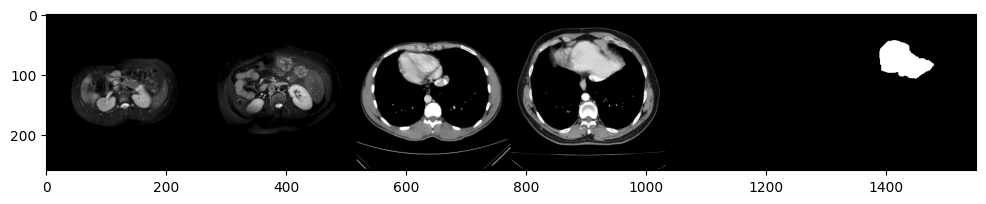

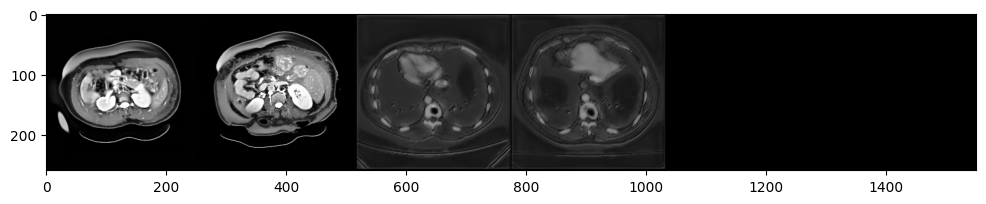

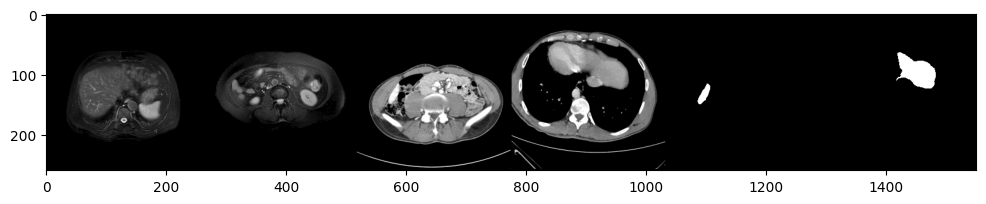

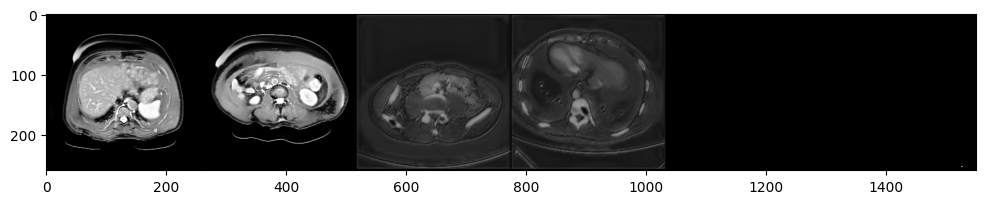

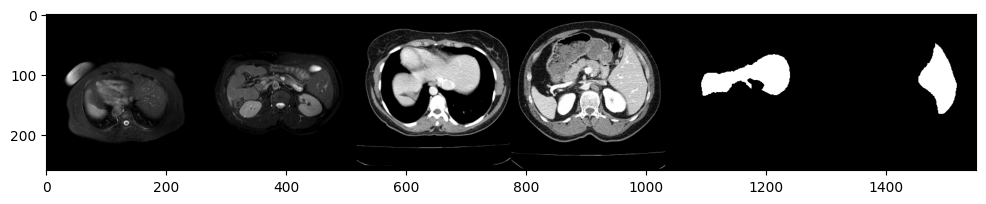

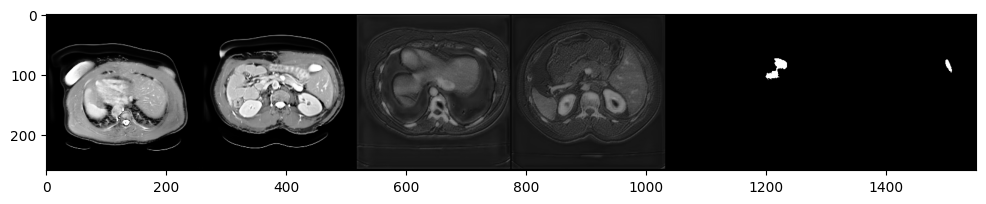

  8%|▊         | 20/253 [00:08<01:41,  2.29it/s]


#######################################################################
Please cite the following paper when using nnU-Net:
Isensee, F., Jaeger, P. F., Kohl, S. A., Petersen, J., & Maier-Hein, K. H. (2021). nnU-Net: a self-configuring method for deep learning-based biomedical image segmentation. Nature methods, 18(2), 203-211.
#######################################################################

There are 2 cases in the source folder
I am process 0 out of 1 (max process ID is 0, we start counting with 0!)
There are 2 cases that I would like to predict
using pin_memory on device 0

Predicting 0:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 0

Predicting 1:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 1


  8%|▊         | 21/253 [01:12<1:15:41, 19.58s/it]


#######################################################################
Please cite the following paper when using nnU-Net:
Isensee, F., Jaeger, P. F., Kohl, S. A., Petersen, J., & Maier-Hein, K. H. (2021). nnU-Net: a self-configuring method for deep learning-based biomedical image segmentation. Nature methods, 18(2), 203-211.
#######################################################################

There are 2 cases in the source folder
I am process 0 out of 1 (max process ID is 0, we start counting with 0!)
There are 2 cases that I would like to predict
using pin_memory on device 0

Predicting 0:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 0

Predicting 1:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 1


  9%|▊         | 22/253 [01:36<1:20:43, 20.97s/it]


#######################################################################
Please cite the following paper when using nnU-Net:
Isensee, F., Jaeger, P. F., Kohl, S. A., Petersen, J., & Maier-Hein, K. H. (2021). nnU-Net: a self-configuring method for deep learning-based biomedical image segmentation. Nature methods, 18(2), 203-211.
#######################################################################

There are 2 cases in the source folder
I am process 0 out of 1 (max process ID is 0, we start counting with 0!)
There are 2 cases that I would like to predict
using pin_memory on device 0

Predicting 0:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 0

Predicting 1:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 1


  9%|▉         | 23/253 [01:56<1:19:31, 20.75s/it]

Epoch: 9, Step: 2048, Generator Loss: 2.2027940129628405 
        Learning rate: 0.0001 
        Adversarial Loss: 1.2968619135790505 
        Cycle Loss: 0.08799949073727475 
        Identity Loss: 0.2593719431824866 
        MR-Discriminator of whole image Loss: 0.23280606234038714
        MR-Discriminator of tumor image Loss: 0.24583428734331392
        CT-Discriminator of whole image Loss: 0.21177893711137585
        CT-Discriminator of tumor image Loss: 0.24305369914509356
        Numb of unique element in t2: 2626
100% 11/11 [00:01<00:00,  6.01it/s]
100% 11/11 [00:01<00:00,  7.66it/s]
FID:  1.7079508076758518


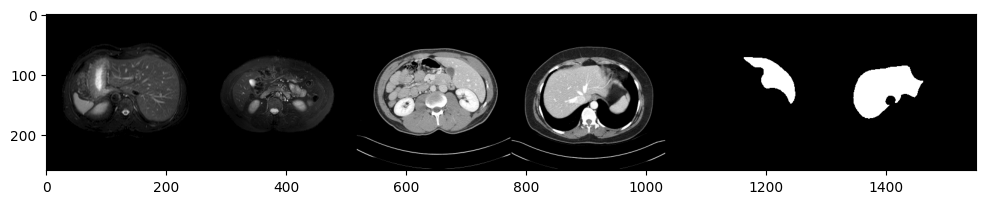

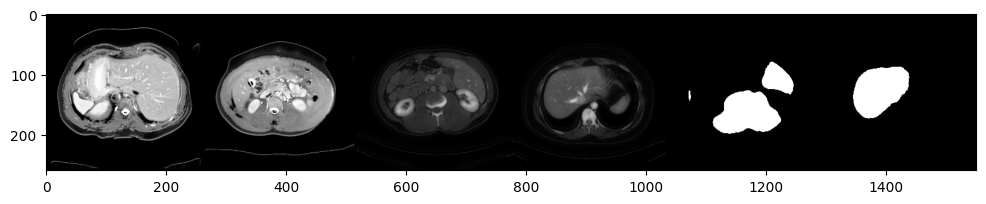

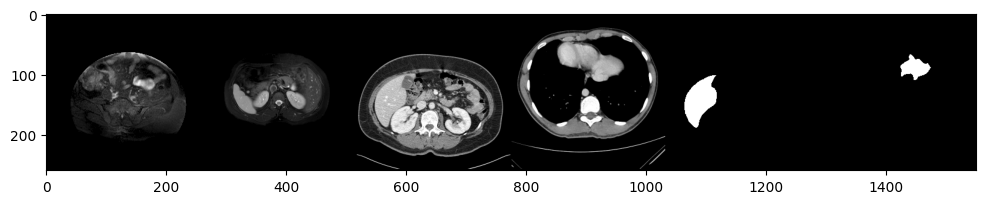

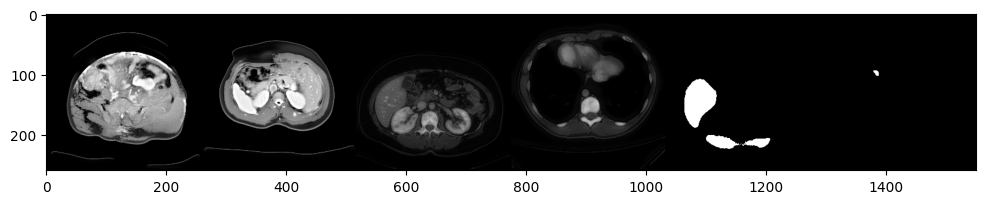

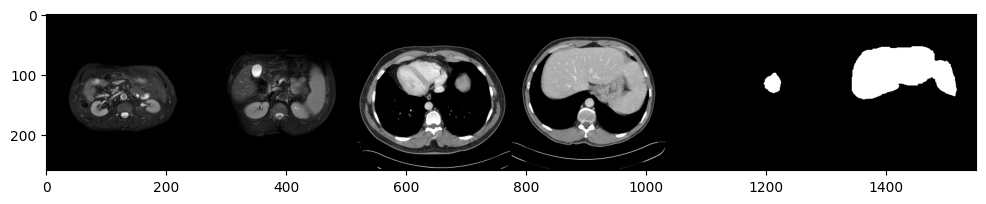

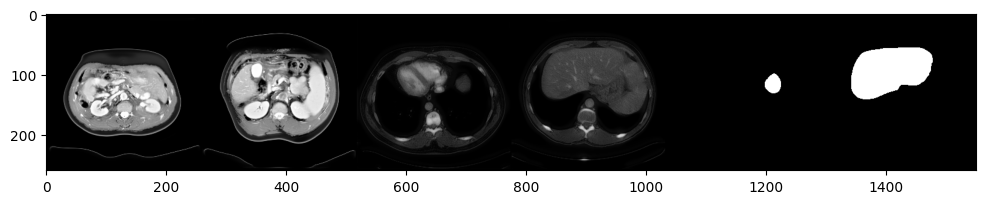

 13%|█▎        | 32/253 [00:13<01:27,  2.51it/s]


#######################################################################
Please cite the following paper when using nnU-Net:
Isensee, F., Jaeger, P. F., Kohl, S. A., Petersen, J., & Maier-Hein, K. H. (2021). nnU-Net: a self-configuring method for deep learning-based biomedical image segmentation. Nature methods, 18(2), 203-211.
#######################################################################

There are 2 cases in the source folder
I am process 0 out of 1 (max process ID is 0, we start counting with 0!)
There are 2 cases that I would like to predict
using pin_memory on device 0

Predicting 0:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 0

Predicting 1:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 1


 13%|█▎        | 33/253 [00:37<27:35,  7.53s/it]


#######################################################################
Please cite the following paper when using nnU-Net:
Isensee, F., Jaeger, P. F., Kohl, S. A., Petersen, J., & Maier-Hein, K. H. (2021). nnU-Net: a self-configuring method for deep learning-based biomedical image segmentation. Nature methods, 18(2), 203-211.
#######################################################################

There are 2 cases in the source folder
I am process 0 out of 1 (max process ID is 0, we start counting with 0!)
There are 2 cases that I would like to predict
using pin_memory on device 0

Predicting 0:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 0

Predicting 1:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 1


 13%|█▎        | 34/253 [00:58<42:53, 11.75s/it]


#######################################################################
Please cite the following paper when using nnU-Net:
Isensee, F., Jaeger, P. F., Kohl, S. A., Petersen, J., & Maier-Hein, K. H. (2021). nnU-Net: a self-configuring method for deep learning-based biomedical image segmentation. Nature methods, 18(2), 203-211.
#######################################################################

There are 2 cases in the source folder
I am process 0 out of 1 (max process ID is 0, we start counting with 0!)
There are 2 cases that I would like to predict
using pin_memory on device 0

Predicting 0:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 0

Predicting 1:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 1


 14%|█▍        | 35/253 [01:19<52:42, 14.51s/it]

Epoch: 13, Step: 3072, Generator Loss: 2.0883942019427195 
        Learning rate: 0.0001 
        Adversarial Loss: 1.3307299084262922 
        Cycle Loss: 0.07409874377481174 
        Identity Loss: 0.1667685707070632 
        MR-Discriminator of whole image Loss: 0.22861385928990785
        MR-Discriminator of tumor image Loss: 0.2461958835774567
        CT-Discriminator of whole image Loss: 0.19453185492602643
        CT-Discriminator of tumor image Loss: 0.25017971615307033
        Numb of unique element in t2: 3431
100% 11/11 [00:01<00:00,  6.43it/s]
100% 11/11 [00:01<00:00,  7.65it/s]
FID:  1.3189839601986744


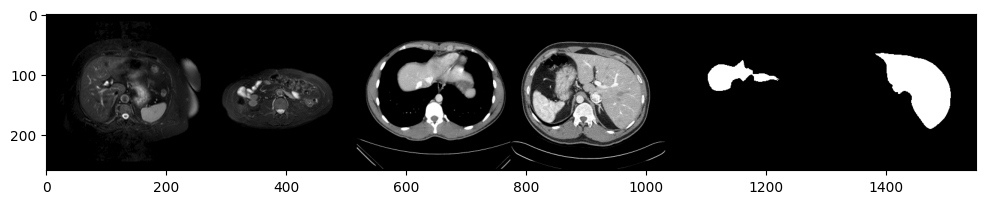

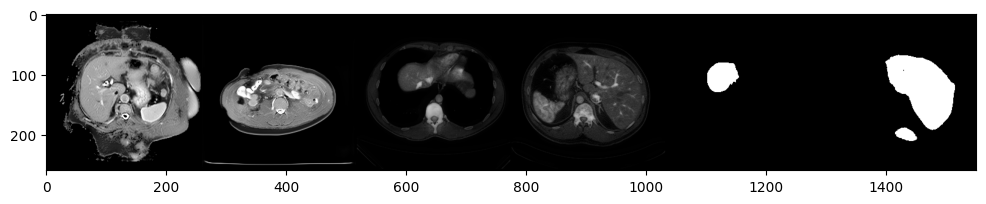

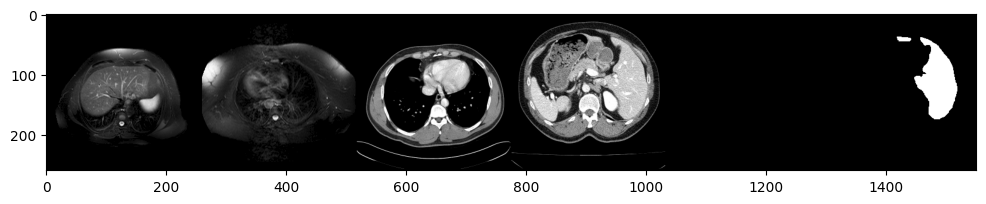

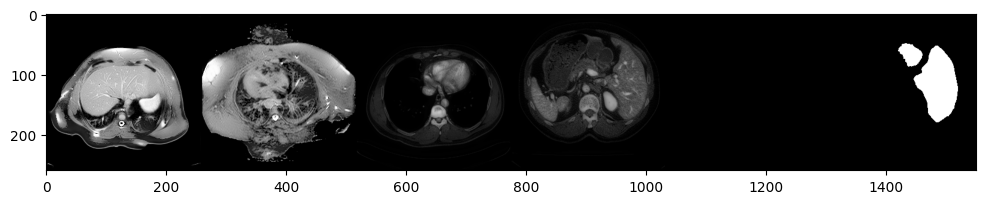

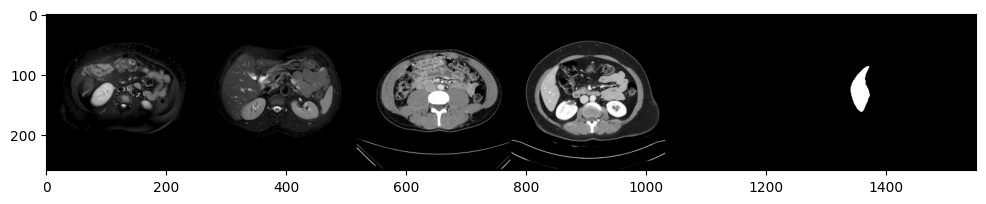

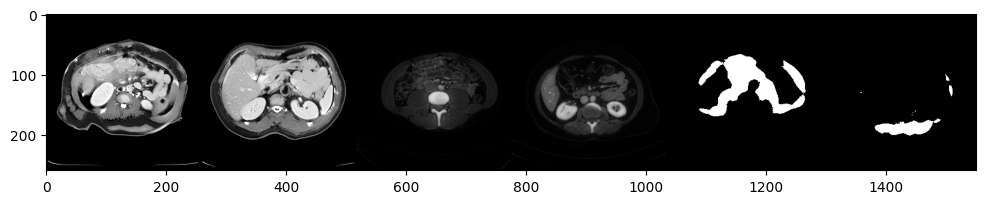

 17%|█▋        | 44/253 [00:17<01:22,  2.52it/s]


#######################################################################
Please cite the following paper when using nnU-Net:
Isensee, F., Jaeger, P. F., Kohl, S. A., Petersen, J., & Maier-Hein, K. H. (2021). nnU-Net: a self-configuring method for deep learning-based biomedical image segmentation. Nature methods, 18(2), 203-211.
#######################################################################

There are 2 cases in the source folder
I am process 0 out of 1 (max process ID is 0, we start counting with 0!)
There are 2 cases that I would like to predict
using pin_memory on device 0

Predicting 0:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 0

Predicting 1:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 1


 18%|█▊        | 45/253 [00:41<25:58,  7.50s/it]


#######################################################################
Please cite the following paper when using nnU-Net:
Isensee, F., Jaeger, P. F., Kohl, S. A., Petersen, J., & Maier-Hein, K. H. (2021). nnU-Net: a self-configuring method for deep learning-based biomedical image segmentation. Nature methods, 18(2), 203-211.
#######################################################################

There are 2 cases in the source folder
I am process 0 out of 1 (max process ID is 0, we start counting with 0!)
There are 2 cases that I would like to predict
using pin_memory on device 0

Predicting 0:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 0

Predicting 1:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 1


 18%|█▊        | 46/253 [01:02<39:02, 11.32s/it]


#######################################################################
Please cite the following paper when using nnU-Net:
Isensee, F., Jaeger, P. F., Kohl, S. A., Petersen, J., & Maier-Hein, K. H. (2021). nnU-Net: a self-configuring method for deep learning-based biomedical image segmentation. Nature methods, 18(2), 203-211.
#######################################################################

There are 2 cases in the source folder
I am process 0 out of 1 (max process ID is 0, we start counting with 0!)
There are 2 cases that I would like to predict
using pin_memory on device 0

Predicting 0:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 0

Predicting 1:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 1


 19%|█▊        | 47/253 [01:23<49:24, 14.39s/it]

Epoch: 17, Step: 4096, Generator Loss: 1.94052976986859 
        Learning rate: 0.0001 
        Adversarial Loss: 1.3301062473328784 
        Cycle Loss: 0.0595446074494248 
        Identity Loss: 0.14977450945298187 
        MR-Discriminator of whole image Loss: 0.2302592367923353
        MR-Discriminator of tumor image Loss: 0.2449751047679456
        CT-Discriminator of whole image Loss: 0.18933325899706688
        CT-Discriminator of tumor image Loss: 0.24863784298941027
        Numb of unique element in t2: 2569
100% 11/11 [00:02<00:00,  5.41it/s]
100% 11/11 [00:02<00:00,  4.33it/s]
FID:  1.2352998932678112


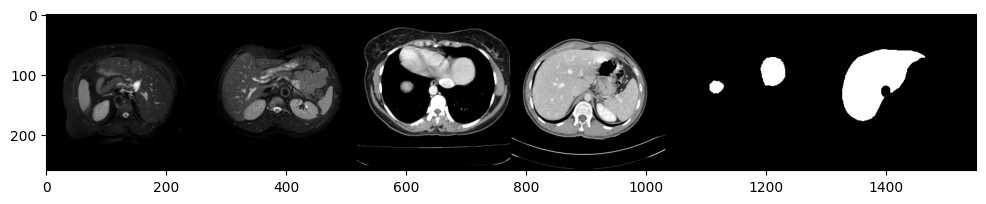

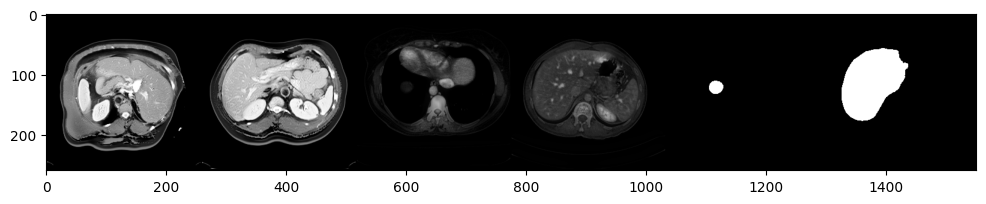

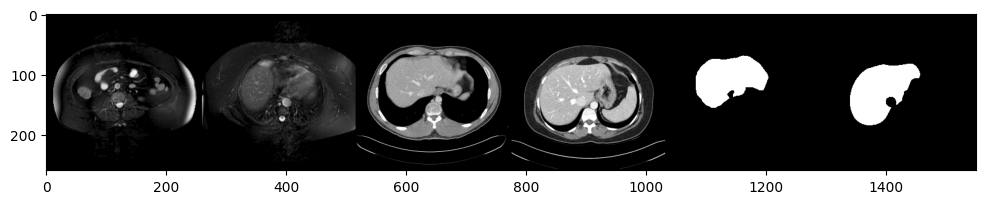

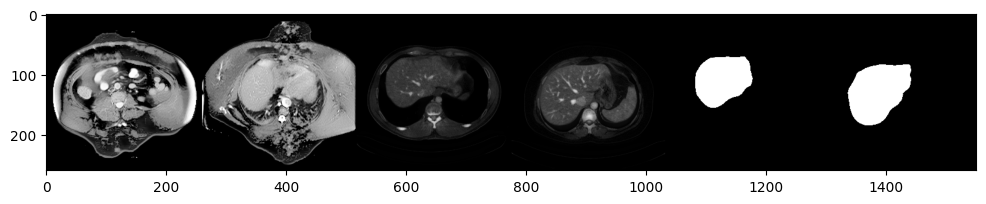

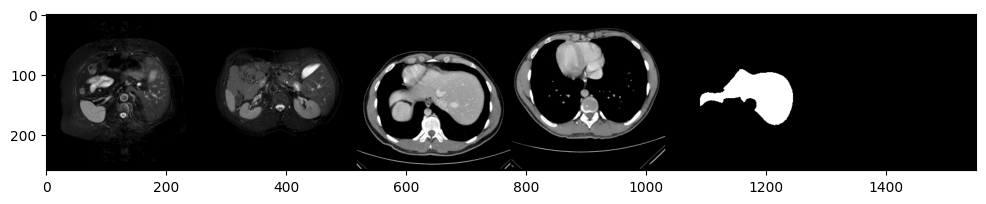

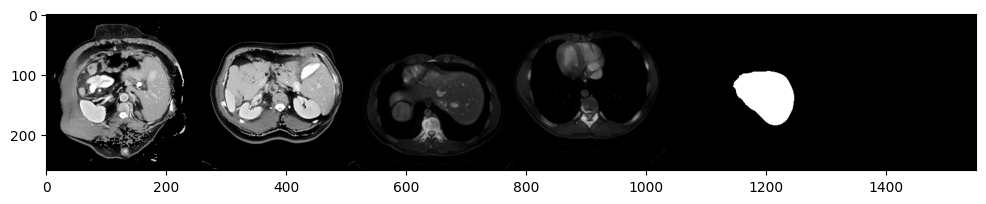

 22%|██▏       | 56/253 [00:22<01:17,  2.53it/s]


#######################################################################
Please cite the following paper when using nnU-Net:
Isensee, F., Jaeger, P. F., Kohl, S. A., Petersen, J., & Maier-Hein, K. H. (2021). nnU-Net: a self-configuring method for deep learning-based biomedical image segmentation. Nature methods, 18(2), 203-211.
#######################################################################

There are 2 cases in the source folder
I am process 0 out of 1 (max process ID is 0, we start counting with 0!)
There are 2 cases that I would like to predict
using pin_memory on device 0

Predicting 0:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 0

Predicting 1:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 1


 23%|██▎       | 57/253 [00:48<25:32,  7.82s/it]


#######################################################################
Please cite the following paper when using nnU-Net:
Isensee, F., Jaeger, P. F., Kohl, S. A., Petersen, J., & Maier-Hein, K. H. (2021). nnU-Net: a self-configuring method for deep learning-based biomedical image segmentation. Nature methods, 18(2), 203-211.
#######################################################################

There are 2 cases in the source folder
I am process 0 out of 1 (max process ID is 0, we start counting with 0!)
There are 2 cases that I would like to predict
using pin_memory on device 0

Predicting 0:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 0

Predicting 1:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 1


 23%|██▎       | 58/253 [01:08<37:31, 11.55s/it]


#######################################################################
Please cite the following paper when using nnU-Net:
Isensee, F., Jaeger, P. F., Kohl, S. A., Petersen, J., & Maier-Hein, K. H. (2021). nnU-Net: a self-configuring method for deep learning-based biomedical image segmentation. Nature methods, 18(2), 203-211.
#######################################################################

There are 2 cases in the source folder
I am process 0 out of 1 (max process ID is 0, we start counting with 0!)
There are 2 cases that I would like to predict
using pin_memory on device 0

Predicting 0:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 0

Predicting 1:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 1


 23%|██▎       | 59/253 [01:31<48:46, 15.08s/it]

Epoch: 21, Step: 5120, Generator Loss: 1.7961001818766817 
        Learning rate: 5e-05 
        Adversarial Loss: 1.326632511045318 
        Cycle Loss: 0.04561504721095844 
        Identity Loss: 0.13317197613650933 
        MR-Discriminator of whole image Loss: 0.23342567158397287
        MR-Discriminator of tumor image Loss: 0.2486457870400045
        CT-Discriminator of whole image Loss: 0.18847454903880134
        CT-Discriminator of tumor image Loss: 0.24532702725264244
        Numb of unique element in t2: 4295
100% 11/11 [00:03<00:00,  3.65it/s]
100% 11/11 [00:01<00:00,  6.79it/s]
FID:  1.1827946504845268


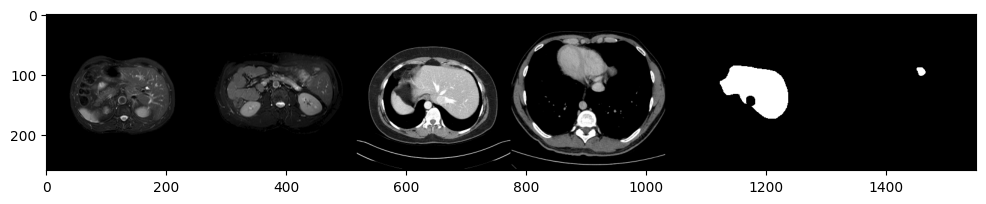

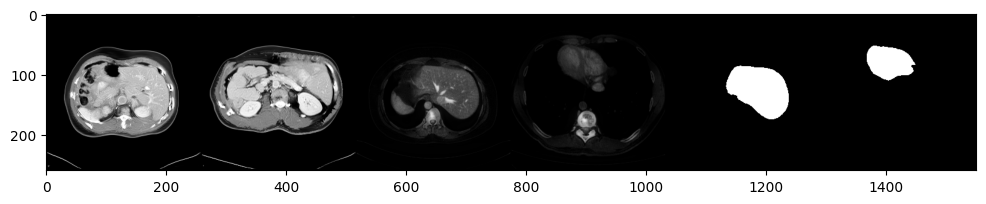

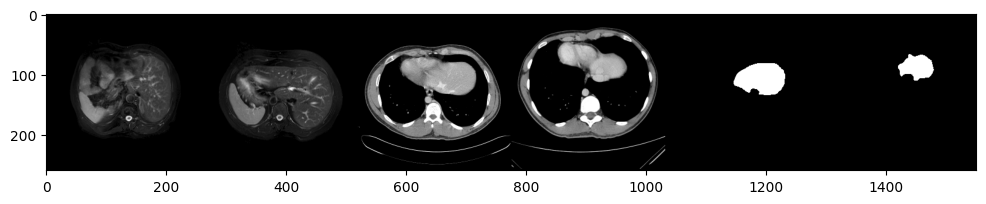

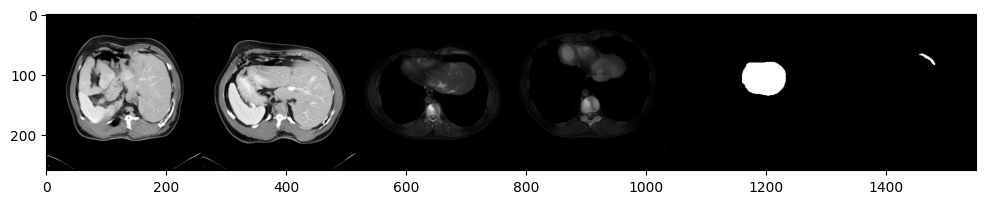

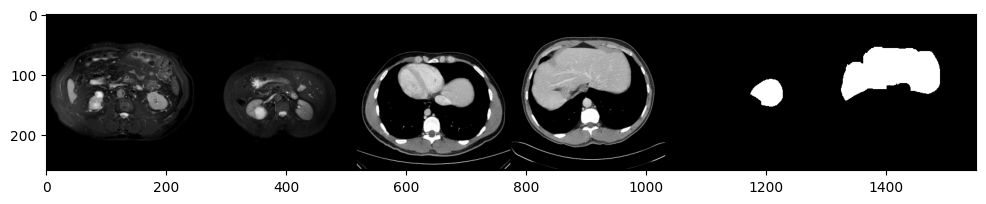

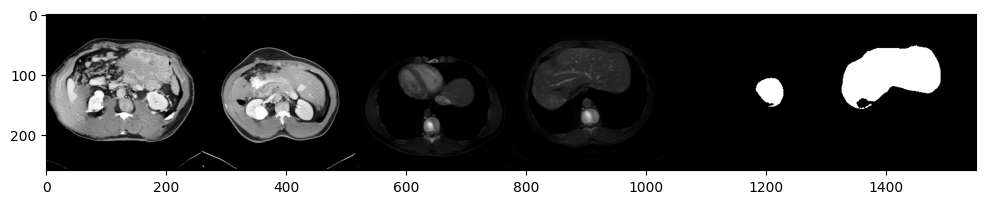

 27%|██▋       | 68/253 [00:28<01:22,  2.25it/s]


#######################################################################
Please cite the following paper when using nnU-Net:
Isensee, F., Jaeger, P. F., Kohl, S. A., Petersen, J., & Maier-Hein, K. H. (2021). nnU-Net: a self-configuring method for deep learning-based biomedical image segmentation. Nature methods, 18(2), 203-211.
#######################################################################

There are 2 cases in the source folder
I am process 0 out of 1 (max process ID is 0, we start counting with 0!)
There are 2 cases that I would like to predict
using pin_memory on device 0

Predicting 0:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 0

Predicting 1:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 1


 27%|██▋       | 69/253 [00:51<22:04,  7.20s/it]


#######################################################################
Please cite the following paper when using nnU-Net:
Isensee, F., Jaeger, P. F., Kohl, S. A., Petersen, J., & Maier-Hein, K. H. (2021). nnU-Net: a self-configuring method for deep learning-based biomedical image segmentation. Nature methods, 18(2), 203-211.
#######################################################################

There are 2 cases in the source folder
I am process 0 out of 1 (max process ID is 0, we start counting with 0!)
There are 2 cases that I would like to predict
using pin_memory on device 0

Predicting 0:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 0

Predicting 1:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 1


 28%|██▊       | 70/253 [01:15<37:59, 12.46s/it]


#######################################################################
Please cite the following paper when using nnU-Net:
Isensee, F., Jaeger, P. F., Kohl, S. A., Petersen, J., & Maier-Hein, K. H. (2021). nnU-Net: a self-configuring method for deep learning-based biomedical image segmentation. Nature methods, 18(2), 203-211.
#######################################################################

There are 2 cases in the source folder
I am process 0 out of 1 (max process ID is 0, we start counting with 0!)
There are 2 cases that I would like to predict
using pin_memory on device 0

Predicting 0:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 0

Predicting 1:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 1


 28%|██▊       | 71/253 [01:36<45:43, 15.07s/it]

Epoch: 25, Step: 6144, Generator Loss: 1.7771292607067153 
        Learning rate: 5e-05 
        Adversarial Loss: 1.3652545539662242 
        Cycle Loss: 0.03989459104559501 
        Identity Loss: 0.12928795345214894 
        MR-Discriminator of whole image Loss: 0.23075344251992647
        MR-Discriminator of tumor image Loss: 0.24856807824107818
        CT-Discriminator of whole image Loss: 0.17873575694102328
        CT-Discriminator of tumor image Loss: 0.2439664044213714
        Numb of unique element in t2: 4133
100% 11/11 [00:01<00:00,  6.16it/s]
100% 11/11 [00:01<00:00,  6.63it/s]
FID:  1.153617565446765


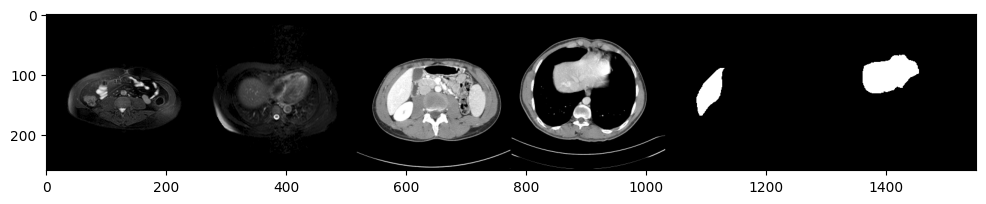

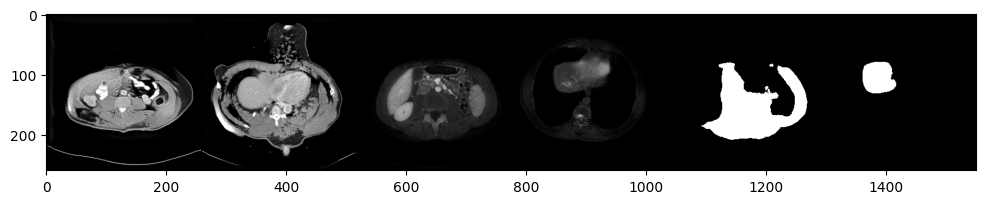

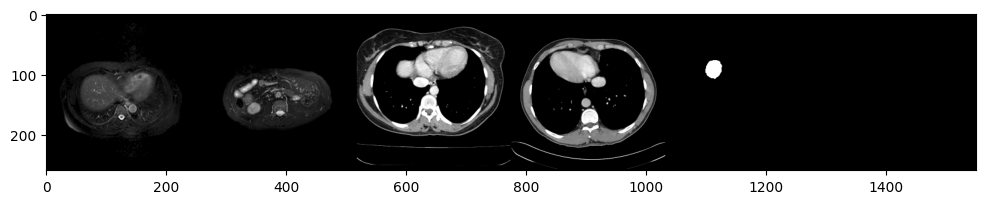

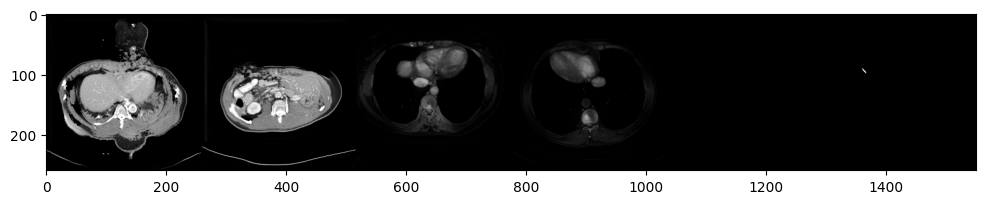

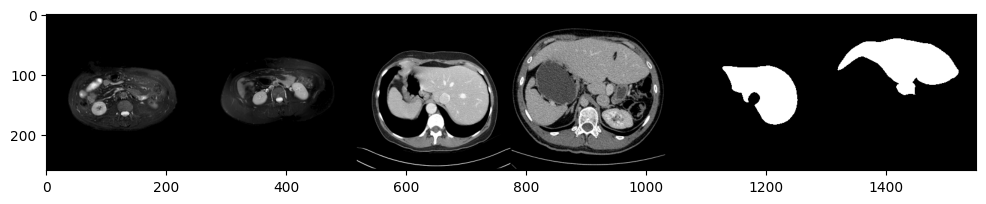

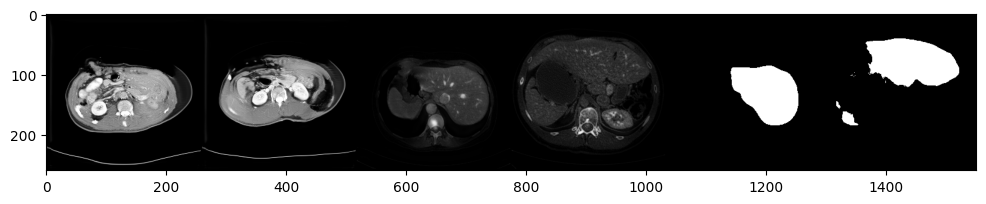

 32%|███▏      | 80/253 [00:33<01:07,  2.55it/s]


#######################################################################
Please cite the following paper when using nnU-Net:
Isensee, F., Jaeger, P. F., Kohl, S. A., Petersen, J., & Maier-Hein, K. H. (2021). nnU-Net: a self-configuring method for deep learning-based biomedical image segmentation. Nature methods, 18(2), 203-211.
#######################################################################

There are 2 cases in the source folder
I am process 0 out of 1 (max process ID is 0, we start counting with 0!)
There are 2 cases that I would like to predict
using pin_memory on device 0

Predicting 0:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 0

Predicting 1:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 1


 32%|███▏      | 81/253 [00:58<22:52,  7.98s/it]


#######################################################################
Please cite the following paper when using nnU-Net:
Isensee, F., Jaeger, P. F., Kohl, S. A., Petersen, J., & Maier-Hein, K. H. (2021). nnU-Net: a self-configuring method for deep learning-based biomedical image segmentation. Nature methods, 18(2), 203-211.
#######################################################################

There are 2 cases in the source folder
I am process 0 out of 1 (max process ID is 0, we start counting with 0!)
There are 2 cases that I would like to predict
using pin_memory on device 0

Predicting 0:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 0

Predicting 1:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 1


 32%|███▏      | 82/253 [01:20<34:21, 12.06s/it]


#######################################################################
Please cite the following paper when using nnU-Net:
Isensee, F., Jaeger, P. F., Kohl, S. A., Petersen, J., & Maier-Hein, K. H. (2021). nnU-Net: a self-configuring method for deep learning-based biomedical image segmentation. Nature methods, 18(2), 203-211.
#######################################################################

There are 2 cases in the source folder
I am process 0 out of 1 (max process ID is 0, we start counting with 0!)
There are 2 cases that I would like to predict
using pin_memory on device 0

Predicting 0:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 0

Predicting 1:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 1


 33%|███▎      | 83/253 [01:44<44:23, 15.66s/it]

Epoch: 29, Step: 7168, Generator Loss: 1.7285764241823927 
        Learning rate: 2.5e-05 
        Adversarial Loss: 1.388412098865956 
        Cycle Loss: 0.0327168785588583 
        Identity Loss: 0.12995539940311573 
        MR-Discriminator of whole image Loss: 0.22967974010680337
        MR-Discriminator of tumor image Loss: 0.2484938217094168
        CT-Discriminator of whole image Loss: 0.1745524065408972
        CT-Discriminator of tumor image Loss: 0.24429149633215275
        Numb of unique element in t2: 3840
100% 11/11 [00:02<00:00,  4.81it/s]
100% 11/11 [00:01<00:00,  6.99it/s]
FID:  1.1225424969318056


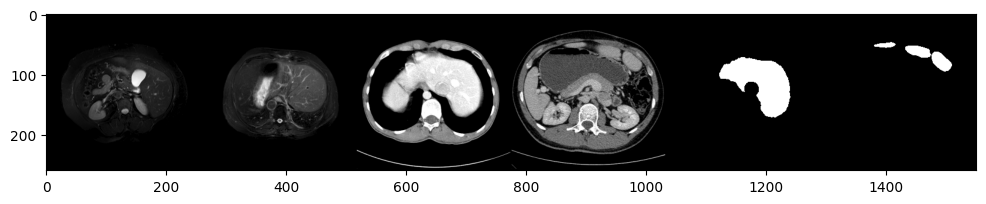

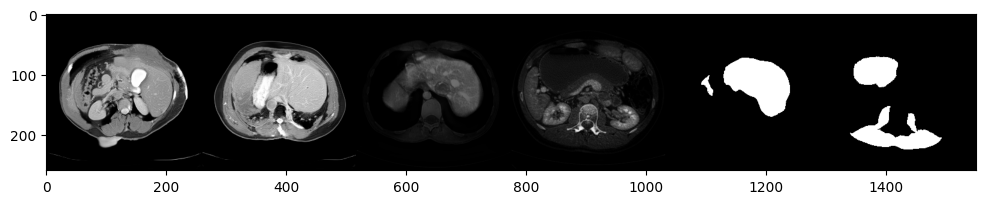

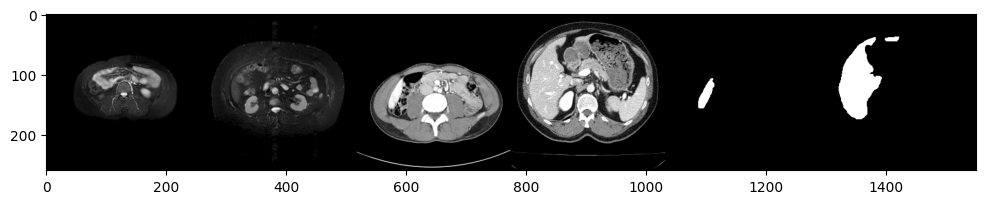

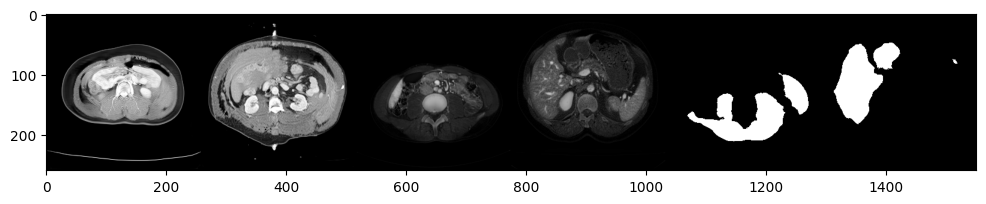

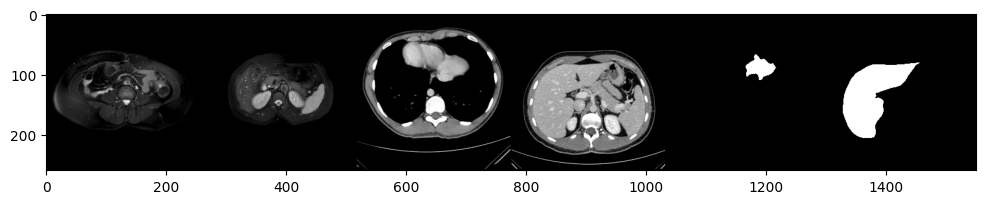

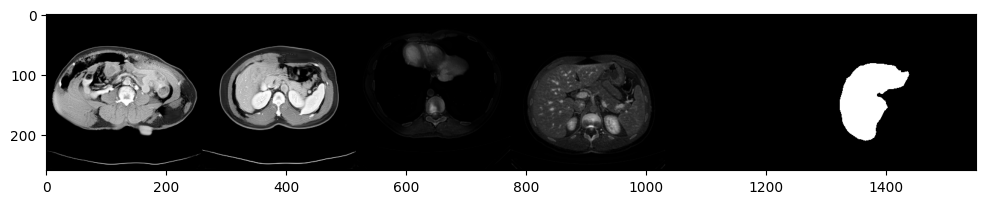

 36%|███▋      | 92/253 [00:38<01:05,  2.45it/s]


#######################################################################
Please cite the following paper when using nnU-Net:
Isensee, F., Jaeger, P. F., Kohl, S. A., Petersen, J., & Maier-Hein, K. H. (2021). nnU-Net: a self-configuring method for deep learning-based biomedical image segmentation. Nature methods, 18(2), 203-211.
#######################################################################

There are 2 cases in the source folder
I am process 0 out of 1 (max process ID is 0, we start counting with 0!)
There are 2 cases that I would like to predict
using pin_memory on device 0

Predicting 0:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 0

Predicting 1:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 1


 37%|███▋      | 93/253 [01:02<20:21,  7.63s/it]


#######################################################################
Please cite the following paper when using nnU-Net:
Isensee, F., Jaeger, P. F., Kohl, S. A., Petersen, J., & Maier-Hein, K. H. (2021). nnU-Net: a self-configuring method for deep learning-based biomedical image segmentation. Nature methods, 18(2), 203-211.
#######################################################################

There are 2 cases in the source folder
I am process 0 out of 1 (max process ID is 0, we start counting with 0!)
There are 2 cases that I would like to predict
using pin_memory on device 0

Predicting 0:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 0

Predicting 1:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 1


 37%|███▋      | 94/253 [01:24<31:19, 11.82s/it]


#######################################################################
Please cite the following paper when using nnU-Net:
Isensee, F., Jaeger, P. F., Kohl, S. A., Petersen, J., & Maier-Hein, K. H. (2021). nnU-Net: a self-configuring method for deep learning-based biomedical image segmentation. Nature methods, 18(2), 203-211.
#######################################################################

There are 2 cases in the source folder
I am process 0 out of 1 (max process ID is 0, we start counting with 0!)
There are 2 cases that I would like to predict
using pin_memory on device 0

Predicting 0:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 0

Predicting 1:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 1


 38%|███▊      | 95/253 [01:47<40:03, 15.21s/it]

Epoch: 33, Step: 8192, Generator Loss: 1.743875318672508 
        Learning rate: 2.5e-05 
        Adversarial Loss: 1.4237847751937807 
        Cycle Loss: 0.0307433789348579 
        Identity Loss: 0.12656755479838466 
        MR-Discriminator of whole image Loss: 0.22410785853571724
        MR-Discriminator of tumor image Loss: 0.24841961657512002
        CT-Discriminator of whole image Loss: 0.16694888027268462
        CT-Discriminator of tumor image Loss: 0.24367137216904666
        Numb of unique element in t2: 3545
100% 11/11 [00:01<00:00,  6.03it/s]
100% 11/11 [00:01<00:00,  7.16it/s]
FID:  1.08905932857433


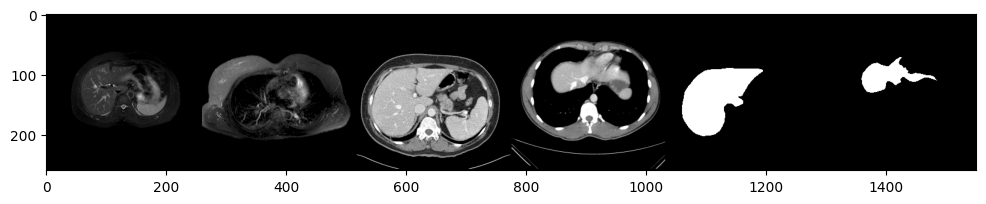

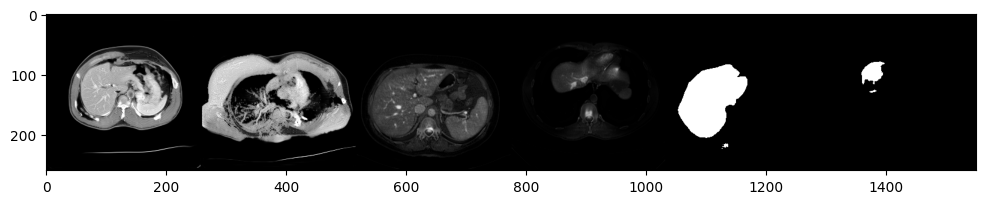

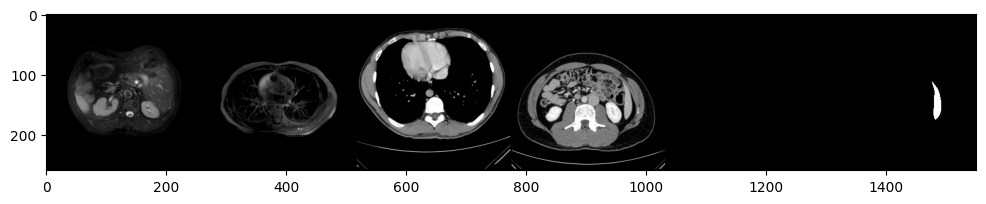

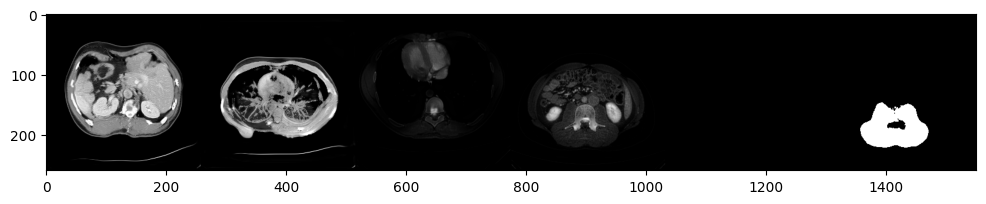

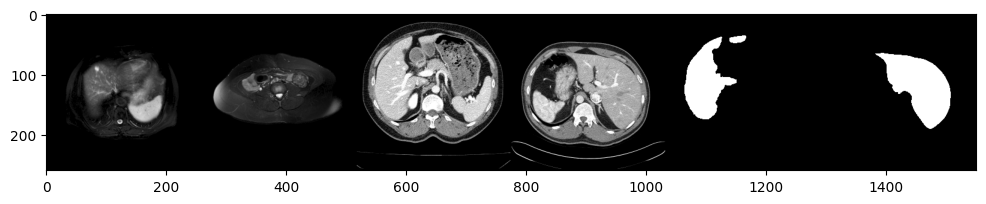

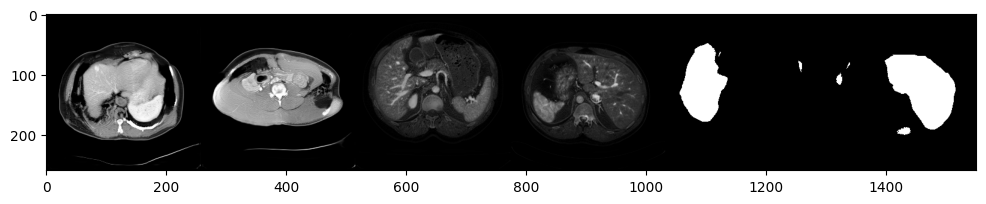

 41%|████      | 104/253 [00:42<01:07,  2.22it/s]


#######################################################################
Please cite the following paper when using nnU-Net:
Isensee, F., Jaeger, P. F., Kohl, S. A., Petersen, J., & Maier-Hein, K. H. (2021). nnU-Net: a self-configuring method for deep learning-based biomedical image segmentation. Nature methods, 18(2), 203-211.
#######################################################################

There are 2 cases in the source folder
I am process 0 out of 1 (max process ID is 0, we start counting with 0!)
There are 2 cases that I would like to predict
using pin_memory on device 0

Predicting 0:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 0

Predicting 1:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 1


 42%|████▏     | 105/253 [01:06<18:14,  7.39s/it]


#######################################################################
Please cite the following paper when using nnU-Net:
Isensee, F., Jaeger, P. F., Kohl, S. A., Petersen, J., & Maier-Hein, K. H. (2021). nnU-Net: a self-configuring method for deep learning-based biomedical image segmentation. Nature methods, 18(2), 203-211.
#######################################################################

There are 2 cases in the source folder
I am process 0 out of 1 (max process ID is 0, we start counting with 0!)
There are 2 cases that I would like to predict
using pin_memory on device 0

Predicting 0:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 0

Predicting 1:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 1


 42%|████▏     | 106/253 [01:28<28:50, 11.77s/it]


#######################################################################
Please cite the following paper when using nnU-Net:
Isensee, F., Jaeger, P. F., Kohl, S. A., Petersen, J., & Maier-Hein, K. H. (2021). nnU-Net: a self-configuring method for deep learning-based biomedical image segmentation. Nature methods, 18(2), 203-211.
#######################################################################

There are 2 cases in the source folder
I am process 0 out of 1 (max process ID is 0, we start counting with 0!)
There are 2 cases that I would like to predict
using pin_memory on device 0

Predicting 0:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 0

Predicting 1:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 1


 42%|████▏     | 107/253 [01:50<36:04, 14.83s/it]

Epoch: 37, Step: 9216, Generator Loss: 1.7649818140780553 
        Learning rate: 1.25e-05 
        Adversarial Loss: 1.4561634595738724 
        Cycle Loss: 0.02967922803691181 
        Identity Loss: 0.12026075154426508 
        MR-Discriminator of whole image Loss: 0.22350987965182867
        MR-Discriminator of tumor image Loss: 0.24841597361955792
        CT-Discriminator of whole image Loss: 0.15917419843754033
        CT-Discriminator of tumor image Loss: 0.24365572299575433
        Numb of unique element in t2: 1928
100% 11/11 [00:01<00:00,  5.92it/s]
100% 11/11 [00:01<00:00,  6.90it/s]
FID:  1.0472072826217869


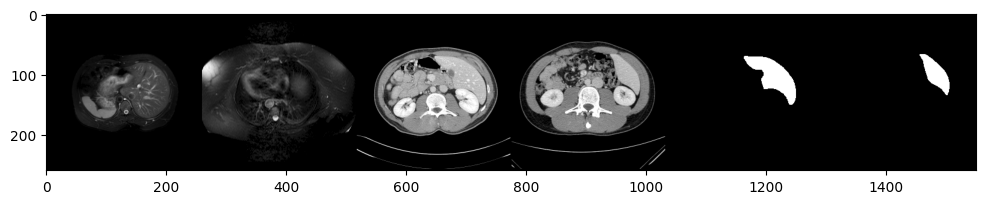

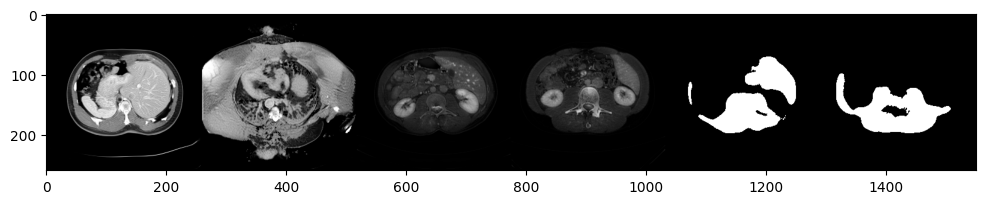

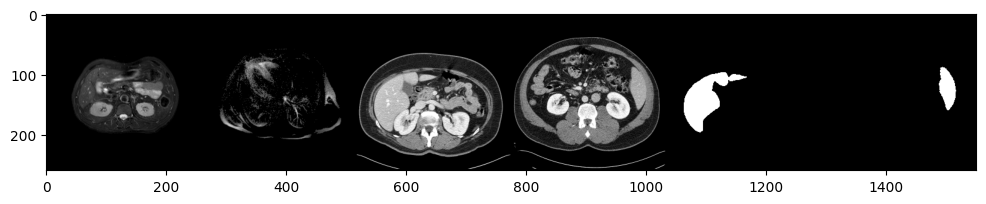

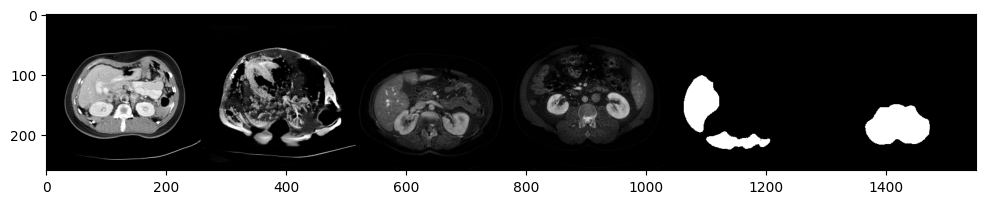

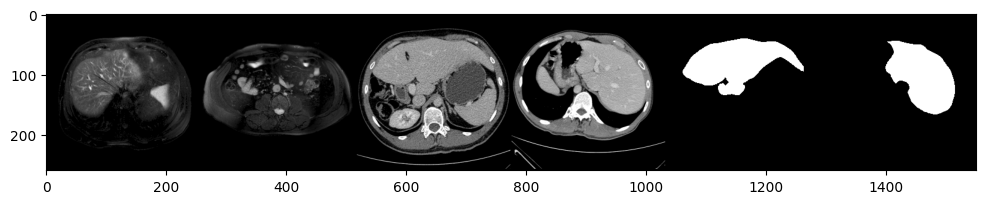

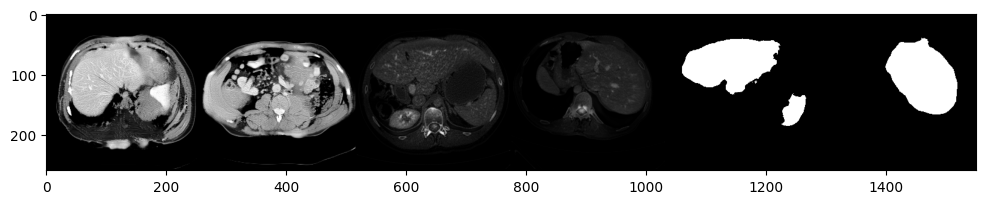

 46%|████▌     | 116/253 [00:47<00:58,  2.34it/s]


#######################################################################
Please cite the following paper when using nnU-Net:
Isensee, F., Jaeger, P. F., Kohl, S. A., Petersen, J., & Maier-Hein, K. H. (2021). nnU-Net: a self-configuring method for deep learning-based biomedical image segmentation. Nature methods, 18(2), 203-211.
#######################################################################

There are 2 cases in the source folder
I am process 0 out of 1 (max process ID is 0, we start counting with 0!)
There are 2 cases that I would like to predict
using pin_memory on device 0

Predicting 0:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 0

Predicting 1:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 1


 46%|████▌     | 117/253 [01:10<15:39,  6.91s/it]


#######################################################################
Please cite the following paper when using nnU-Net:
Isensee, F., Jaeger, P. F., Kohl, S. A., Petersen, J., & Maier-Hein, K. H. (2021). nnU-Net: a self-configuring method for deep learning-based biomedical image segmentation. Nature methods, 18(2), 203-211.
#######################################################################

There are 2 cases in the source folder
I am process 0 out of 1 (max process ID is 0, we start counting with 0!)
There are 2 cases that I would like to predict
using pin_memory on device 0

Predicting 0:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 0

Predicting 1:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 1


 47%|████▋     | 118/253 [01:33<26:40, 11.85s/it]


#######################################################################
Please cite the following paper when using nnU-Net:
Isensee, F., Jaeger, P. F., Kohl, S. A., Petersen, J., & Maier-Hein, K. H. (2021). nnU-Net: a self-configuring method for deep learning-based biomedical image segmentation. Nature methods, 18(2), 203-211.
#######################################################################

There are 2 cases in the source folder
I am process 0 out of 1 (max process ID is 0, we start counting with 0!)
There are 2 cases that I would like to predict
using pin_memory on device 0

Predicting 0:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 0

Predicting 1:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 1


 47%|████▋     | 119/253 [01:53<31:49, 14.25s/it]

Epoch: 41, Step: 10240, Generator Loss: 1.7852377848466858 
        Learning rate: 1.25e-05 
        Adversarial Loss: 1.4926266904221848 
        Cycle Loss: 0.02811292248952668 
        Identity Loss: 0.11481869578710757 
        MR-Discriminator of whole image Loss: 0.21897687869204674
        MR-Discriminator of tumor image Loss: 0.2491799451672705
        CT-Discriminator of whole image Loss: 0.15276069180981722
        CT-Discriminator of tumor image Loss: 0.24343574156227987
        Numb of unique element in t2: 2865
100% 11/11 [00:01<00:00,  6.24it/s]
100% 11/11 [00:01<00:00,  6.93it/s]
FID:  0.9965899986097222


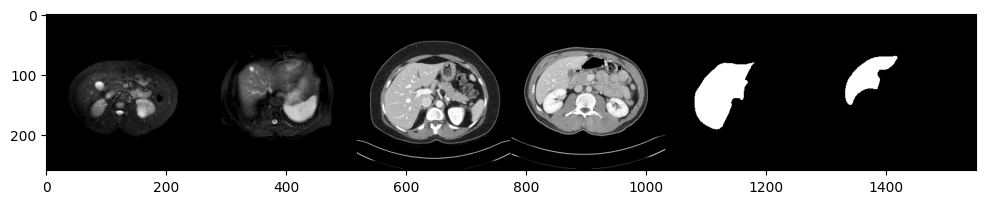

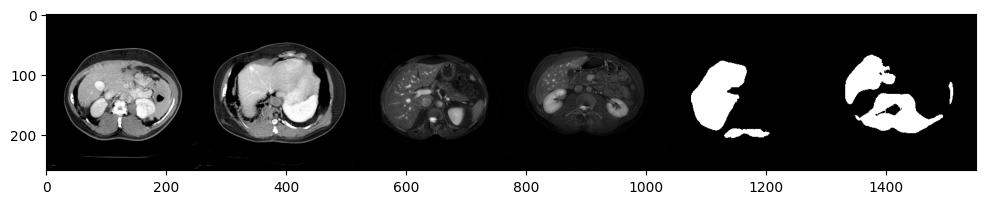

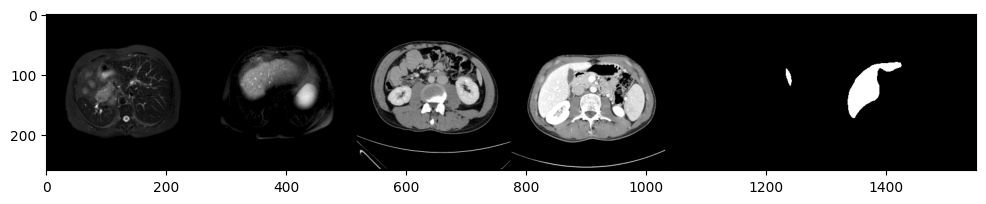

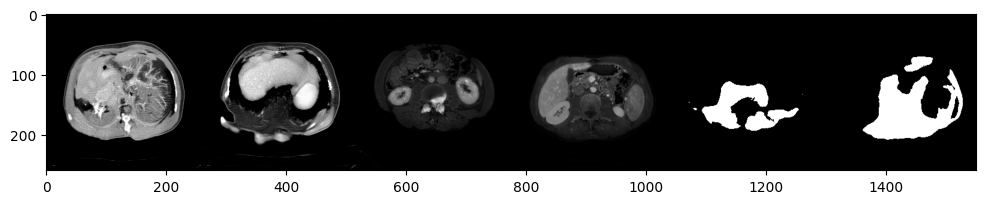

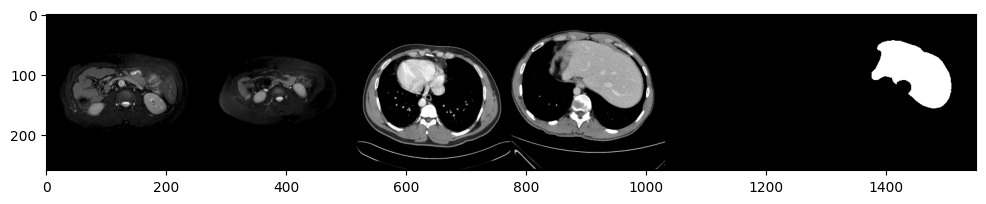

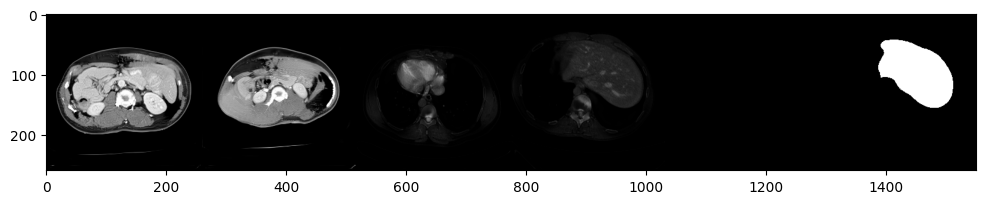

 51%|█████     | 128/253 [00:53<00:55,  2.25it/s]


#######################################################################
Please cite the following paper when using nnU-Net:
Isensee, F., Jaeger, P. F., Kohl, S. A., Petersen, J., & Maier-Hein, K. H. (2021). nnU-Net: a self-configuring method for deep learning-based biomedical image segmentation. Nature methods, 18(2), 203-211.
#######################################################################

There are 2 cases in the source folder
I am process 0 out of 1 (max process ID is 0, we start counting with 0!)
There are 2 cases that I would like to predict
using pin_memory on device 0

Predicting 0:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 0

Predicting 1:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 1


 51%|█████     | 129/253 [01:15<14:41,  7.11s/it]


#######################################################################
Please cite the following paper when using nnU-Net:
Isensee, F., Jaeger, P. F., Kohl, S. A., Petersen, J., & Maier-Hein, K. H. (2021). nnU-Net: a self-configuring method for deep learning-based biomedical image segmentation. Nature methods, 18(2), 203-211.
#######################################################################

There are 2 cases in the source folder
I am process 0 out of 1 (max process ID is 0, we start counting with 0!)
There are 2 cases that I would like to predict
using pin_memory on device 0

Predicting 0:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 0

Predicting 1:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 1


 51%|█████▏    | 130/253 [01:38<24:20, 11.87s/it]


#######################################################################
Please cite the following paper when using nnU-Net:
Isensee, F., Jaeger, P. F., Kohl, S. A., Petersen, J., & Maier-Hein, K. H. (2021). nnU-Net: a self-configuring method for deep learning-based biomedical image segmentation. Nature methods, 18(2), 203-211.
#######################################################################

There are 2 cases in the source folder
I am process 0 out of 1 (max process ID is 0, we start counting with 0!)
There are 2 cases that I would like to predict
using pin_memory on device 0

Predicting 0:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 0

Predicting 1:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 1


 52%|█████▏    | 131/253 [01:59<29:21, 14.44s/it]

Epoch: 45, Step: 11264, Generator Loss: 1.8229294491466135 
        Learning rate: 1.25e-05 
        Adversarial Loss: 1.5229977207491174 
        Cycle Loss: 0.028874536155854003 
        Identity Loss: 0.11186366107722279 
        MR-Discriminator of whole image Loss: 0.21452221595973242
        MR-Discriminator of tumor image Loss: 0.24762242793804035
        CT-Discriminator of whole image Loss: 0.14673770285298815
        CT-Discriminator of tumor image Loss: 0.24443039469770156
        Numb of unique element in t2: 1629
100% 11/11 [00:01<00:00,  6.17it/s]
100% 11/11 [00:01<00:00,  6.52it/s]
FID:  0.9271747759772169


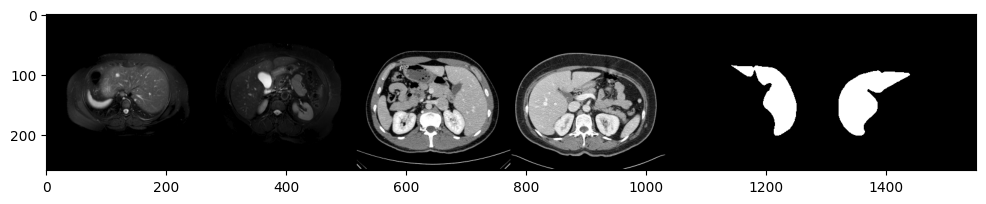

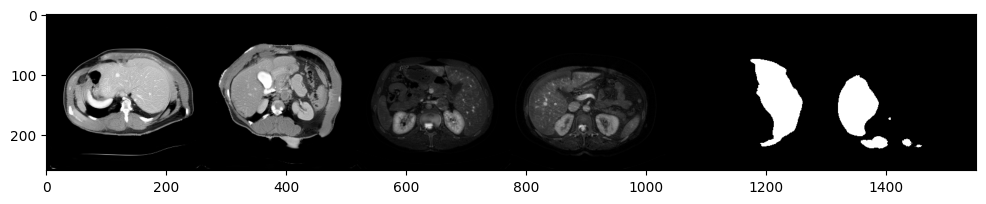

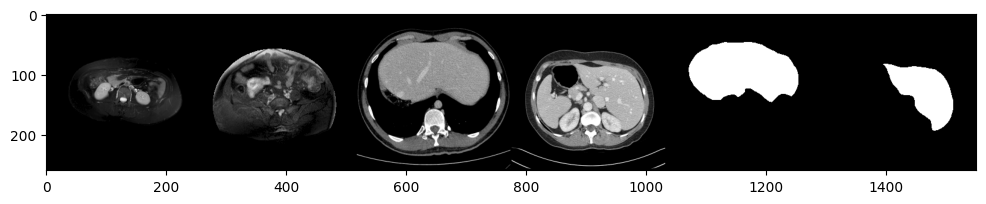

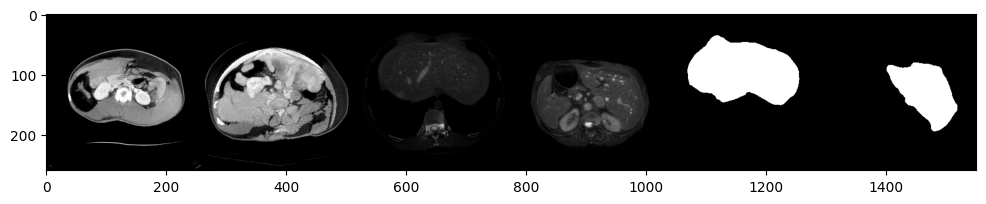

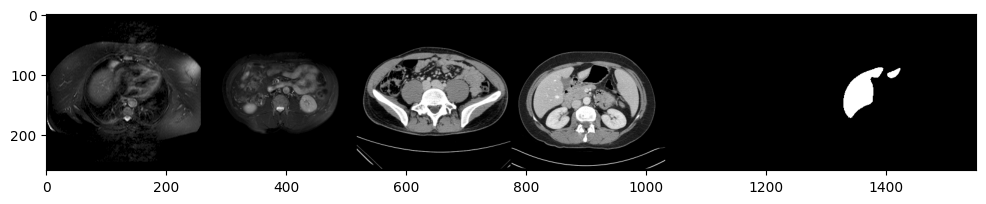

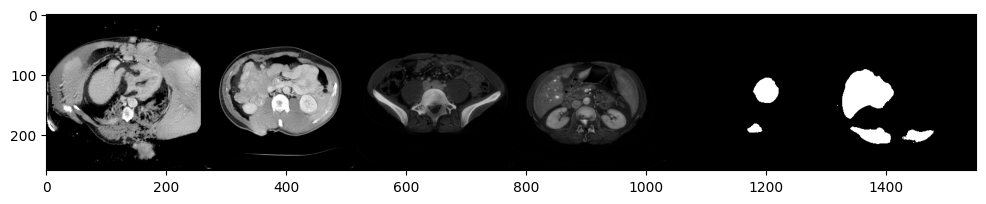

 55%|█████▌    | 140/253 [00:58<00:48,  2.35it/s]


#######################################################################
Please cite the following paper when using nnU-Net:
Isensee, F., Jaeger, P. F., Kohl, S. A., Petersen, J., & Maier-Hein, K. H. (2021). nnU-Net: a self-configuring method for deep learning-based biomedical image segmentation. Nature methods, 18(2), 203-211.
#######################################################################

There are 2 cases in the source folder
I am process 0 out of 1 (max process ID is 0, we start counting with 0!)
There are 2 cases that I would like to predict
using pin_memory on device 0

Predicting 0:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 0

Predicting 1:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 1


 56%|█████▌    | 141/253 [01:25<15:33,  8.33s/it]


#######################################################################
Please cite the following paper when using nnU-Net:
Isensee, F., Jaeger, P. F., Kohl, S. A., Petersen, J., & Maier-Hein, K. H. (2021). nnU-Net: a self-configuring method for deep learning-based biomedical image segmentation. Nature methods, 18(2), 203-211.
#######################################################################

There are 2 cases in the source folder
I am process 0 out of 1 (max process ID is 0, we start counting with 0!)
There are 2 cases that I would like to predict
using pin_memory on device 0

Predicting 0:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 0

Predicting 1:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 1


 56%|█████▌    | 142/253 [01:46<22:52, 12.37s/it]


#######################################################################
Please cite the following paper when using nnU-Net:
Isensee, F., Jaeger, P. F., Kohl, S. A., Petersen, J., & Maier-Hein, K. H. (2021). nnU-Net: a self-configuring method for deep learning-based biomedical image segmentation. Nature methods, 18(2), 203-211.
#######################################################################

There are 2 cases in the source folder
I am process 0 out of 1 (max process ID is 0, we start counting with 0!)
There are 2 cases that I would like to predict
using pin_memory on device 0

Predicting 0:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 0

Predicting 1:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 1


 57%|█████▋    | 143/253 [02:09<28:31, 15.56s/it]

Epoch: 49, Step: 12288, Generator Loss: 1.8523131990805268 
        Learning rate: 1.25e-05 
        Adversarial Loss: 1.5454044373473153 
        Cycle Loss: 0.029599346338727628 
        Identity Loss: 0.10915298385225469 
        MR-Discriminator of whole image Loss: 0.21072670468129218
        MR-Discriminator of tumor image Loss: 0.2477148027974181
        CT-Discriminator of whole image Loss: 0.1425579918868607
        CT-Discriminator of tumor image Loss: 0.24312055559130386
        Numb of unique element in t2: 2925
100% 11/11 [00:02<00:00,  3.83it/s]
100% 11/11 [00:02<00:00,  4.54it/s]
FID:  0.8609478545016804


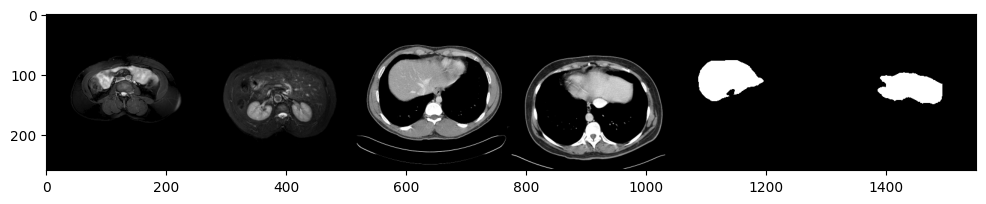

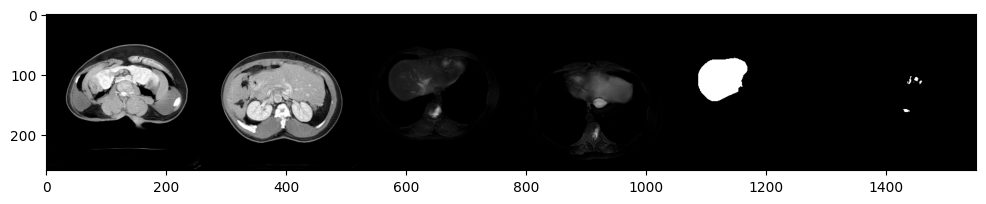

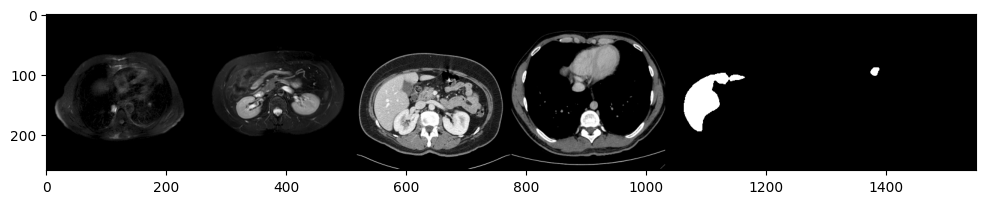

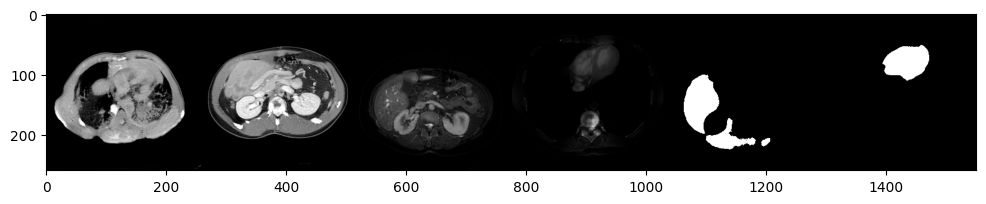

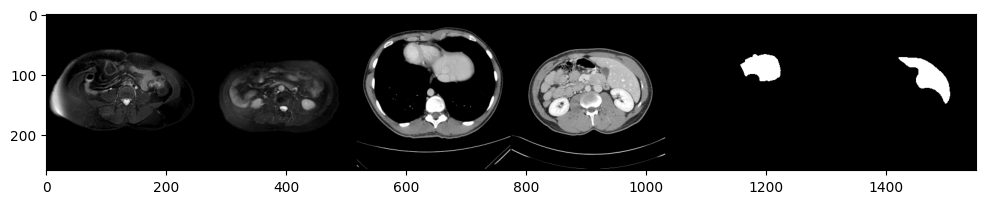

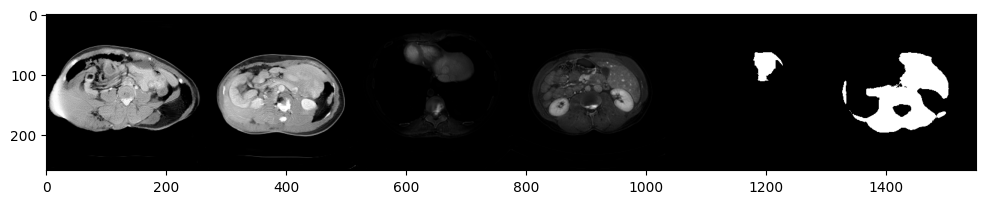

 60%|██████    | 152/253 [01:03<00:44,  2.28it/s]


#######################################################################
Please cite the following paper when using nnU-Net:
Isensee, F., Jaeger, P. F., Kohl, S. A., Petersen, J., & Maier-Hein, K. H. (2021). nnU-Net: a self-configuring method for deep learning-based biomedical image segmentation. Nature methods, 18(2), 203-211.
#######################################################################

There are 2 cases in the source folder
I am process 0 out of 1 (max process ID is 0, we start counting with 0!)
There are 2 cases that I would like to predict
using pin_memory on device 0

Predicting 0:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 0

Predicting 1:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 1


 60%|██████    | 153/253 [01:25<11:56,  7.17s/it]


#######################################################################
Please cite the following paper when using nnU-Net:
Isensee, F., Jaeger, P. F., Kohl, S. A., Petersen, J., & Maier-Hein, K. H. (2021). nnU-Net: a self-configuring method for deep learning-based biomedical image segmentation. Nature methods, 18(2), 203-211.
#######################################################################

There are 2 cases in the source folder
I am process 0 out of 1 (max process ID is 0, we start counting with 0!)
There are 2 cases that I would like to predict
using pin_memory on device 0

Predicting 0:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 0

Predicting 1:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 1


 61%|██████    | 154/253 [01:50<20:17, 12.29s/it]


#######################################################################
Please cite the following paper when using nnU-Net:
Isensee, F., Jaeger, P. F., Kohl, S. A., Petersen, J., & Maier-Hein, K. H. (2021). nnU-Net: a self-configuring method for deep learning-based biomedical image segmentation. Nature methods, 18(2), 203-211.
#######################################################################

There are 2 cases in the source folder
I am process 0 out of 1 (max process ID is 0, we start counting with 0!)
There are 2 cases that I would like to predict
using pin_memory on device 0

Predicting 0:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 0

Predicting 1:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 1


 61%|██████▏   | 155/253 [02:12<24:51, 15.22s/it]

Epoch: 53, Step: 13312, Generator Loss: 1.884824434411712 
        Learning rate: 1.25e-05 
        Adversarial Loss: 1.5809440040029585 
        Cycle Loss: 0.02932360128215805 
        Identity Loss: 0.10644417945150053 
        MR-Discriminator of whole image Loss: 0.2148156617913628
        MR-Discriminator of tumor image Loss: 0.2652821451338241
        CT-Discriminator of whole image Loss: 0.13941720133880153
        CT-Discriminator of tumor image Loss: 0.2423839859839063
        Numb of unique element in t2: 4165
100% 11/11 [00:01<00:00,  5.82it/s]
100% 11/11 [00:01<00:00,  6.92it/s]
FID:  0.8260695099287768


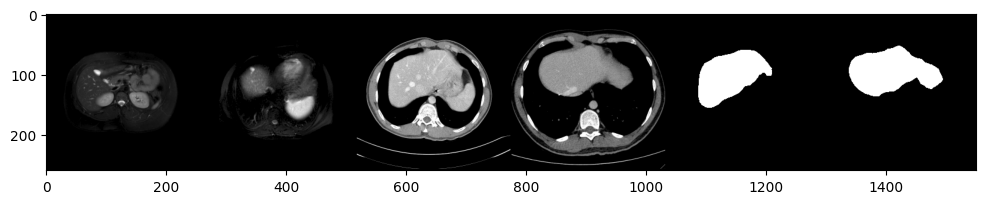

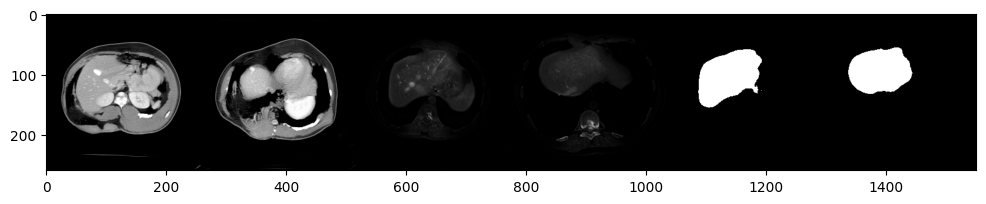

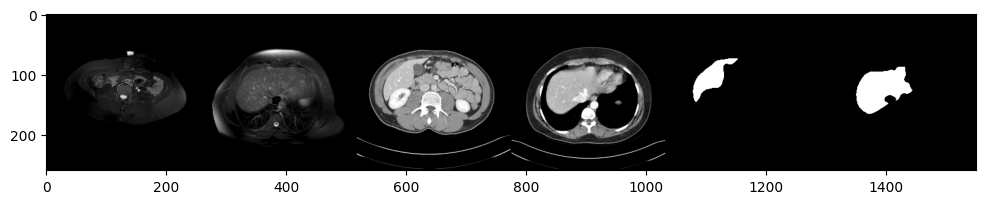

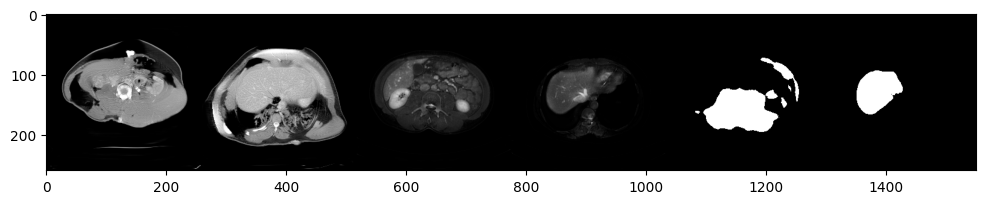

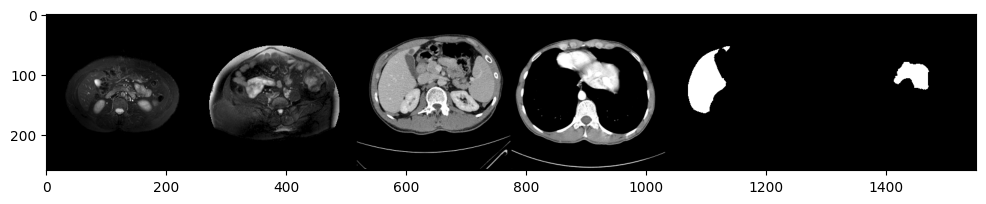

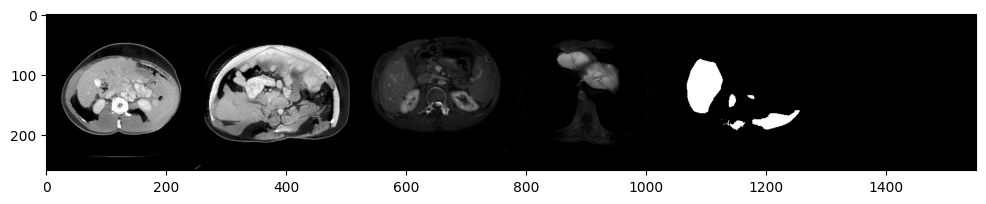

 65%|██████▍   | 164/253 [01:08<00:39,  2.25it/s]


#######################################################################
Please cite the following paper when using nnU-Net:
Isensee, F., Jaeger, P. F., Kohl, S. A., Petersen, J., & Maier-Hein, K. H. (2021). nnU-Net: a self-configuring method for deep learning-based biomedical image segmentation. Nature methods, 18(2), 203-211.
#######################################################################

There are 2 cases in the source folder
I am process 0 out of 1 (max process ID is 0, we start counting with 0!)
There are 2 cases that I would like to predict
using pin_memory on device 0

Predicting 0:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 0

Predicting 1:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 1


 65%|██████▌   | 165/253 [01:32<11:12,  7.64s/it]


#######################################################################
Please cite the following paper when using nnU-Net:
Isensee, F., Jaeger, P. F., Kohl, S. A., Petersen, J., & Maier-Hein, K. H. (2021). nnU-Net: a self-configuring method for deep learning-based biomedical image segmentation. Nature methods, 18(2), 203-211.
#######################################################################

There are 2 cases in the source folder
I am process 0 out of 1 (max process ID is 0, we start counting with 0!)
There are 2 cases that I would like to predict
using pin_memory on device 0

Predicting 0:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 0

Predicting 1:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 1


 66%|██████▌   | 166/253 [01:54<17:13, 11.88s/it]


#######################################################################
Please cite the following paper when using nnU-Net:
Isensee, F., Jaeger, P. F., Kohl, S. A., Petersen, J., & Maier-Hein, K. H. (2021). nnU-Net: a self-configuring method for deep learning-based biomedical image segmentation. Nature methods, 18(2), 203-211.
#######################################################################

There are 2 cases in the source folder
I am process 0 out of 1 (max process ID is 0, we start counting with 0!)
There are 2 cases that I would like to predict
using pin_memory on device 0

Predicting 0:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 0

Predicting 1:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 1


 66%|██████▌   | 167/253 [02:16<21:17, 14.86s/it]

Epoch: 57, Step: 14336, Generator Loss: 1.9305989637505263 
        Learning rate: 1.25e-05 
        Adversarial Loss: 1.6162852328270674 
        Cycle Loss: 0.030387407989110216 
        Identity Loss: 0.1043965159333311 
        MR-Discriminator of whole image Loss: 0.20857460610568523
        MR-Discriminator of tumor image Loss: 0.24858447280712426
        CT-Discriminator of whole image Loss: 0.14070687618368538
        CT-Discriminator of tumor image Loss: 0.260288598947227
        Numb of unique element in t2: 3381
100% 11/11 [00:01<00:00,  6.19it/s]
100% 11/11 [00:01<00:00,  6.70it/s]
FID:  0.7691875431747621


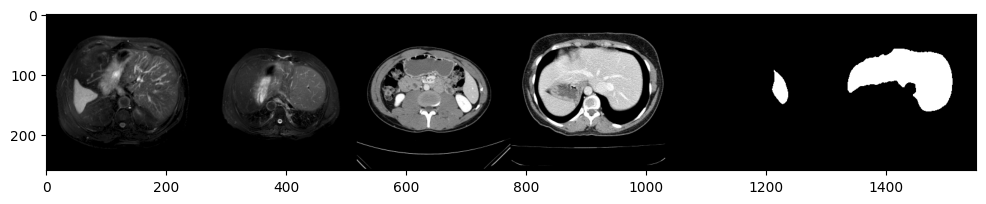

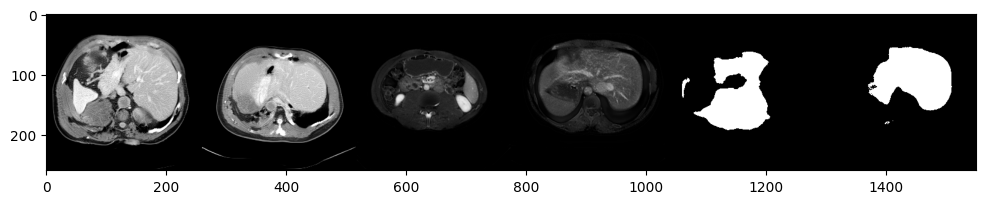

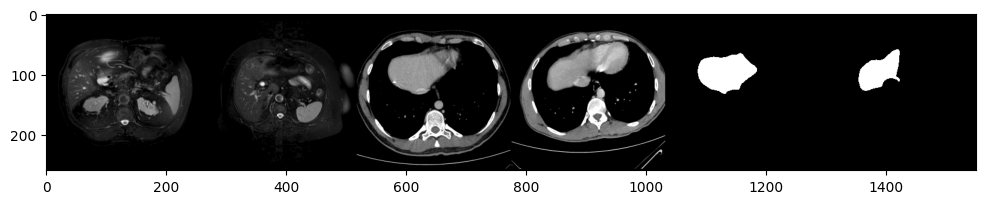

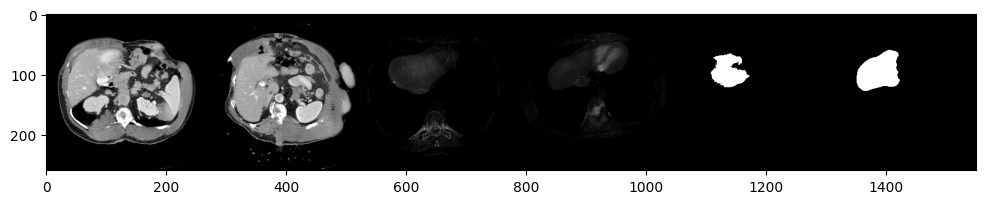

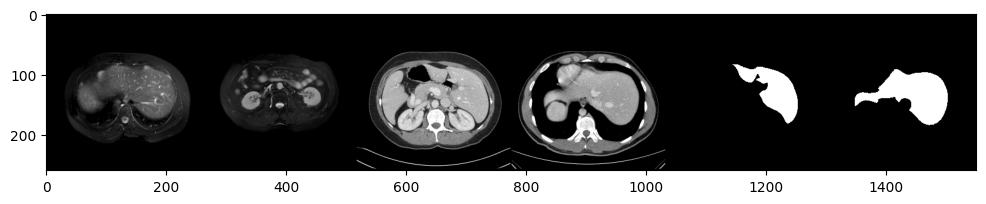

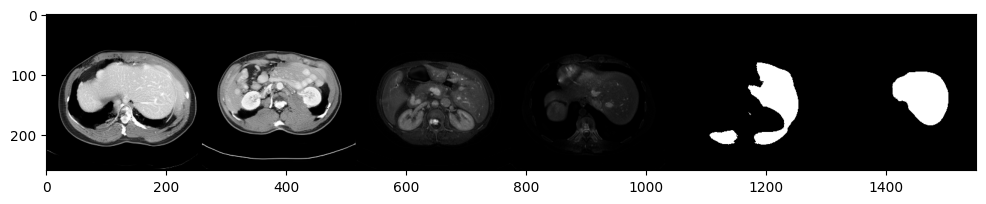

 70%|██████▉   | 176/253 [01:14<00:30,  2.53it/s]


#######################################################################
Please cite the following paper when using nnU-Net:
Isensee, F., Jaeger, P. F., Kohl, S. A., Petersen, J., & Maier-Hein, K. H. (2021). nnU-Net: a self-configuring method for deep learning-based biomedical image segmentation. Nature methods, 18(2), 203-211.
#######################################################################

There are 2 cases in the source folder
I am process 0 out of 1 (max process ID is 0, we start counting with 0!)
There are 2 cases that I would like to predict
using pin_memory on device 0

Predicting 0:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 0

Predicting 1:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 1


 70%|██████▉   | 177/253 [01:40<10:22,  8.19s/it]


#######################################################################
Please cite the following paper when using nnU-Net:
Isensee, F., Jaeger, P. F., Kohl, S. A., Petersen, J., & Maier-Hein, K. H. (2021). nnU-Net: a self-configuring method for deep learning-based biomedical image segmentation. Nature methods, 18(2), 203-211.
#######################################################################

There are 2 cases in the source folder
I am process 0 out of 1 (max process ID is 0, we start counting with 0!)
There are 2 cases that I would like to predict
using pin_memory on device 0

Predicting 0:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 0

Predicting 1:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 1


 70%|███████   | 178/253 [02:02<15:24, 12.33s/it]


#######################################################################
Please cite the following paper when using nnU-Net:
Isensee, F., Jaeger, P. F., Kohl, S. A., Petersen, J., & Maier-Hein, K. H. (2021). nnU-Net: a self-configuring method for deep learning-based biomedical image segmentation. Nature methods, 18(2), 203-211.
#######################################################################

There are 2 cases in the source folder
I am process 0 out of 1 (max process ID is 0, we start counting with 0!)
There are 2 cases that I would like to predict
using pin_memory on device 0

Predicting 0:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 0

Predicting 1:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 1


 71%|███████   | 179/253 [02:24<18:48, 15.25s/it]

Epoch: 61, Step: 15360, Generator Loss: 1.9070686420891434 
        Learning rate: 1.25e-05 
        Adversarial Loss: 1.584882544586435 
        Cycle Loss: 0.031179917328699958 
        Identity Loss: 0.10386923889018362 
        MR-Discriminator of whole image Loss: 0.20688371355936397
        MR-Discriminator of tumor image Loss: 0.24741064231784549
        CT-Discriminator of whole image Loss: 0.13955490445368923
        CT-Discriminator of tumor image Loss: 0.24077972550003324
        Numb of unique element in t2: 3117
100% 11/11 [00:01<00:00,  5.98it/s]
100% 11/11 [00:01<00:00,  6.62it/s]
FID:  0.7183001646528584


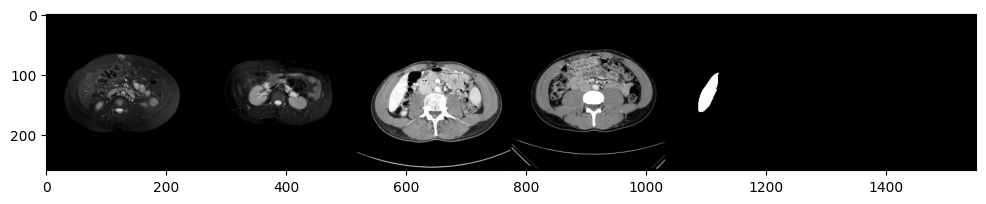

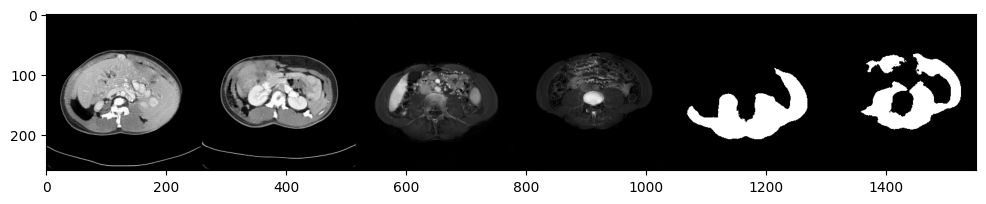

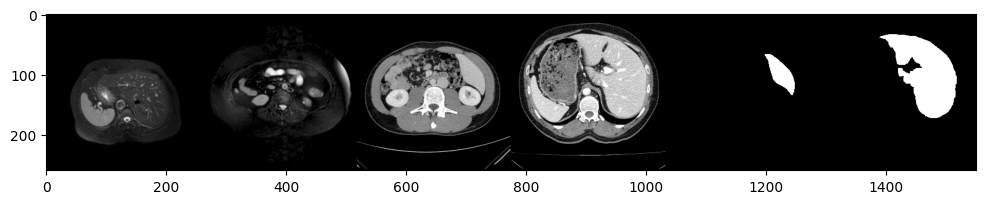

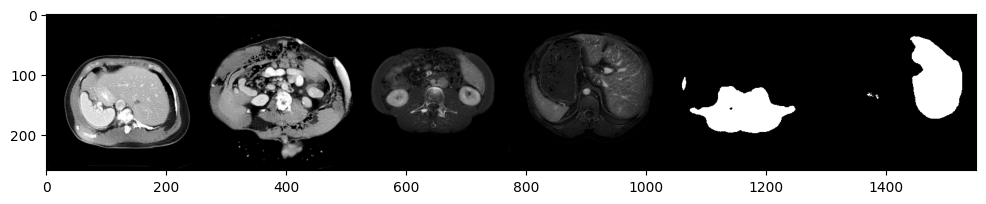

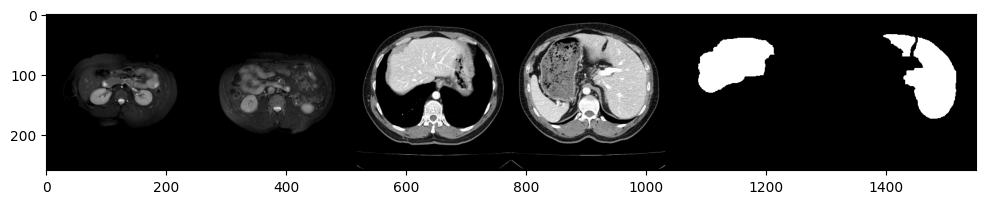

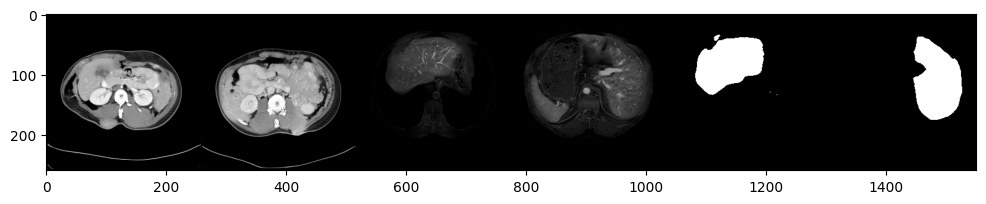

 74%|███████▍  | 188/253 [01:18<00:26,  2.47it/s]


#######################################################################
Please cite the following paper when using nnU-Net:
Isensee, F., Jaeger, P. F., Kohl, S. A., Petersen, J., & Maier-Hein, K. H. (2021). nnU-Net: a self-configuring method for deep learning-based biomedical image segmentation. Nature methods, 18(2), 203-211.
#######################################################################

There are 2 cases in the source folder
I am process 0 out of 1 (max process ID is 0, we start counting with 0!)
There are 2 cases that I would like to predict
using pin_memory on device 0

Predicting 0:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 0

Predicting 1:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 1


 75%|███████▍  | 189/253 [01:42<07:52,  7.38s/it]


#######################################################################
Please cite the following paper when using nnU-Net:
Isensee, F., Jaeger, P. F., Kohl, S. A., Petersen, J., & Maier-Hein, K. H. (2021). nnU-Net: a self-configuring method for deep learning-based biomedical image segmentation. Nature methods, 18(2), 203-211.
#######################################################################

There are 2 cases in the source folder
I am process 0 out of 1 (max process ID is 0, we start counting with 0!)
There are 2 cases that I would like to predict
using pin_memory on device 0

Predicting 0:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 0

Predicting 1:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 1


 75%|███████▌  | 190/253 [02:05<12:43, 12.11s/it]


#######################################################################
Please cite the following paper when using nnU-Net:
Isensee, F., Jaeger, P. F., Kohl, S. A., Petersen, J., & Maier-Hein, K. H. (2021). nnU-Net: a self-configuring method for deep learning-based biomedical image segmentation. Nature methods, 18(2), 203-211.
#######################################################################

There are 2 cases in the source folder
I am process 0 out of 1 (max process ID is 0, we start counting with 0!)
There are 2 cases that I would like to predict
using pin_memory on device 0

Predicting 0:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 0

Predicting 1:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 1


 75%|███████▌  | 191/253 [02:26<15:11, 14.70s/it]

Epoch: 65, Step: 16384, Generator Loss: 270.51044230372645 
        Learning rate: 1.25e-05 
        Adversarial Loss: 270.17281270376407 
        Cycle Loss: 0.03271381997365097 
        Identity Loss: 0.10492661245370982 
        MR-Discriminator of whole image Loss: 0.20460632277536206
        MR-Discriminator of tumor image Loss: 270.55489275153377
        CT-Discriminator of whole image Loss: 0.1390802602036274
        CT-Discriminator of tumor image Loss: 0.24163494183449075
        Numb of unique element in t2: 3155
100% 11/11 [00:02<00:00,  5.35it/s]
100% 11/11 [00:01<00:00,  5.65it/s]
FID:  0.6628102311704726


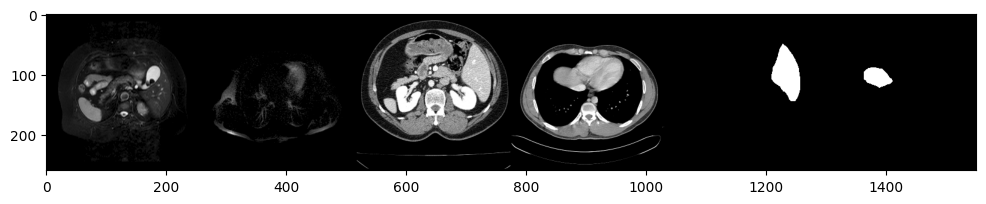

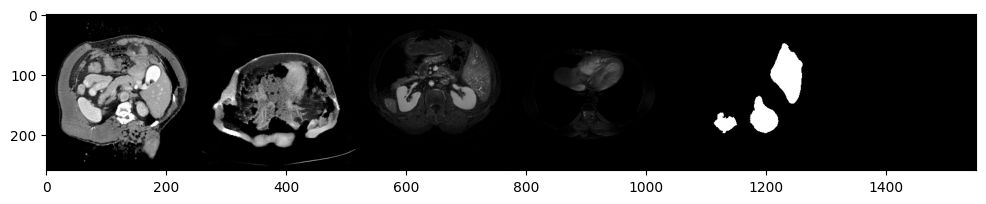

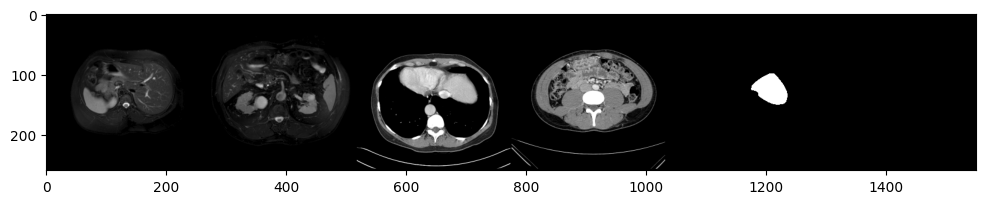

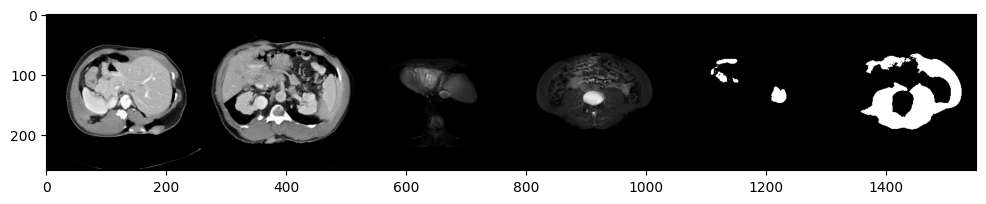

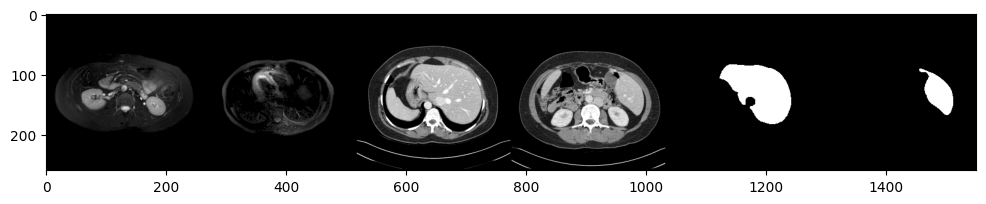

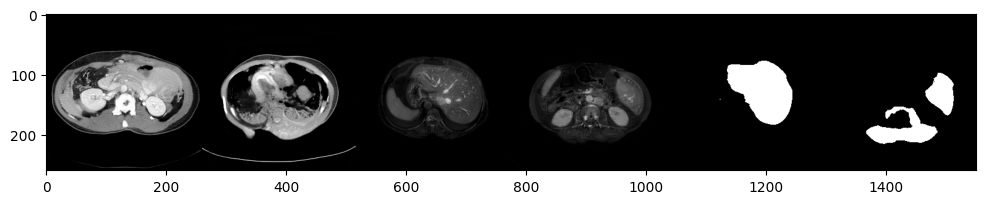

 79%|███████▉  | 200/253 [01:23<00:21,  2.52it/s]


#######################################################################
Please cite the following paper when using nnU-Net:
Isensee, F., Jaeger, P. F., Kohl, S. A., Petersen, J., & Maier-Hein, K. H. (2021). nnU-Net: a self-configuring method for deep learning-based biomedical image segmentation. Nature methods, 18(2), 203-211.
#######################################################################

There are 2 cases in the source folder
I am process 0 out of 1 (max process ID is 0, we start counting with 0!)
There are 2 cases that I would like to predict
using pin_memory on device 0

Predicting 0:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 0

Predicting 1:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 1


 79%|███████▉  | 201/253 [01:47<06:36,  7.62s/it]


#######################################################################
Please cite the following paper when using nnU-Net:
Isensee, F., Jaeger, P. F., Kohl, S. A., Petersen, J., & Maier-Hein, K. H. (2021). nnU-Net: a self-configuring method for deep learning-based biomedical image segmentation. Nature methods, 18(2), 203-211.
#######################################################################

There are 2 cases in the source folder
I am process 0 out of 1 (max process ID is 0, we start counting with 0!)
There are 2 cases that I would like to predict
using pin_memory on device 0

Predicting 0:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 0

Predicting 1:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 1


 80%|███████▉  | 202/253 [02:10<10:23, 12.22s/it]


#######################################################################
Please cite the following paper when using nnU-Net:
Isensee, F., Jaeger, P. F., Kohl, S. A., Petersen, J., & Maier-Hein, K. H. (2021). nnU-Net: a self-configuring method for deep learning-based biomedical image segmentation. Nature methods, 18(2), 203-211.
#######################################################################

There are 2 cases in the source folder
I am process 0 out of 1 (max process ID is 0, we start counting with 0!)
There are 2 cases that I would like to predict
using pin_memory on device 0

Predicting 0:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 0

Predicting 1:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 1


 80%|████████  | 203/253 [02:33<12:47, 15.36s/it]

Epoch: 69, Step: 17408, Generator Loss: 1.995038786320947 
        Learning rate: 1.25e-05 
        Adversarial Loss: 1.6602336927317083 
        Cycle Loss: 0.03241612427700602 
        Identity Loss: 0.10643852337670978 
        MR-Discriminator of whole image Loss: 0.20617318543372676
        MR-Discriminator of tumor image Loss: 0.30694666650379077
        CT-Discriminator of whole image Loss: 0.13437025611347053
        CT-Discriminator of tumor image Loss: 0.24812427851429675
        Numb of unique element in t2: 3406
100% 11/11 [00:01<00:00,  5.82it/s]
100% 11/11 [00:01<00:00,  6.73it/s]
FID:  0.6136776968077189


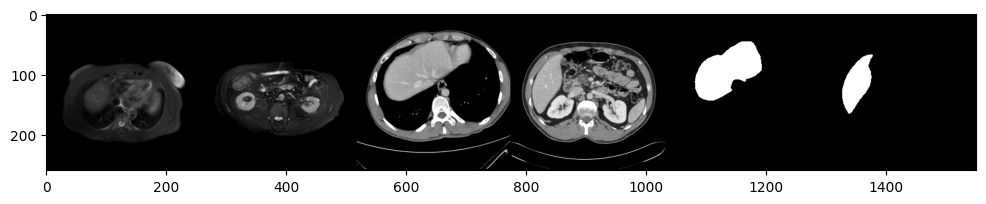

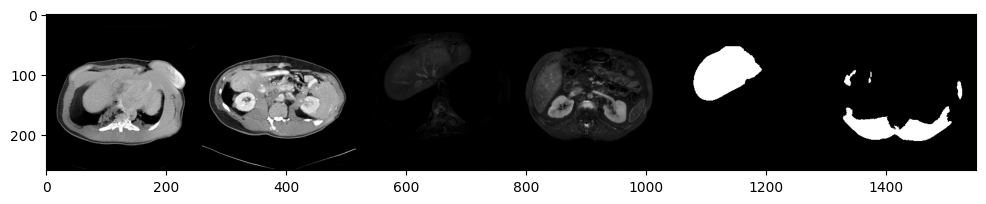

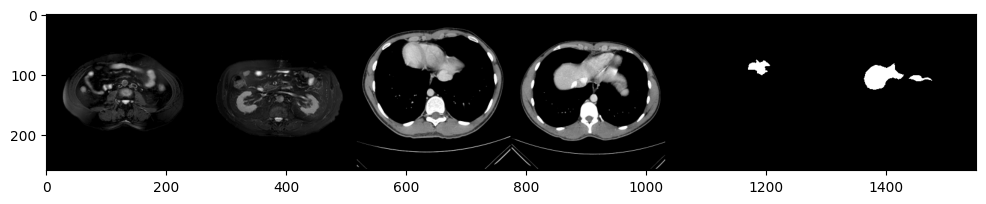

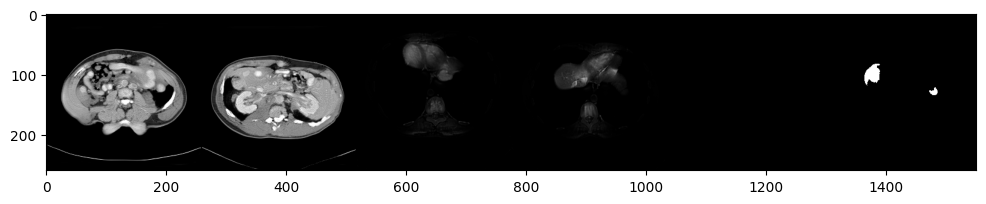

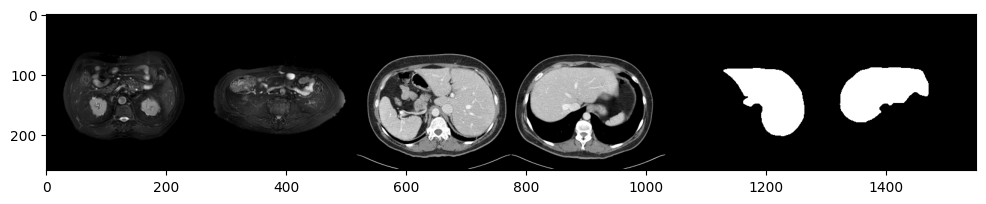

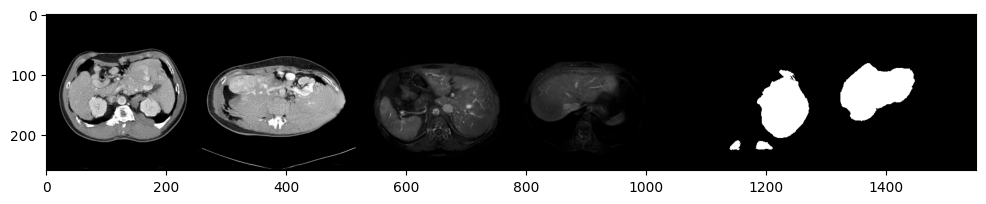

 84%|████████▍ | 212/253 [01:28<00:17,  2.38it/s]


#######################################################################
Please cite the following paper when using nnU-Net:
Isensee, F., Jaeger, P. F., Kohl, S. A., Petersen, J., & Maier-Hein, K. H. (2021). nnU-Net: a self-configuring method for deep learning-based biomedical image segmentation. Nature methods, 18(2), 203-211.
#######################################################################

There are 2 cases in the source folder
I am process 0 out of 1 (max process ID is 0, we start counting with 0!)
There are 2 cases that I would like to predict
using pin_memory on device 0

Predicting 0:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 0

Predicting 1:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 1


 84%|████████▍ | 213/253 [01:51<04:44,  7.12s/it]


#######################################################################
Please cite the following paper when using nnU-Net:
Isensee, F., Jaeger, P. F., Kohl, S. A., Petersen, J., & Maier-Hein, K. H. (2021). nnU-Net: a self-configuring method for deep learning-based biomedical image segmentation. Nature methods, 18(2), 203-211.
#######################################################################

There are 2 cases in the source folder
I am process 0 out of 1 (max process ID is 0, we start counting with 0!)
There are 2 cases that I would like to predict
using pin_memory on device 0

Predicting 0:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 0

Predicting 1:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 1


 85%|████████▍ | 214/253 [02:15<07:48, 12.01s/it]


#######################################################################
Please cite the following paper when using nnU-Net:
Isensee, F., Jaeger, P. F., Kohl, S. A., Petersen, J., & Maier-Hein, K. H. (2021). nnU-Net: a self-configuring method for deep learning-based biomedical image segmentation. Nature methods, 18(2), 203-211.
#######################################################################

There are 2 cases in the source folder
I am process 0 out of 1 (max process ID is 0, we start counting with 0!)
There are 2 cases that I would like to predict
using pin_memory on device 0

Predicting 0:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 0

Predicting 1:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 1


 85%|████████▍ | 215/253 [02:35<09:11, 14.51s/it]

Epoch: 73, Step: 18432, Generator Loss: 1.949037225684151 
        Learning rate: 1.25e-05 
        Adversarial Loss: 1.6064563668332994 
        Cycle Loss: 0.03315563831711188 
        Identity Loss: 0.11024475203885231 
        MR-Discriminator of whole image Loss: 0.20290692617709283
        MR-Discriminator of tumor image Loss: 0.2556168001901824
        CT-Discriminator of whole image Loss: 0.1329698433764861
        CT-Discriminator of tumor image Loss: 0.24107031399034895
        Numb of unique element in t2: 2526
100% 11/11 [00:01<00:00,  5.64it/s]
100% 11/11 [00:01<00:00,  6.23it/s]
FID:  0.5758562870836672


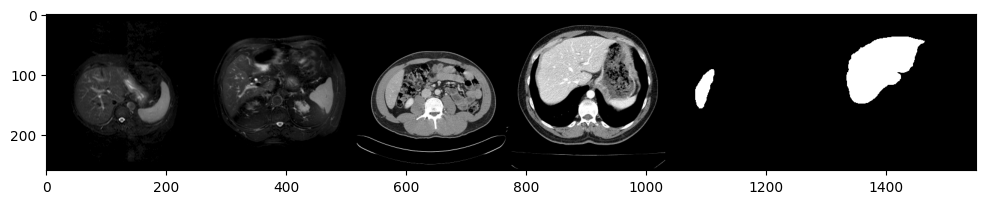

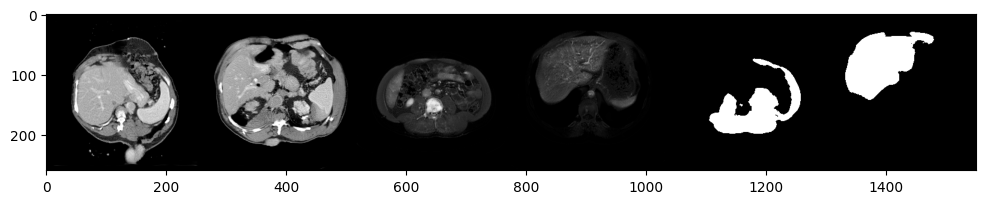

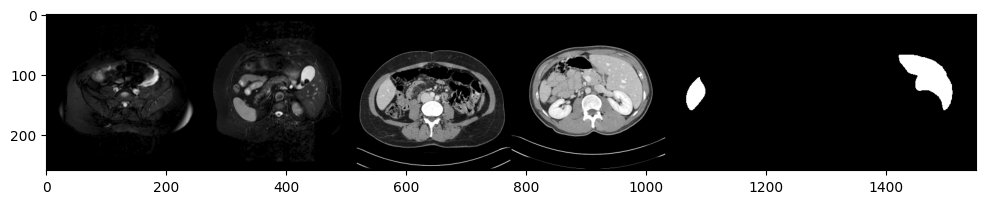

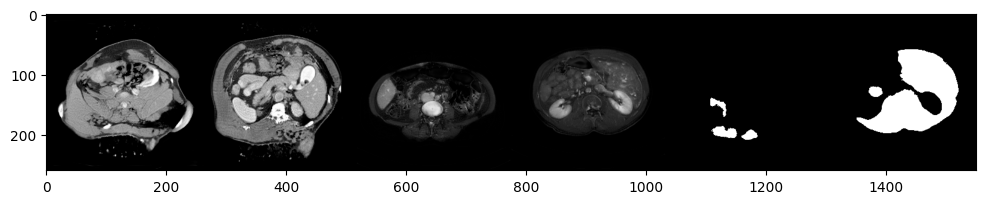

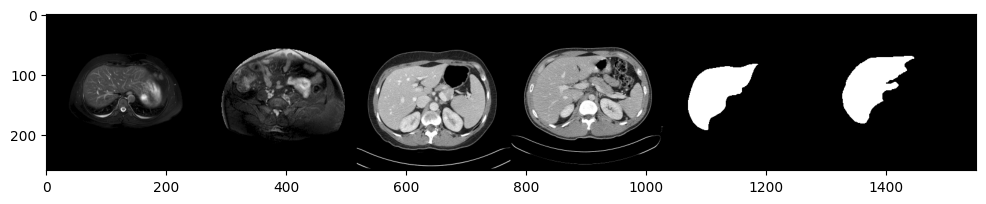

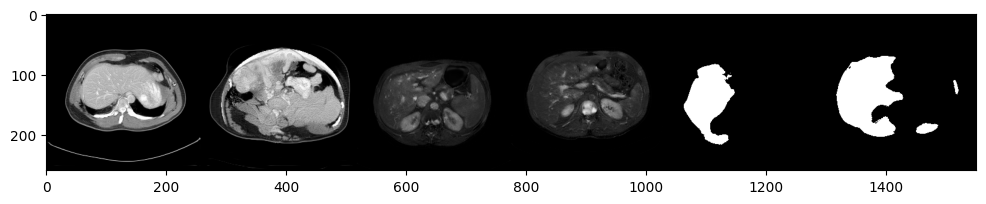

 89%|████████▊ | 224/253 [01:35<00:11,  2.49it/s]


#######################################################################
Please cite the following paper when using nnU-Net:
Isensee, F., Jaeger, P. F., Kohl, S. A., Petersen, J., & Maier-Hein, K. H. (2021). nnU-Net: a self-configuring method for deep learning-based biomedical image segmentation. Nature methods, 18(2), 203-211.
#######################################################################

There are 2 cases in the source folder
I am process 0 out of 1 (max process ID is 0, we start counting with 0!)
There are 2 cases that I would like to predict
using pin_memory on device 0

Predicting 0:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 0

Predicting 1:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 1


 89%|████████▉ | 225/253 [02:00<03:36,  7.74s/it]


#######################################################################
Please cite the following paper when using nnU-Net:
Isensee, F., Jaeger, P. F., Kohl, S. A., Petersen, J., & Maier-Hein, K. H. (2021). nnU-Net: a self-configuring method for deep learning-based biomedical image segmentation. Nature methods, 18(2), 203-211.
#######################################################################

There are 2 cases in the source folder
I am process 0 out of 1 (max process ID is 0, we start counting with 0!)
There are 2 cases that I would like to predict
using pin_memory on device 0

Predicting 0:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 0

Predicting 1:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 1


 89%|████████▉ | 226/253 [02:21<05:16, 11.72s/it]


#######################################################################
Please cite the following paper when using nnU-Net:
Isensee, F., Jaeger, P. F., Kohl, S. A., Petersen, J., & Maier-Hein, K. H. (2021). nnU-Net: a self-configuring method for deep learning-based biomedical image segmentation. Nature methods, 18(2), 203-211.
#######################################################################

There are 2 cases in the source folder
I am process 0 out of 1 (max process ID is 0, we start counting with 0!)
There are 2 cases that I would like to predict
using pin_memory on device 0

Predicting 0:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 0

Predicting 1:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 1


 90%|████████▉ | 227/253 [02:44<06:39, 15.38s/it]

Epoch: 77, Step: 19456, Generator Loss: 2.1339523093774915 
        Learning rate: 1.25e-05 
        Adversarial Loss: 1.7888055309886113 
        Cycle Loss: 0.03338673312282481 
        Identity Loss: 0.11279444132378558 
        MR-Discriminator of whole image Loss: 0.20255027087114286
        MR-Discriminator of tumor image Loss: 0.42281540179101285
        CT-Discriminator of whole image Loss: 0.13100161308830138
        CT-Discriminator of tumor image Loss: 0.24000448889273684
        Numb of unique element in t2: 2848
100% 11/11 [00:02<00:00,  4.31it/s]
100% 11/11 [00:01<00:00,  6.59it/s]
FID:  0.55598144003614


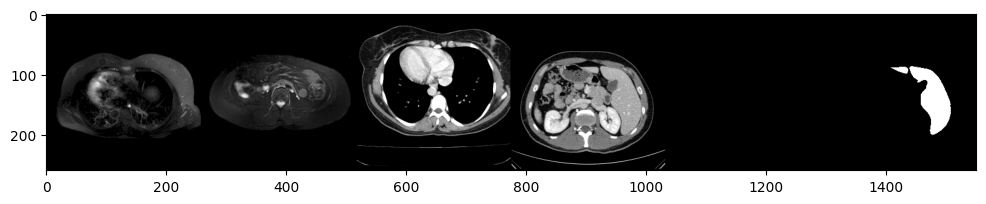

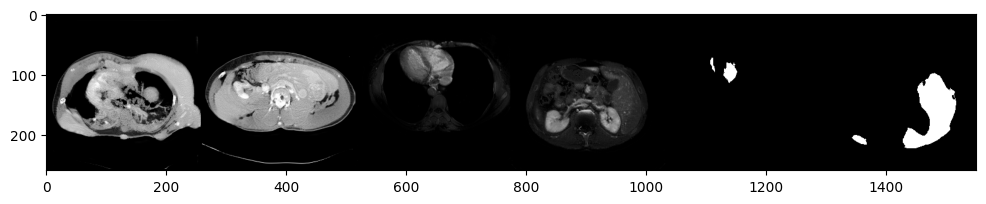

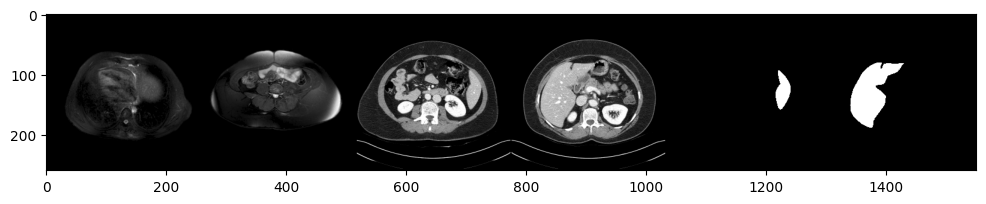

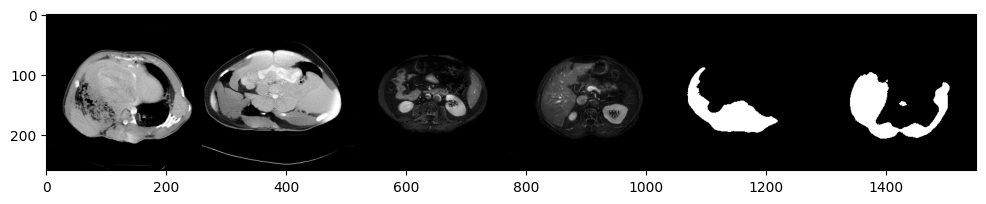

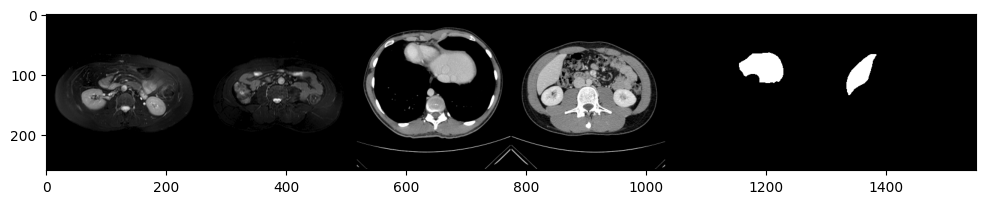

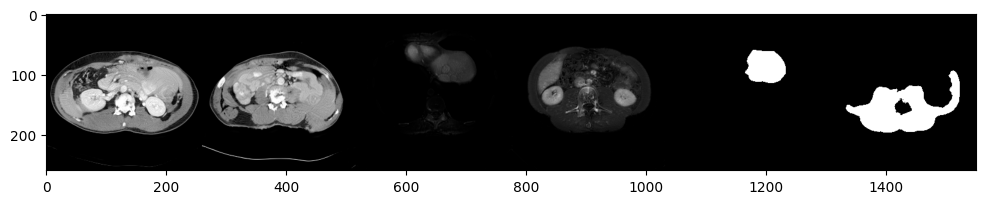

 93%|█████████▎| 236/253 [01:40<00:07,  2.39it/s]


#######################################################################
Please cite the following paper when using nnU-Net:
Isensee, F., Jaeger, P. F., Kohl, S. A., Petersen, J., & Maier-Hein, K. H. (2021). nnU-Net: a self-configuring method for deep learning-based biomedical image segmentation. Nature methods, 18(2), 203-211.
#######################################################################

There are 2 cases in the source folder
I am process 0 out of 1 (max process ID is 0, we start counting with 0!)
There are 2 cases that I would like to predict
using pin_memory on device 0

Predicting 0:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 0

Predicting 1:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 1


 94%|█████████▎| 237/253 [02:04<01:59,  7.49s/it]


#######################################################################
Please cite the following paper when using nnU-Net:
Isensee, F., Jaeger, P. F., Kohl, S. A., Petersen, J., & Maier-Hein, K. H. (2021). nnU-Net: a self-configuring method for deep learning-based biomedical image segmentation. Nature methods, 18(2), 203-211.
#######################################################################

There are 2 cases in the source folder
I am process 0 out of 1 (max process ID is 0, we start counting with 0!)
There are 2 cases that I would like to predict
using pin_memory on device 0

Predicting 0:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 0

Predicting 1:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 1


 94%|█████████▍| 238/253 [02:28<03:02, 12.20s/it]


#######################################################################
Please cite the following paper when using nnU-Net:
Isensee, F., Jaeger, P. F., Kohl, S. A., Petersen, J., & Maier-Hein, K. H. (2021). nnU-Net: a self-configuring method for deep learning-based biomedical image segmentation. Nature methods, 18(2), 203-211.
#######################################################################

There are 2 cases in the source folder
I am process 0 out of 1 (max process ID is 0, we start counting with 0!)
There are 2 cases that I would like to predict
using pin_memory on device 0

Predicting 0:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 0

Predicting 1:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 1


 94%|█████████▍| 239/253 [02:49<03:30, 15.04s/it]

Epoch: 81, Step: 20480, Generator Loss: 2.013372182729654 
        Learning rate: 1.25e-05 
        Adversarial Loss: 1.6678145186742768 
        Cycle Loss: 0.0334177127260773 
        Identity Loss: 0.11380536223441595 
        MR-Discriminator of whole image Loss: 0.20629517702036537
        MR-Discriminator of tumor image Loss: 0.29920723536633886
        CT-Discriminator of whole image Loss: 0.12876598696311703
        CT-Discriminator of tumor image Loss: 0.23863447515759617
        Numb of unique element in t2: 1178
100% 11/11 [00:01<00:00,  5.89it/s]
100% 11/11 [00:01<00:00,  5.94it/s]
FID:  0.5541115340931306


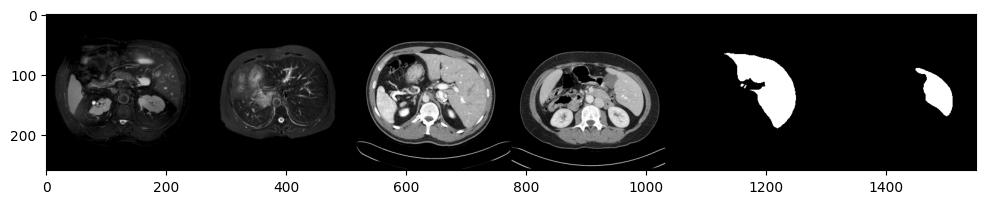

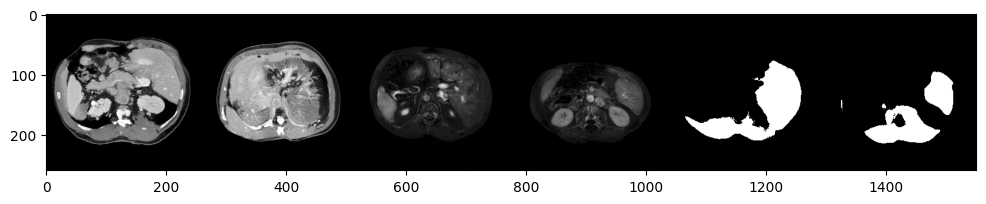

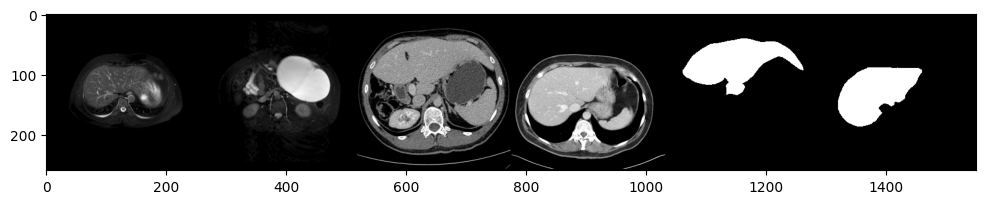

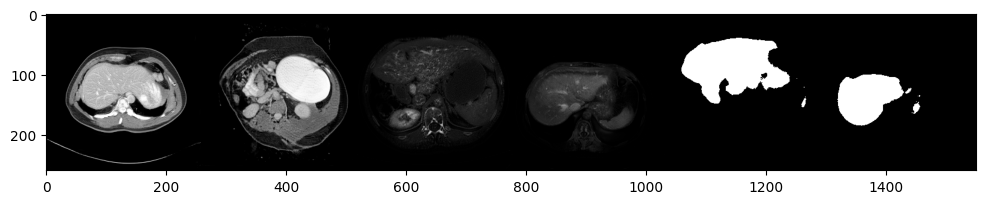

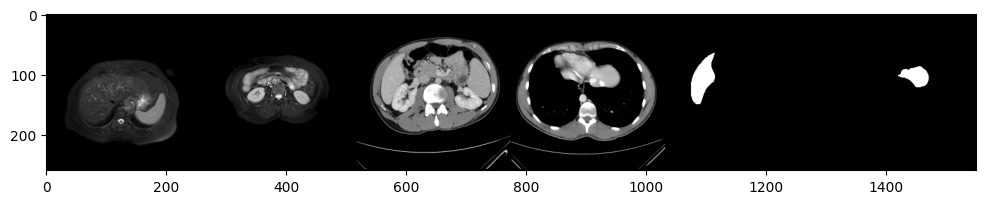

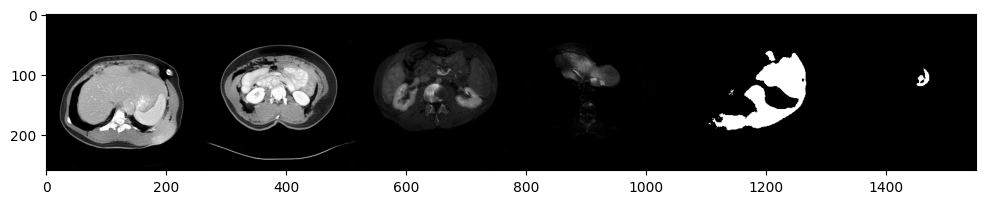

 98%|█████████▊| 248/253 [01:45<00:02,  2.45it/s]


#######################################################################
Please cite the following paper when using nnU-Net:
Isensee, F., Jaeger, P. F., Kohl, S. A., Petersen, J., & Maier-Hein, K. H. (2021). nnU-Net: a self-configuring method for deep learning-based biomedical image segmentation. Nature methods, 18(2), 203-211.
#######################################################################

There are 2 cases in the source folder
I am process 0 out of 1 (max process ID is 0, we start counting with 0!)
There are 2 cases that I would like to predict
using pin_memory on device 0

Predicting 0:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 0

Predicting 1:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 1


 98%|█████████▊| 249/253 [02:48<01:16, 19.04s/it]


#######################################################################
Please cite the following paper when using nnU-Net:
Isensee, F., Jaeger, P. F., Kohl, S. A., Petersen, J., & Maier-Hein, K. H. (2021). nnU-Net: a self-configuring method for deep learning-based biomedical image segmentation. Nature methods, 18(2), 203-211.
#######################################################################

There are 2 cases in the source folder
I am process 0 out of 1 (max process ID is 0, we start counting with 0!)
There are 2 cases that I would like to predict
using pin_memory on device 0

Predicting 0:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 0

Predicting 1:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 1


 99%|█████████▉| 250/253 [03:12<01:01, 20.58s/it]


#######################################################################
Please cite the following paper when using nnU-Net:
Isensee, F., Jaeger, P. F., Kohl, S. A., Petersen, J., & Maier-Hein, K. H. (2021). nnU-Net: a self-configuring method for deep learning-based biomedical image segmentation. Nature methods, 18(2), 203-211.
#######################################################################

There are 2 cases in the source folder
I am process 0 out of 1 (max process ID is 0, we start counting with 0!)
There are 2 cases that I would like to predict
using pin_memory on device 0

Predicting 0:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 0

Predicting 1:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 1


 99%|█████████▉| 251/253 [03:32<00:41, 20.55s/it]

Epoch: 85, Step: 21504, Generator Loss: 1.9909779162844643 
        Learning rate: 1.25e-05 
        Adversarial Loss: 1.6387984508182853 
        Cycle Loss: 0.034059847028402146 
        Identity Loss: 0.11580994904943509 
        MR-Discriminator of whole image Loss: 0.2011187213793164
        MR-Discriminator of tumor image Loss: 0.2609872182511026
        CT-Discriminator of whole image Loss: 0.1274614687426947
        CT-Discriminator of tumor image Loss: 0.2390585199027555
        Numb of unique element in t2: 885
100% 11/11 [00:01<00:00,  5.68it/s]
100% 11/11 [00:01<00:00,  6.37it/s]
FID:  0.5365309640834834


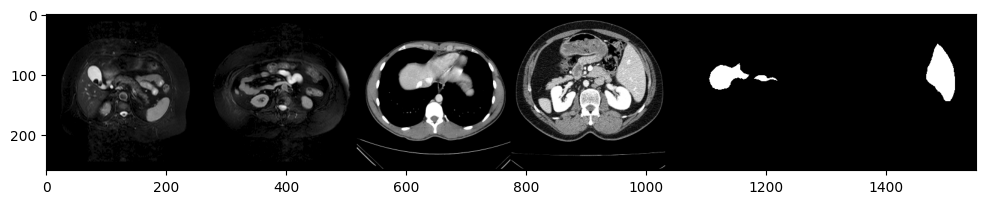

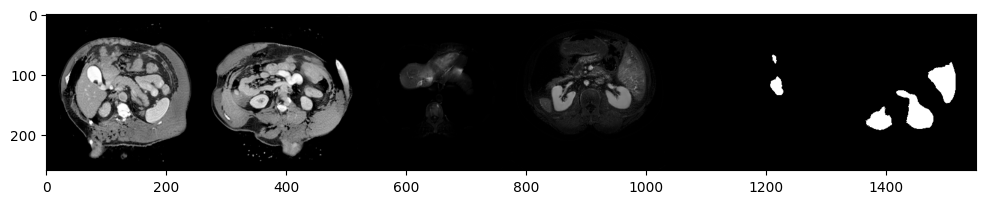

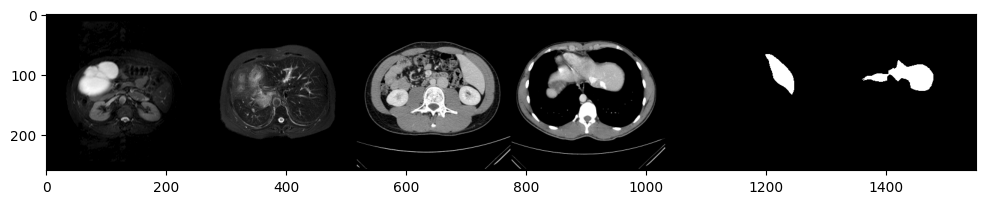

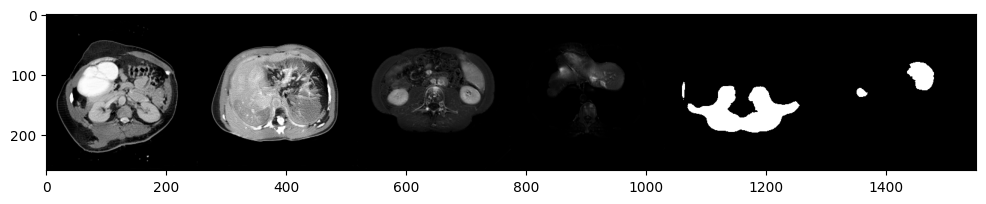

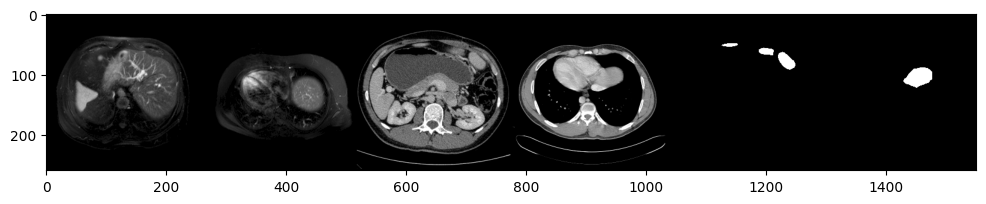

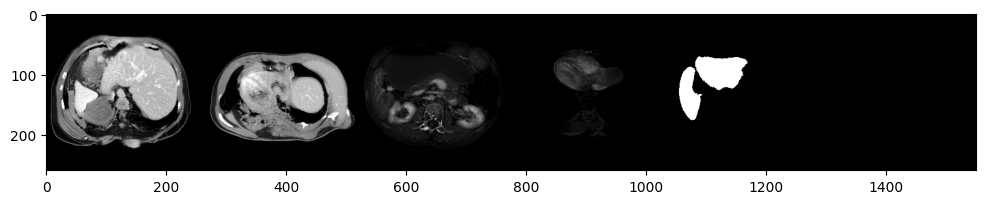

  3%|▎         | 7/253 [00:02<01:38,  2.49it/s]


#######################################################################
Please cite the following paper when using nnU-Net:
Isensee, F., Jaeger, P. F., Kohl, S. A., Petersen, J., & Maier-Hein, K. H. (2021). nnU-Net: a self-configuring method for deep learning-based biomedical image segmentation. Nature methods, 18(2), 203-211.
#######################################################################

There are 2 cases in the source folder
I am process 0 out of 1 (max process ID is 0, we start counting with 0!)
There are 2 cases that I would like to predict
using pin_memory on device 0

Predicting 0:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 0

Predicting 1:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 1


  3%|▎         | 8/253 [00:25<30:27,  7.46s/it]


#######################################################################
Please cite the following paper when using nnU-Net:
Isensee, F., Jaeger, P. F., Kohl, S. A., Petersen, J., & Maier-Hein, K. H. (2021). nnU-Net: a self-configuring method for deep learning-based biomedical image segmentation. Nature methods, 18(2), 203-211.
#######################################################################

There are 2 cases in the source folder
I am process 0 out of 1 (max process ID is 0, we start counting with 0!)
There are 2 cases that I would like to predict
using pin_memory on device 0

Predicting 0:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 0

Predicting 1:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 1


  4%|▎         | 9/253 [00:47<49:08, 12.09s/it]


#######################################################################
Please cite the following paper when using nnU-Net:
Isensee, F., Jaeger, P. F., Kohl, S. A., Petersen, J., & Maier-Hein, K. H. (2021). nnU-Net: a self-configuring method for deep learning-based biomedical image segmentation. Nature methods, 18(2), 203-211.
#######################################################################

There are 2 cases in the source folder
I am process 0 out of 1 (max process ID is 0, we start counting with 0!)
There are 2 cases that I would like to predict
using pin_memory on device 0

Predicting 0:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 0

Predicting 1:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 1


  4%|▍         | 10/253 [01:09<1:00:56, 15.05s/it]

Epoch: 90, Step: 22528, Generator Loss: 1.9889446350280195 
        Learning rate: 1.25e-05 
        Adversarial Loss: 1.6383496759226546 
        Cycle Loss: 0.03388692529006221 
        Identity Loss: 0.11725704796845093 
        MR-Discriminator of whole image Loss: 0.2043779368250398
        MR-Discriminator of tumor image Loss: 0.25921545340679586
        CT-Discriminator of whole image Loss: 0.12711743325053249
        CT-Discriminator of tumor image Loss: 0.2375489745172672
        Numb of unique element in t2: 3426
100% 11/11 [00:01<00:00,  5.67it/s]
100% 11/11 [00:01<00:00,  5.94it/s]
FID:  0.5369245039767285


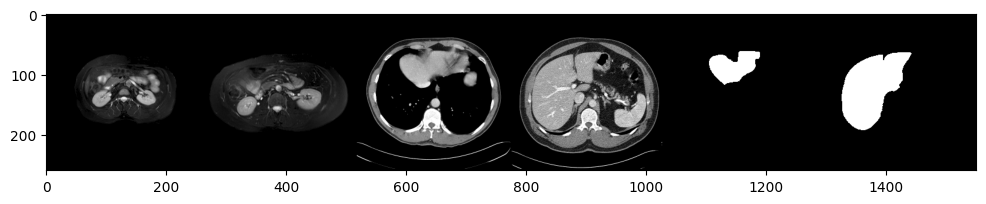

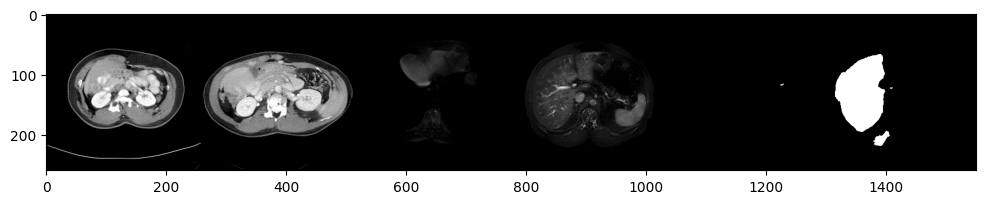

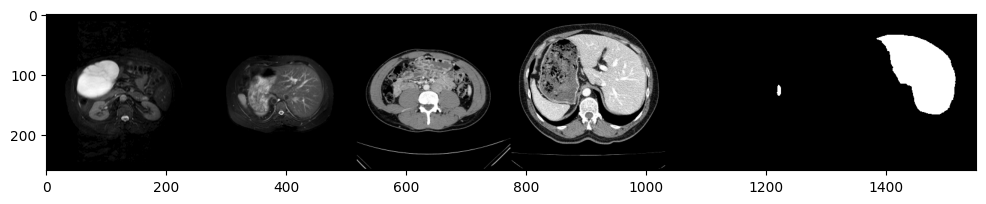

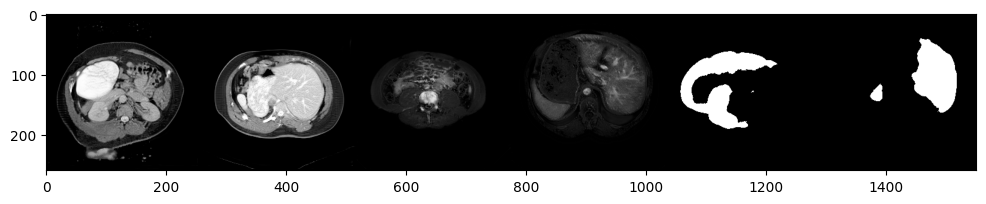

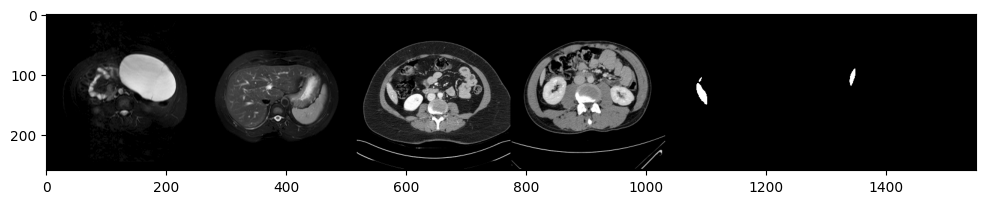

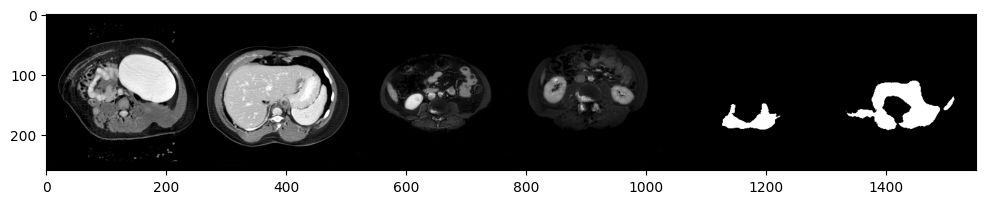

  8%|▊         | 19/253 [00:08<01:39,  2.36it/s]


#######################################################################
Please cite the following paper when using nnU-Net:
Isensee, F., Jaeger, P. F., Kohl, S. A., Petersen, J., & Maier-Hein, K. H. (2021). nnU-Net: a self-configuring method for deep learning-based biomedical image segmentation. Nature methods, 18(2), 203-211.
#######################################################################

There are 2 cases in the source folder
I am process 0 out of 1 (max process ID is 0, we start counting with 0!)
There are 2 cases that I would like to predict
using pin_memory on device 0

Predicting 0:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 0

Predicting 1:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 1


  8%|▊         | 20/253 [00:30<27:13,  7.01s/it]


#######################################################################
Please cite the following paper when using nnU-Net:
Isensee, F., Jaeger, P. F., Kohl, S. A., Petersen, J., & Maier-Hein, K. H. (2021). nnU-Net: a self-configuring method for deep learning-based biomedical image segmentation. Nature methods, 18(2), 203-211.
#######################################################################

There are 2 cases in the source folder
I am process 0 out of 1 (max process ID is 0, we start counting with 0!)
There are 2 cases that I would like to predict
using pin_memory on device 0

Predicting 0:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 0

Predicting 1:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 1


  8%|▊         | 21/253 [00:54<46:40, 12.07s/it]


#######################################################################
Please cite the following paper when using nnU-Net:
Isensee, F., Jaeger, P. F., Kohl, S. A., Petersen, J., & Maier-Hein, K. H. (2021). nnU-Net: a self-configuring method for deep learning-based biomedical image segmentation. Nature methods, 18(2), 203-211.
#######################################################################

There are 2 cases in the source folder
I am process 0 out of 1 (max process ID is 0, we start counting with 0!)
There are 2 cases that I would like to predict
using pin_memory on device 0

Predicting 0:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 0

Predicting 1:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 1


  9%|▊         | 22/253 [01:15<56:04, 14.57s/it]

Epoch: 94, Step: 23552, Generator Loss: 2.032141475006938 
        Learning rate: 1.25e-05 
        Adversarial Loss: 1.6751843116944656 
        Cycle Loss: 0.03450049523053167 
        Identity Loss: 0.11952210910385475 
        MR-Discriminator of whole image Loss: 0.20608644871390425
        MR-Discriminator of tumor image Loss: 0.2666121509100776
        CT-Discriminator of whole image Loss: 0.12592978494649287
        CT-Discriminator of tumor image Loss: 0.24560546032444108
        Numb of unique element in t2: 3335
100% 11/11 [00:01<00:00,  5.82it/s]
100% 11/11 [00:01<00:00,  6.02it/s]
FID:  0.5285387123001191


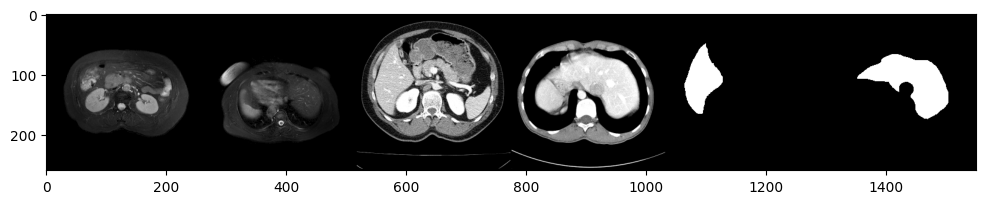

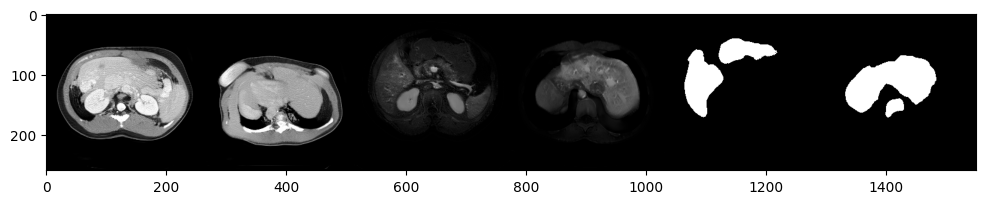

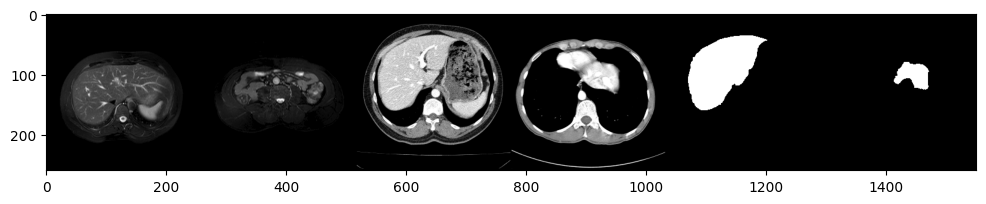

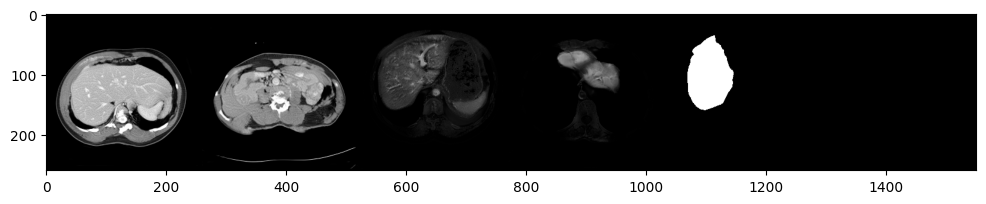

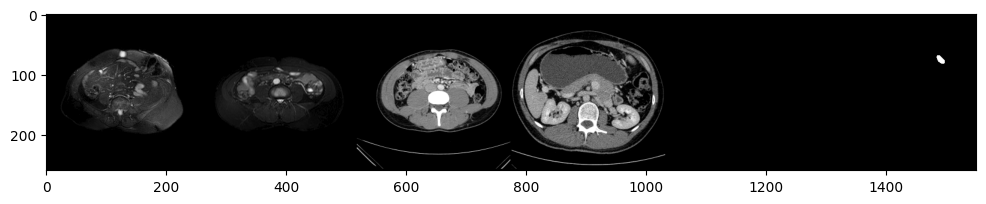

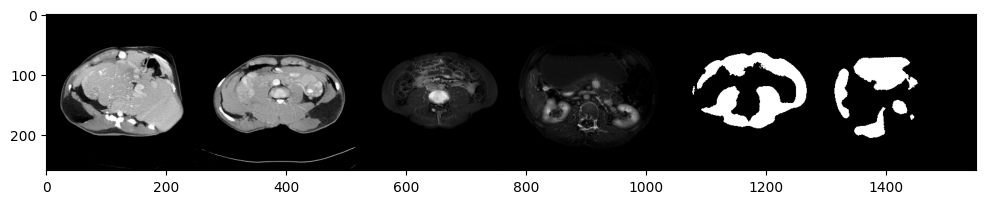

 12%|█▏        | 31/253 [00:13<01:48,  2.04it/s]


#######################################################################
Please cite the following paper when using nnU-Net:
Isensee, F., Jaeger, P. F., Kohl, S. A., Petersen, J., & Maier-Hein, K. H. (2021). nnU-Net: a self-configuring method for deep learning-based biomedical image segmentation. Nature methods, 18(2), 203-211.
#######################################################################

There are 2 cases in the source folder
I am process 0 out of 1 (max process ID is 0, we start counting with 0!)
There are 2 cases that I would like to predict
using pin_memory on device 0

Predicting 0:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 0

Predicting 1:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 1


 13%|█▎        | 32/253 [00:36<26:53,  7.30s/it]


#######################################################################
Please cite the following paper when using nnU-Net:
Isensee, F., Jaeger, P. F., Kohl, S. A., Petersen, J., & Maier-Hein, K. H. (2021). nnU-Net: a self-configuring method for deep learning-based biomedical image segmentation. Nature methods, 18(2), 203-211.
#######################################################################

There are 2 cases in the source folder
I am process 0 out of 1 (max process ID is 0, we start counting with 0!)
There are 2 cases that I would like to predict
using pin_memory on device 0

Predicting 0:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 0

Predicting 1:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 1


 13%|█▎        | 33/253 [00:59<43:49, 11.95s/it]


#######################################################################
Please cite the following paper when using nnU-Net:
Isensee, F., Jaeger, P. F., Kohl, S. A., Petersen, J., & Maier-Hein, K. H. (2021). nnU-Net: a self-configuring method for deep learning-based biomedical image segmentation. Nature methods, 18(2), 203-211.
#######################################################################

There are 2 cases in the source folder
I am process 0 out of 1 (max process ID is 0, we start counting with 0!)
There are 2 cases that I would like to predict
using pin_memory on device 0

Predicting 0:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 0

Predicting 1:
perform_everything_on_gpu: True
Prediction done, transferring to CPU if needed
sending off prediction to background worker for resampling and export
done with 1


 13%|█▎        | 34/253 [01:21<54:22, 14.90s/it]

Epoch: 98, Step: 24576, Generator Loss: 2.0104958389420062 
        Learning rate: 1.25e-05 
        Adversarial Loss: 1.6514485395746306 
        Cycle Loss: 0.034723302258498734 
        Identity Loss: 0.11814276203949703 
        MR-Discriminator of whole image Loss: 0.20044841575145256
        MR-Discriminator of tumor image Loss: 0.2567894824605901
        CT-Discriminator of whole image Loss: 0.12499283225770341
        CT-Discriminator of tumor image Loss: 0.23655290364695247
        Numb of unique element in t2: 2699
100% 11/11 [00:01<00:00,  5.74it/s]
100% 11/11 [00:01<00:00,  6.26it/s]
FID:  0.52190483245758


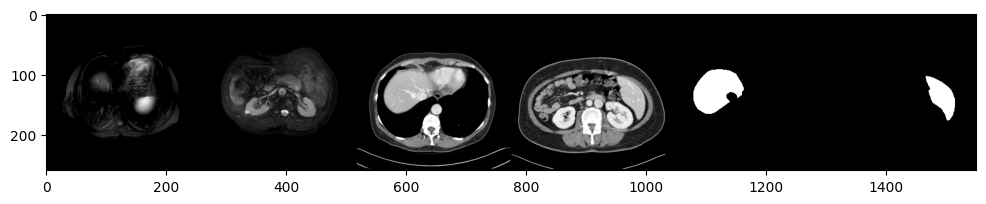

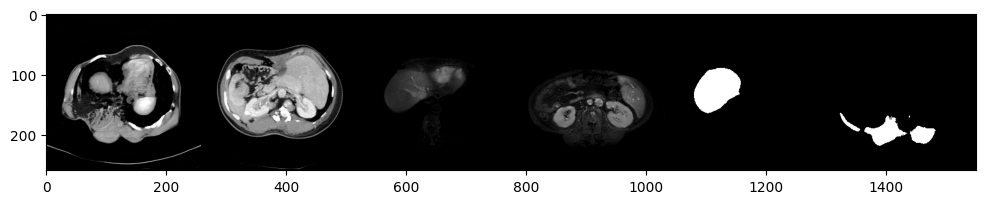

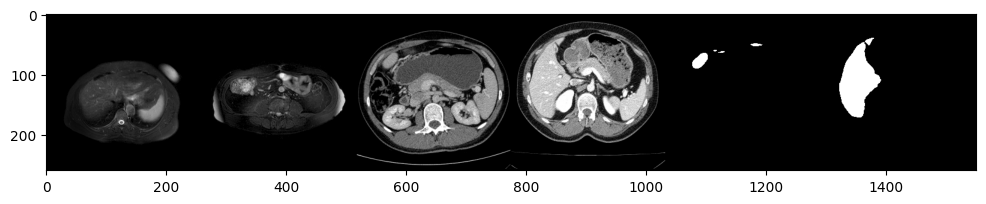

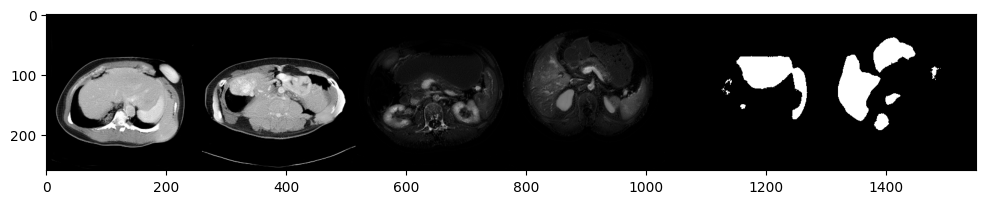

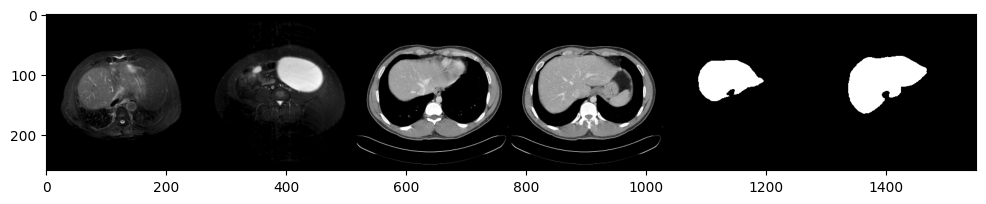

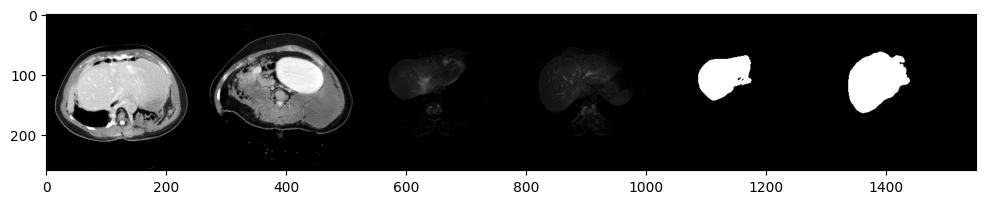

100%|██████████| 253/253 [01:50<00:00,  2.28it/s]


In [ ]:
current_step = 0
current_batch = 0
current_epoch = 0
batch_size = 2
number_of_epoch = 100
experiment = None

dict_loss = {'Learning rate': [], 'Adversarial Loss': [], 'Cycle Loss': [], 'Identity Loss': [],
              'MR-Discriminator of whole image Loss': [], 'MR-Discriminator of tumor image Loss': [],
              'CT-Discriminator of whole image Loss': [], 'CT-Discriminator of tumor image Loss': [],
              'display_step': []}

train_mixed_precision_accumulation(genCT2MR, genMR2CT, gen_opt, disc_x_MR, disc_x_MR_opt,
      disc_t_MR, disc_t_MR_opt, disc_t_CT, disc_t_CT_opt,
      disc_x_CT, disc_x_CT_opt,
      gen_scaler, disc_x_MR_scaler, disc_t_MR_scaler, disc_x_CT_scaler, disc_t_CT_scaler,
      n_epoch=number_of_epoch, curr_epoch=current_epoch, curr_step=current_step, curr_batch=current_batch, device=device, batchsize=batch_size,
      experiment=experiment, dict_loss=dict_loss)

In [ ]:
import json

In [ ]:
with open("dict_19.6.json", "w") as outfile:
    json.dump(dict_loss, outfile)

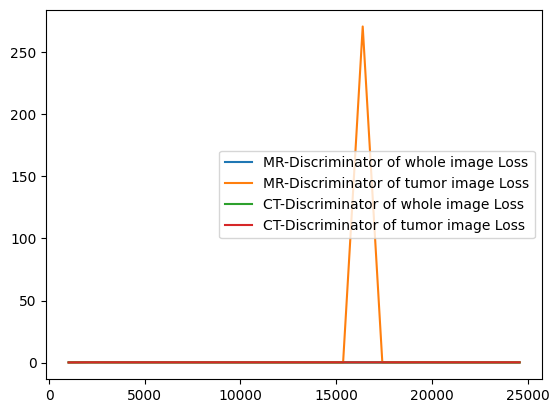

In [ ]:
records = [
           'MR-Discriminator of whole image Loss', 'MR-Discriminator of tumor image Loss',
            'CT-Discriminator of whole image Loss', 'CT-Discriminator of tumor image Loss']

for e in records:
  plt.plot(dict_loss['display_step'], dict_loss[e] , label=e)

plt.legend()
plt.show()

#### Load Model from checkpoint

In [ ]:
PATH = 'main_drive/MyDrive/tarGAN_saved_models/NO crossloss, glr = 1e-4, dlr = 1e-5, 50epoch/saved_models_4096.pt'

checkpoint = torch.load(PATH, map_location='cpu')

In [ ]:
lr = 1e-4
betas = (0.5, 0.9)
device = torch.device('cuda')

# Load generator
genCT2MR_loaded_1600 = Generator(1, 64, 2, 3, True, True).to(device)
genCT2MR_loaded_1600.load_state_dict(checkpoint['genCT2MR_state_dict'])

genMR2CT_loaded_1600 = Generator(1, 64, 2, 3, True, True).to(device)
genMR2CT_loaded_1600.load_state_dict(checkpoint['genMR2CT_state_dict'])

gen_opt_loaded_1600 = torch.optim.Adam(list(genCT2MR_loaded_1600.parameters()) + list(genMR2CT_loaded_1600.parameters()))
gen_opt_loaded_1600.load_state_dict(checkpoint['gen_opt_state_dict'])

# disc_x_MR
disc_x_MR_loaded_1600 = Discriminator(c_dim=1, image_size=256).to(device)
disc_x_MR_loaded_1600.load_state_dict(checkpoint['disc_x_MR_state_dict'])

disc_x_MR_opt_loaded_1600 = torch.optim.Adam(disc_x_MR_loaded_1600.parameters())
disc_x_MR_opt_loaded_1600.load_state_dict(checkpoint['disc_x_MR_opt_state_dict'])

# disc_t_MR
disc_t_MR_loaded_1600 = Discriminator(c_dim=1, image_size=256).to(device)
disc_t_MR_loaded_1600.load_state_dict(checkpoint['disc_t_MR_state_dict'])

disc_t_MR_opt_loaded_1600 = torch.optim.Adam(disc_t_MR_loaded_1600.parameters())
disc_t_MR_opt_loaded_1600.load_state_dict(checkpoint['disc_t_MR_opt_state_dict'])

# disc_t_CT
disc_t_CT_loaded_1600 = Discriminator(c_dim=1, image_size=256).to(device)
disc_t_CT_loaded_1600.load_state_dict(checkpoint['disc_t_CT_state_dict'])

disc_t_CT_opt_loaded_1600 = torch.optim.Adam(disc_t_CT_loaded_1600.parameters())
disc_t_CT_opt_loaded_1600.load_state_dict(checkpoint['disc_t_CT_opt_state_dict'])

# disc_x_CT
disc_x_CT_loaded_1600 = Discriminator(c_dim=1, image_size=256).to(device)
disc_x_CT_loaded_1600.load_state_dict(checkpoint['disc_x_CT_state_dict'])

disc_x_CT_opt_loaded_1600 = torch.optim.Adam(disc_x_CT_loaded_1600.parameters())
disc_x_CT_opt_loaded_1600.load_state_dict(checkpoint['disc_x_CT_opt_state_dict'])

############## load scaler_statedict ###############
disc_x_MR_scaler_loaded_1600 = GradScaler()
disc_t_MR_scaler_loaded_1600 = GradScaler()
disc_x_CT_scaler_loaded_1600 = GradScaler()
disc_t_CT_scaler_loaded_1600 = GradScaler()
gen_scaler_loaded_1600 = GradScaler()

In [ ]:
############### zero_grad() when curr_batch = 0 ##################
gen_opt_loaded_1600.zero_grad()
disc_x_MR_opt_loaded_1600.zero_grad()
disc_t_MR_opt_loaded_1600.zero_grad()
disc_t_CT_opt_loaded_1600.zero_grad()
disc_x_CT_opt_loaded_1600.zero_grad()

In [ ]:
# glr=1e-4, dlr=3e-4
current_epoch = checkpoint['current_epoch'] + 1
current_step = checkpoint['current_step']

####### Pay attention!!!! #######
current_batch = checkpoint['current_batch']
number_of_epoch = 33
batch_size = 2
experiment = None

train_mixed_precision_accumulation(genCT2MR_loaded_1600, genMR2CT_loaded_1600, gen_opt_loaded_1600, disc_x_MR_loaded_1600, disc_x_MR_opt_loaded_1600,
      disc_t_MR_loaded_1600, disc_t_MR_opt_loaded_1600, disc_t_CT_loaded_1600, disc_t_CT_opt_loaded_1600,
      disc_x_CT_loaded_1600, disc_x_CT_opt_loaded_1600,
      gen_scaler_loaded_1600, disc_x_MR_scaler_loaded_1600, disc_t_MR_scaler_loaded_1600, disc_x_CT_scaler_loaded_1600, disc_t_CT_scaler_loaded_1600,
      n_epoch=number_of_epoch, curr_epoch=current_epoch, curr_step=current_step, curr_batch=current_batch, device=device, batchsize=batch_size,
      experiment=experiment)

## Save Models

In [ ]:
! sudo fuser -v /dev/nvidia*

                     USER        PID ACCESS COMMAND
/dev/nvidia0:        root      25504 F...m python3
/dev/nvidiactl:      root      25504 F...m python3
/dev/nvidia-uvm:     root      25504 F...m python3


In [ ]:
! sudo kill -9 25504

In [ ]:
MODELS_PATH = 'save_models.pth'

torch.save({
    'genCT2MR': genCT2MR.state_dict(),
    'genMR2CT': genMR2CT.state_dict(),
    'disc_x_CT': disc_x_CT.state_dict(),
    'disc_t_CT': disc_t_CT.state_dict(),
    'disc_x_MR': disc_x_MR.state_dict(),
    'disc_t_MR': disc_t_MR.state_dict()
    },
    MODELS_PATH
)

# MODELS_DRIVE_PATH = 'drive/MyDrive/tarGAN_saved_models/saved_models.pth'

# torch.save({
#     'genCT2MR': genCT2MR.state_dict(),
#     'genMR2CT': genMR2CT.state_dict(),
#     'disc_x_CT': disc_x_CT.state_dict(),
#     'disc_t_CT': disc_t_CT.state_dict(),
#     'disc_x_MR': disc_x_MR.state_dict(),
#     'disc_t_MR': disc_t_MR.state_dict()
#     },
#     MODELS_DRIVE_PATH
# )

# Inference

In [ ]:
import matplotlib.pyplot as plt

In [ ]:
genCT2MR_loaded = Generator(1, 64, 2, 3, True, True)

genCT2MR_loaded.load_state_dict(torch.load(MODELS_PATH)['genCT2MR'])

In [ ]:
(t2_x_real, t2_t_img, t2_others),  (ct_x_real, ct_t_img, ct_others) = next(iter(syn_loader))

In [ ]:
# 1. Put the loaded model into evaluation mode
genCT2MR_loaded.eval()

# 2. Use the inference mode context manager to make predictions
with torch.inference_mode():
  ct_x_fake = genCT2MR_loaded(ct_x_real, mode='test')

In [ ]:
ct_x_fake.shape

In [ ]:
plt.subplot(1,2,1)
plt.imshow(ct_x_real[0][0], cmap='gray')

plt.subplot(1,2,2)
plt.imshow(ct_x_real[1][0], cmap='gray')

In [ ]:
plt.subplot(1,2,1)
plt.imshow(ct_x_fake[0][0], cmap='gray')

plt.subplot(1,2,2)
plt.imshow(ct_x_fake[1][0], cmap='gray')